In [240]:
%load_ext autoreload 
%autoreload 2
%matplotlib inline
import json, os, cv2
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm import tqdm
from scipy.interpolate import interp1d
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.gridspec import GridSpec
import glob 
import seaborn as sns
from brokenaxes import brokenaxes
from frechetdist import frdist
from scipy.ndimage import gaussian_filter
from dipy.segment.metricspeed import AveragePointwiseEuclideanMetric
import ast


import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')

import warnings
warnings.filterwarnings('ignore')
from streamline_clustering.clustering import pair_elements,create_streamlines
from src.base import BaseInput
from src.topcam import Topcam
from src.utils.auxiliary import find_index_in_list,flatten_series
from pipeline.helper_functions import list_columns,interpolate_array,flatten_list_of_arrays,calculate_quartiles,create_df_by_type,split_range_into_parts,get_mean_of_df,get_median_of_df,drop_nans_in_columns,create_consective_df_new,assign_date_index,symmetrize_y_axis,edge_outliers,create_df_by_type_nostart,find_consecutive_repeats,largest_sequentially_increasing_by_one_subarray,create_color_dict
from pipeline.oa_calculations import distance_calcs,heading_calcs,cluster_obstacle,calculate_distances,df_tortuosity,calculate_speed,deveation,lateral_error,start,redo_ts_trace,compute_tortuosity,angular_velocity_head,turn_direction,turn_to_obstacle,get_head_angle,head_angle_velocity,intial_lateral_error,avg_lateral_error,check_trial_for_obstalce_cross_df
from pipeline.oa_plotting_funcs import plot_arena,plot_orginal_obstacle,plot_obstacle_from_row
from pipeline.batch_process_oa import plot_oa

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [117]:
light = pd.read_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_oa.h5")
dark = pd.read_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\dark_oa.h5")
joint = pd.concat([light,dark])

In [118]:

joint = joint.drop(columns=['level_0'])
joint = joint.reset_index()
intial_lateral_error(joint)
avg_lateral_error(joint)
get_head_angle(joint)
angular_velocity_head(joint)
turn_direction(joint)
turn_to_obstacle(joint)
check_trial_for_obstalce_cross_df(joint)


In [119]:
con_df = create_consective_df_new(joint)

In [120]:
long_nostart,short_nostart,middle_nostart = create_df_by_type_nostart(joint)
long_con_nostart,short_con_nostart,middle_con_nostart = create_df_by_type_nostart(con_df)

In [121]:
long,short,middle = create_df_by_type(joint)
long_con,short_con,middle_con = create_df_by_type(con_df)

<AxesSubplot: xlabel='date_index', ylabel='linearity'>

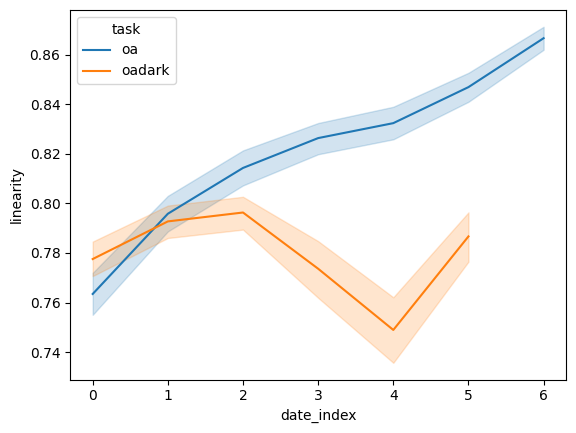

In [607]:
data = joint

sns.lineplot(data = data, x = 'date_index', y = 'linearity', hue = 'task')

<AxesSubplot: xlabel='date_index', ylabel='linearity'>

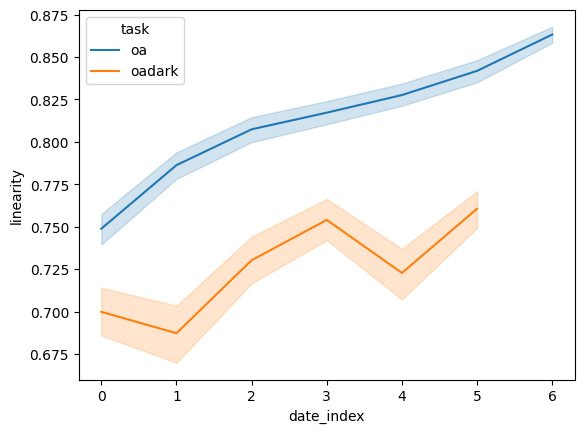

In [14]:
data = pd.concat([light,J704])
data = data.drop(columns=['level_0'])
data = data.reset_index()
sns.lineplot(data = data, x = 'date_index', y = 'linearity', hue = 'task')

<AxesSubplot: xlabel='date_index', ylabel='time'>

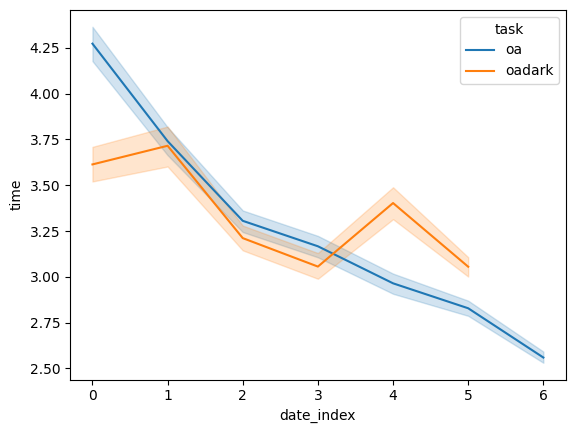

In [15]:
data = pd.concat([light,J704])
data = data.drop(columns=['level_0'])
data = data.reset_index()
sns.lineplot(data = data, x = 'date_index', y = 'time', hue = 'task')

<AxesSubplot: xlabel='date_index', ylabel='avg_lateral_error'>

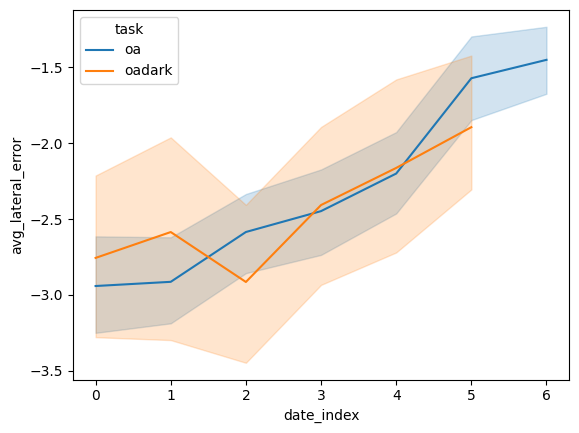

In [16]:
data = pd.concat([light,J704])
data = data.drop(columns=['level_0'])
data = data.reset_index()
sns.lineplot(data = data, x = 'date_index', y = 'avg_lateral_error', hue = 'task')

<AxesSubplot: xlabel='date_index', ylabel='intial_lateral_error'>

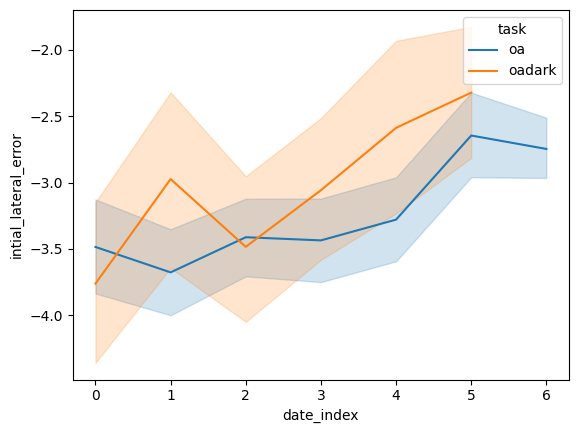

In [18]:
data = pd.concat([light,J704])
data = data.drop(columns=['level_0'])
data = data.reset_index()
sns.lineplot(data = data, x = 'date_index', y = 'intial_lateral_error', hue = 'task')

<AxesSubplot: xlabel='date_index', ylabel='distance_at_head_turn'>

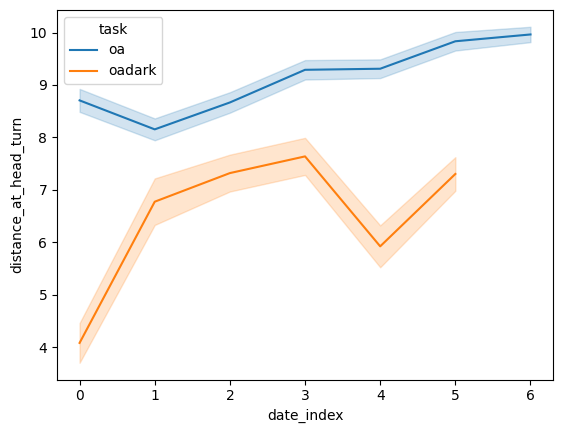

In [22]:
data = pd.concat([light,J704])
data = data.drop(columns=['level_0'])
data = data.reset_index()
sns.lineplot(data = data, x = 'date_index', y = 'distance_at_head_turn', hue = 'task',estimator='median',errorbar='se')

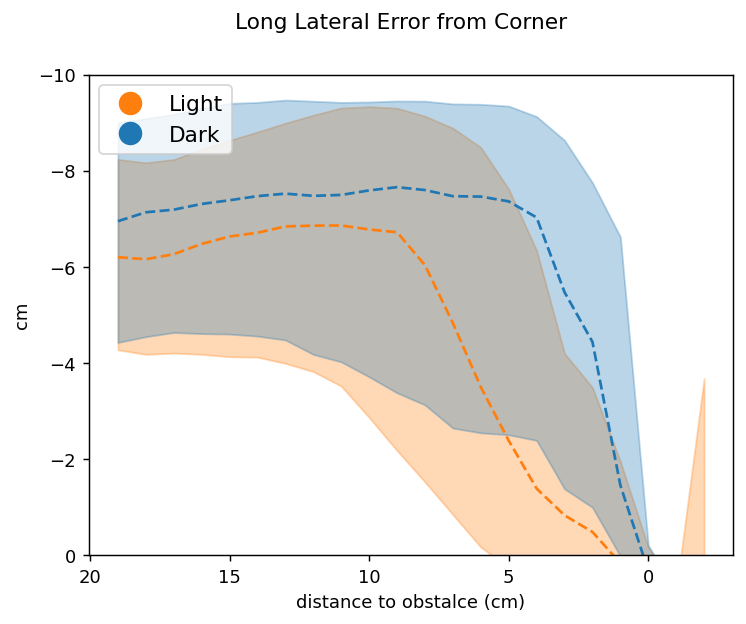

In [35]:

xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Long Lateral Error from Corner')
ax.invert_xaxis()
ax.invert_yaxis()
ax.set_ylim((0,-10))
data = long
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')
for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,xnew.size])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:orange',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:blue',alpha = 1)
ax.set_ylabel('cm')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'upper left',fontsize=12)

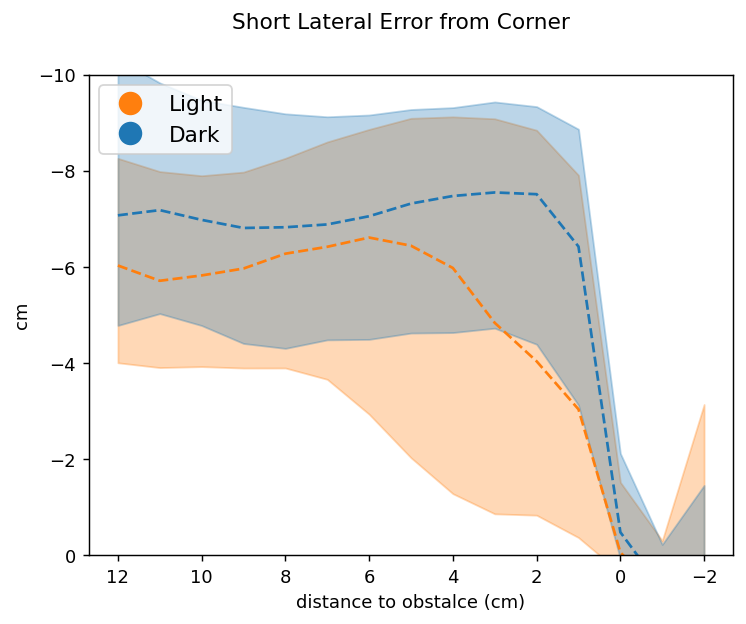

In [40]:

xnew =  np.arange(-2, 13, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Short Lateral Error from Corner')
ax.invert_xaxis()
ax.invert_yaxis()
ax.set_ylim((0,-10))
data = short
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')
for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,xnew.size])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:orange',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:blue',alpha = 1)
ax.set_ylabel('cm')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'upper left',fontsize=12)

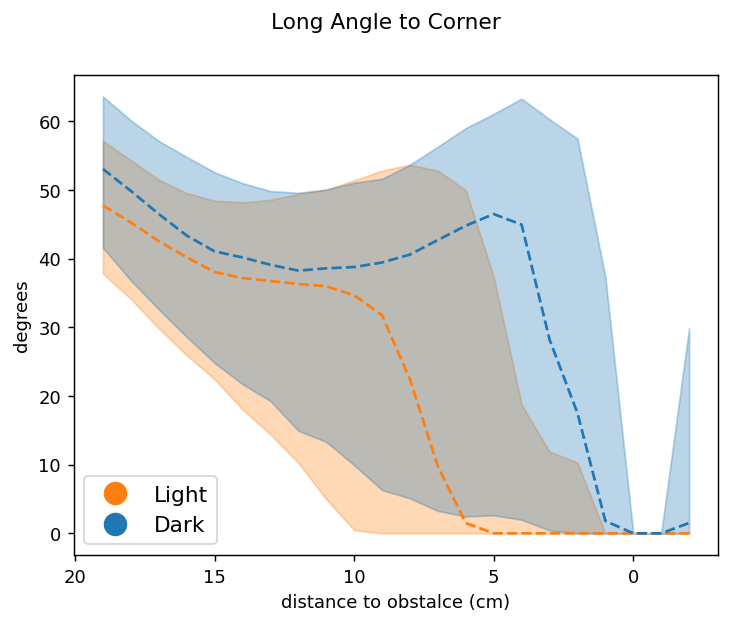

In [41]:

xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Long Angle to Corner')
ax.invert_xaxis()
data = long
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')
for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            #x = resample(x,20)
            #y = resample(np.flip(np.unique(y)),len(x))
            #y = resample(y,len(x))
            interpolater = interp1d(x,y,bounds_error=False)
            #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:orange',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:blue',alpha = 1)
        
ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)

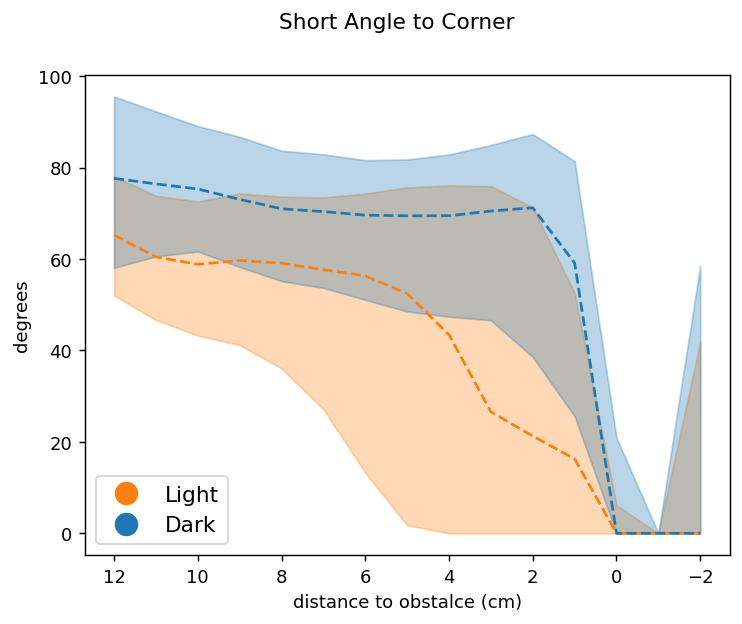

In [42]:

xnew =  np.arange(-2, 13, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Short Angle to Corner')
ax.invert_xaxis()
data = short
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')
for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            #x = resample(x,20)
            #y = resample(np.flip(np.unique(y)),len(x))
            #y = resample(y,len(x))
            interpolater = interp1d(x,y,bounds_error=False)
            #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:orange',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:blue',alpha = 1)
        
ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)

In [47]:
row.head_corner_angle_velocity[:int(row.obstacle_ind)] 

array([-1.831089558696224, -3.354024987557973, -4.361859408739686,
       -4.802794954043463, -4.772104433876041, -4.456608286533926,
       -4.0652005012721775, -3.769645625876552, -3.666843451608013,
       -3.7666487289488115, -4.00528288332898, -4.276800815764986,
       -4.470533217045332, -4.501147691581885, -4.3240494857860154,
       -3.9382017503156366, -3.3818285237416394, -2.72285399759158,
       -2.0435353453761227, -1.42149234404449, -0.9115896491860307,
       -0.5363889504358682, -0.2883145990032791, -0.1411598376970953,
       -0.06270984412150932, -0.02519429826986242, -0.009141504611313887,
       -0.0029552102156408964, -0.0008182111159258622,
       -0.00017495287952674045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
      dtype=object)

In [54]:
np.argwhere(row.head_corner_angle_velocity[:int(row.obstacle_ind)] == row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]

3

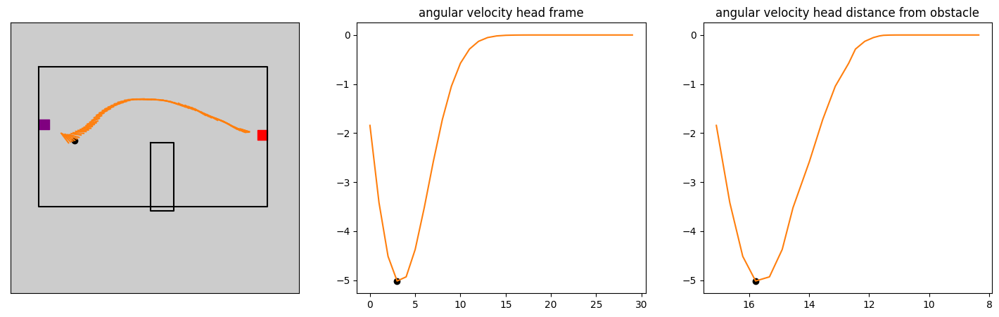

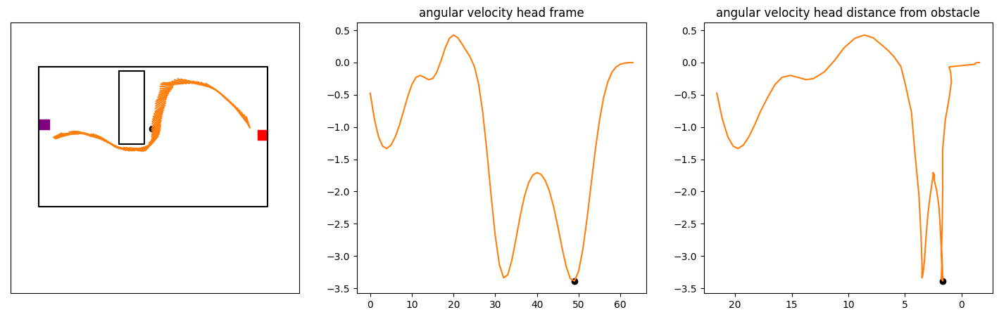

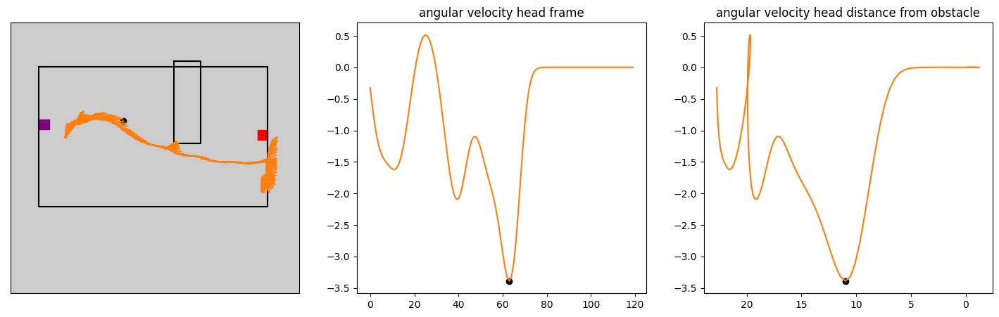

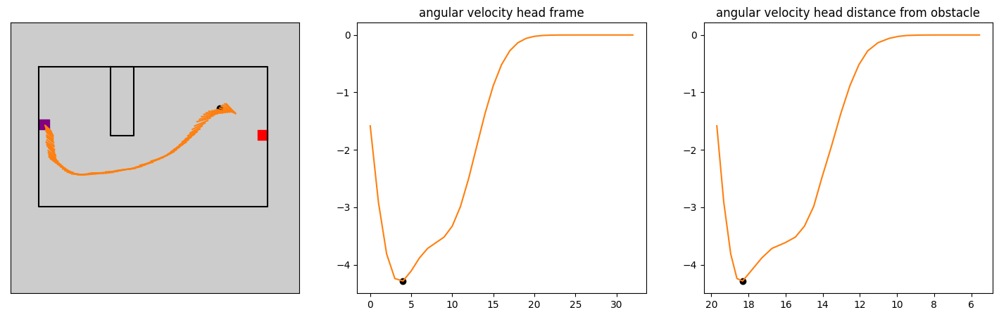

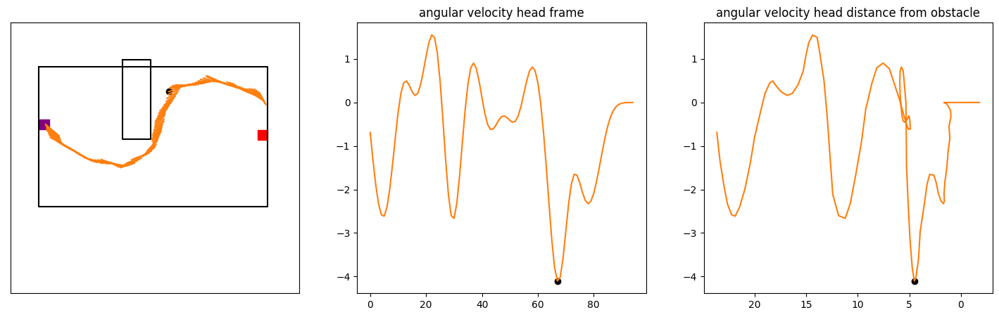

...

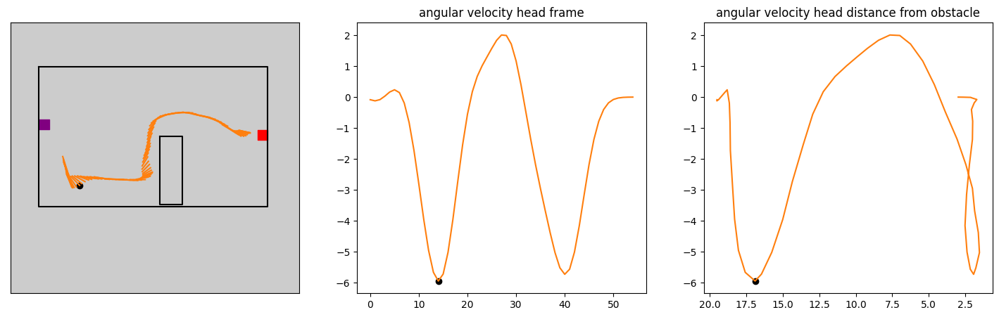

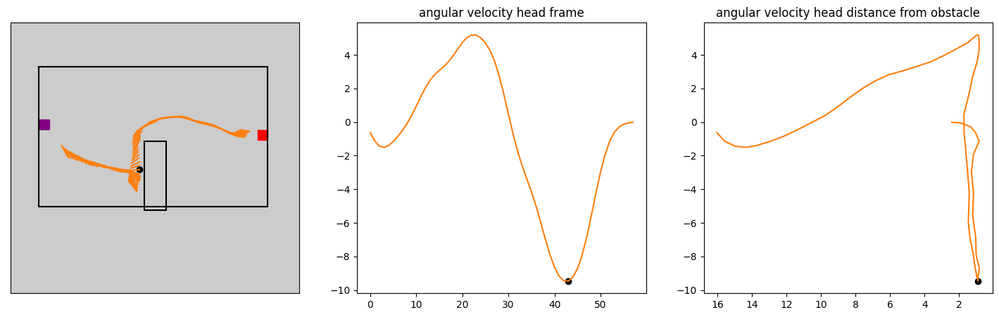

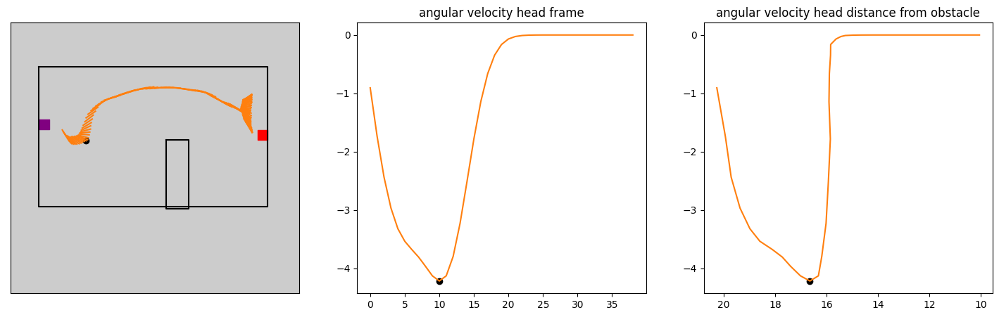

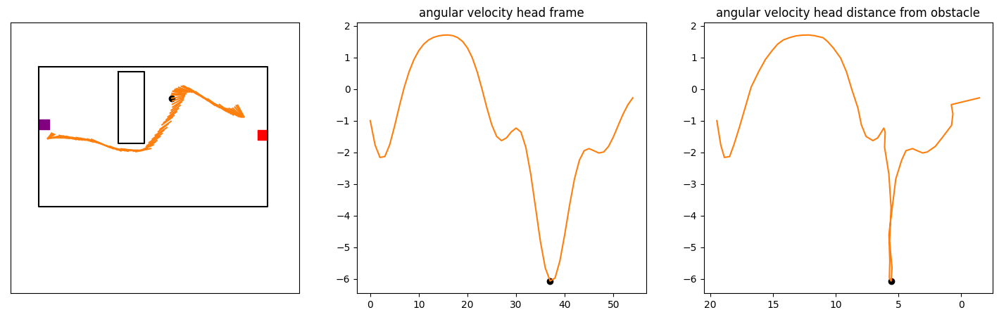

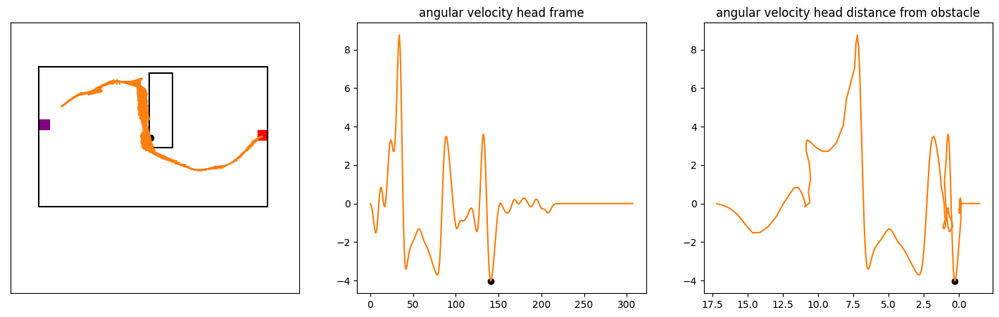

In [57]:
test = long[long.date_index == 0.0].sample(15)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('angular velocity head frame')
    ax[2].set_title('angular velocity head distance from obstacle')
   
    #ax[1].set_ylim(-12,2)

    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    #ax[1].plot(row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_velocity_at_turn_trace,color = 'tab:orange')
    ax[2].plot( row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_corner_angle_velocity[:int(row.obstacle_ind)],color = 'tab:orange')
    thresh = row.head_corner_angle_velocity[:int(row.obstacle_ind)].argmin()
    thresh_ind = np.argwhere(row.head_corner_angle_velocity[:int(row.obstacle_ind)] == row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]
    ax[1].scatter(thresh_ind,row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[2].scatter(row.ts_distance_from_edge[:int(row.obstacle_ind)][thresh],row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[0].scatter(row.ts_nose_x_cm[:int(row.obstacle_ind)][thresh],row.ts_nose_y_cm[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[1].plot(row.head_corner_angle_velocity[:int(row.obstacle_ind)],color = 'tab:orange')

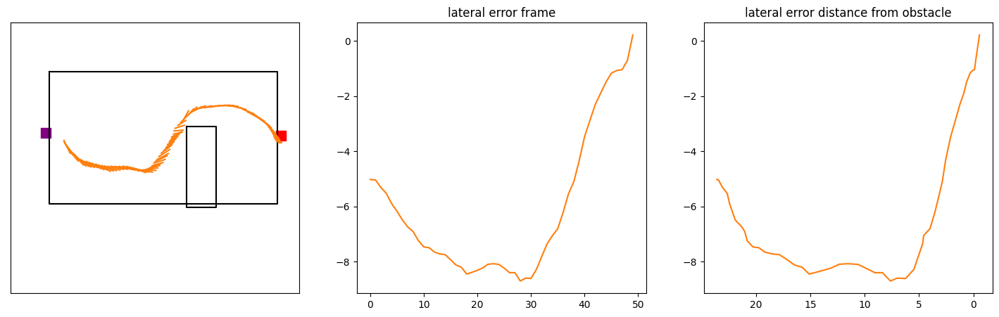

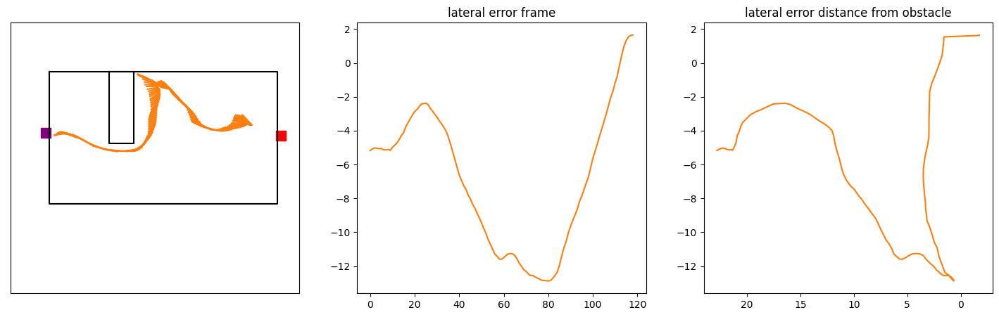

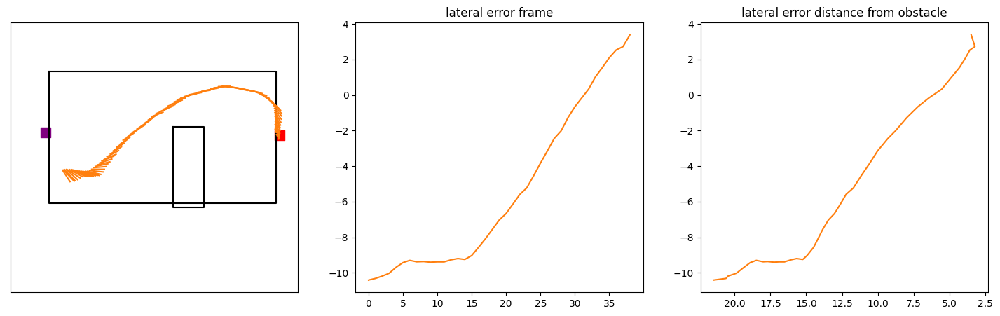

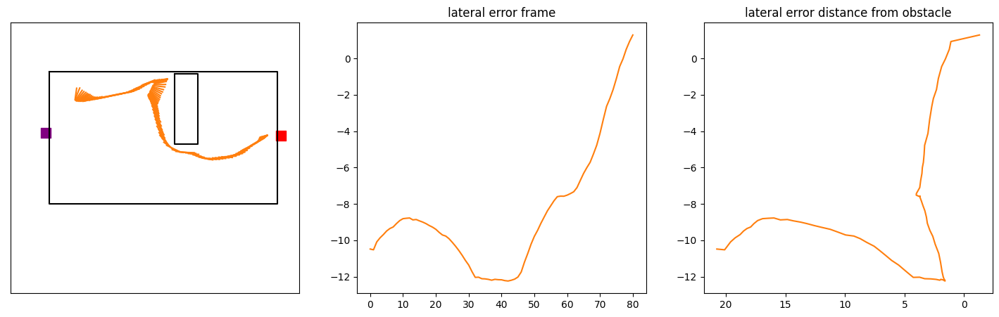

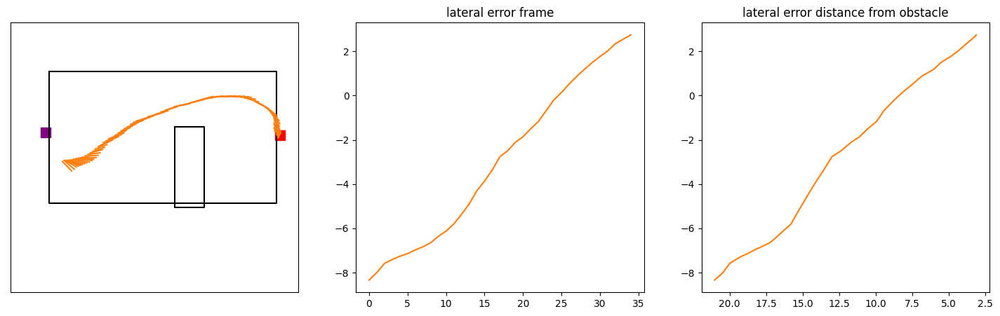

...

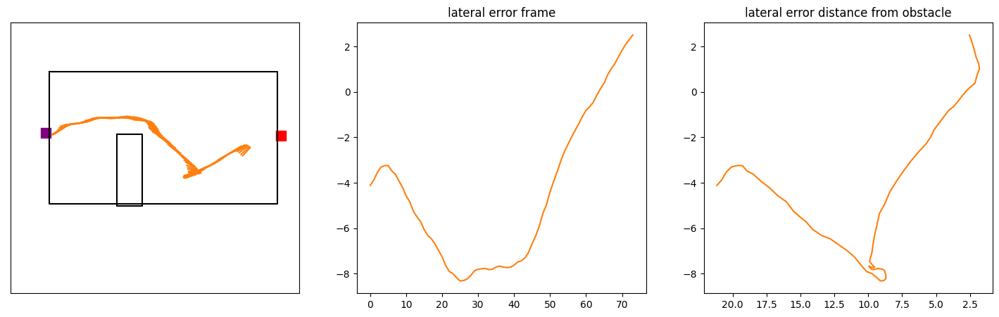

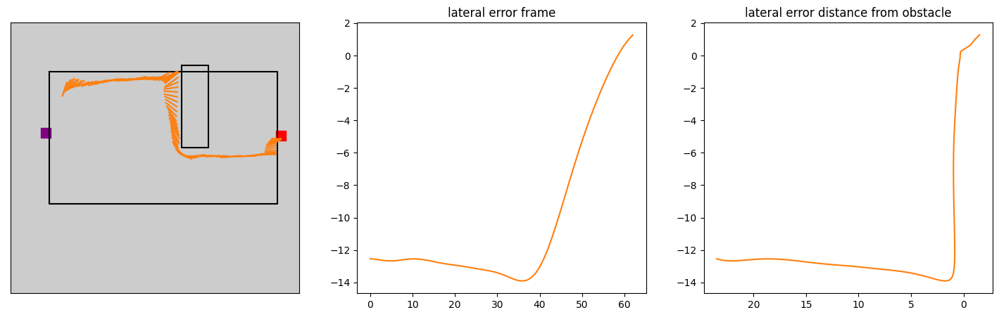

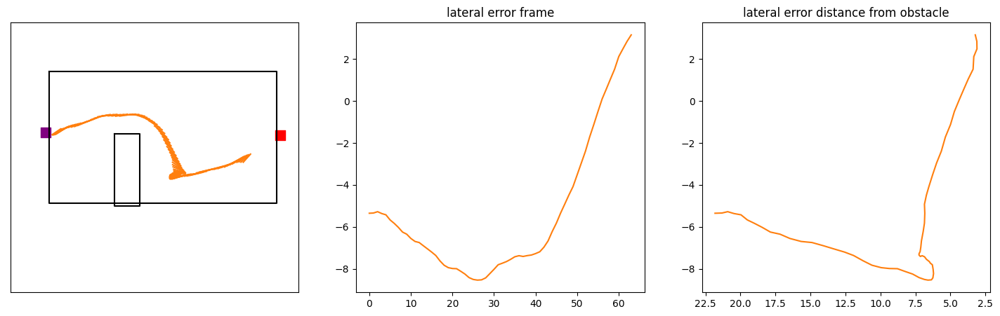

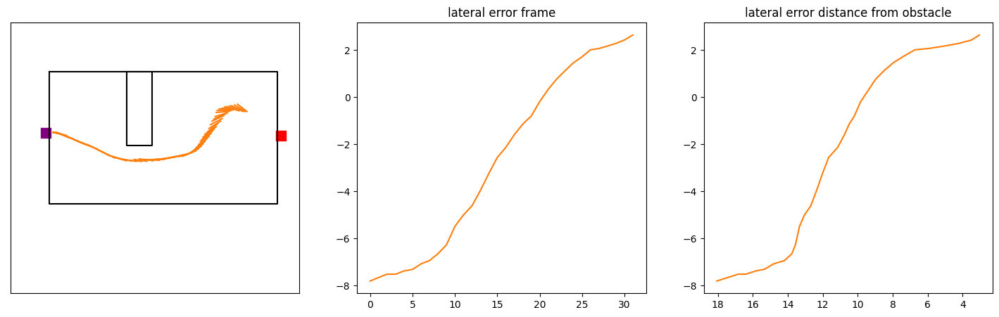

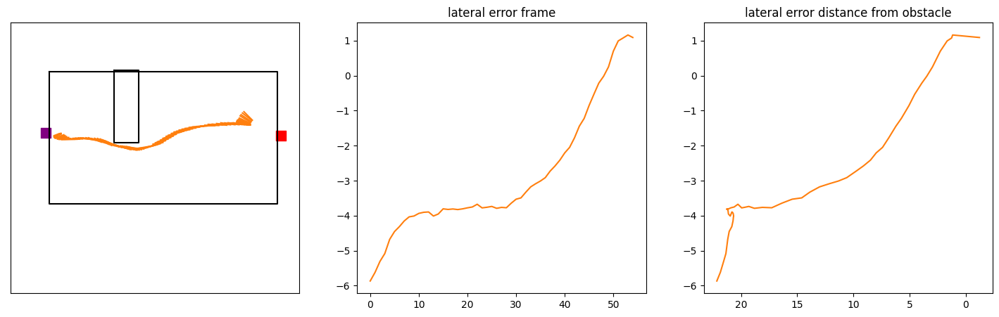

In [64]:
test = long[long.date_index == 3.0].sample(15)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('lateral error frame')
    ax[2].set_title('lateral error distance from obstacle')
   
    #ax[1].set_ylim(-12,2)

    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    #ax[1].plot(row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_velocity_at_turn_trace,color = 'tab:orange')
    ax[2].plot( row.ts_distance_from_edge[:int(row.obstacle_ind)],row.lateral_error[:int(row.obstacle_ind)],color = 'tab:orange')
    thresh = row.head_corner_angle_velocity[:int(row.obstacle_ind)].argmin()
    thresh_ind = np.argwhere(row.head_corner_angle_velocity[:int(row.obstacle_ind)] == row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]
    #ax[1].scatter(thresh_ind,row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[2].scatter(row.ts_distance_from_edge[:int(row.obstacle_ind)][thresh],row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[0].scatter(row.ts_nose_x_cm[:int(row.obstacle_ind)][thresh],row.ts_nose_y_cm[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[1].plot(row.lateral_error[:int(row.obstacle_ind)],color = 'tab:orange')

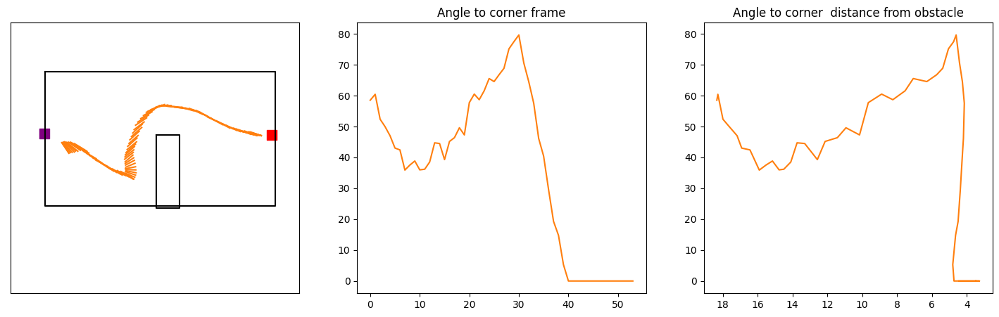

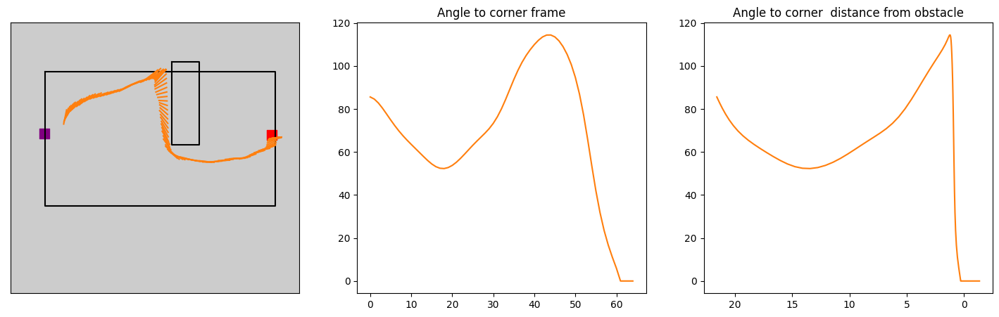

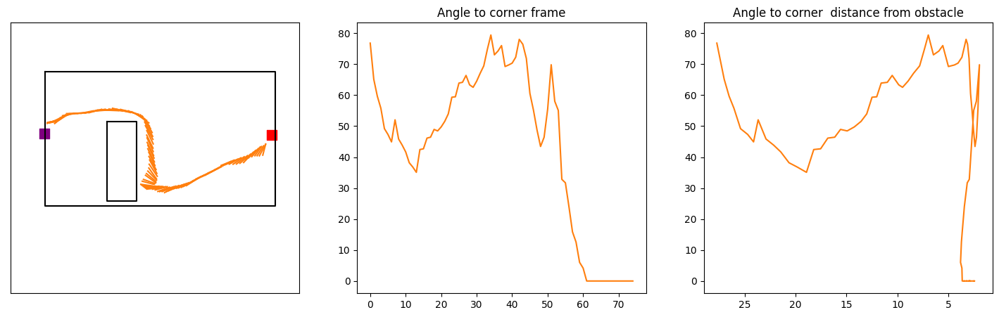

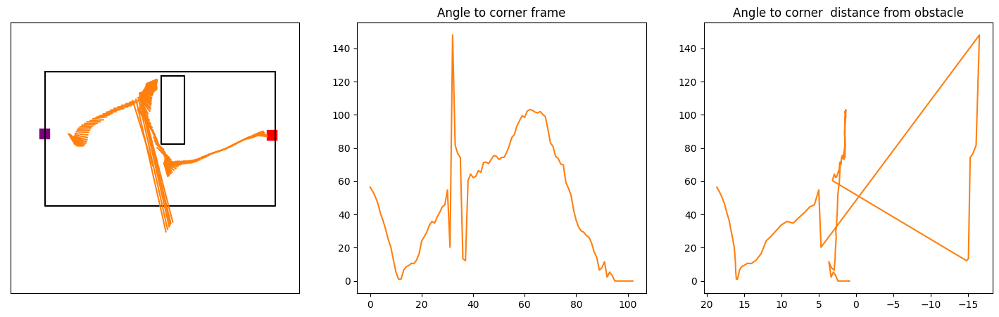

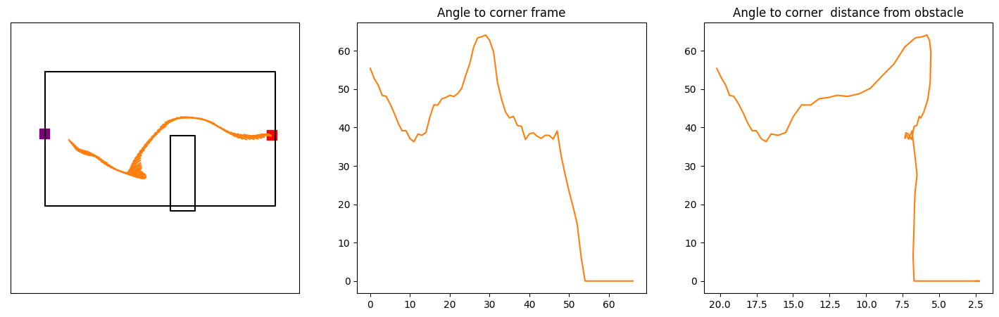

...

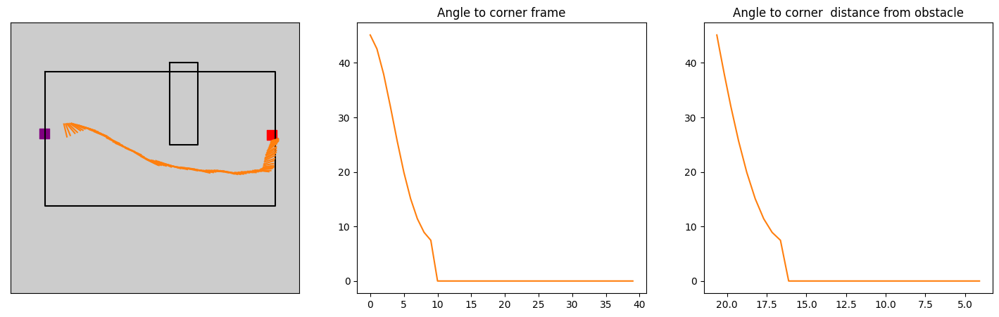

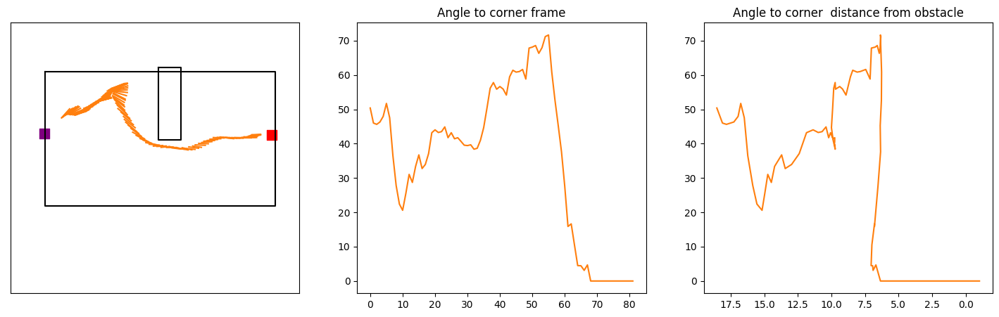

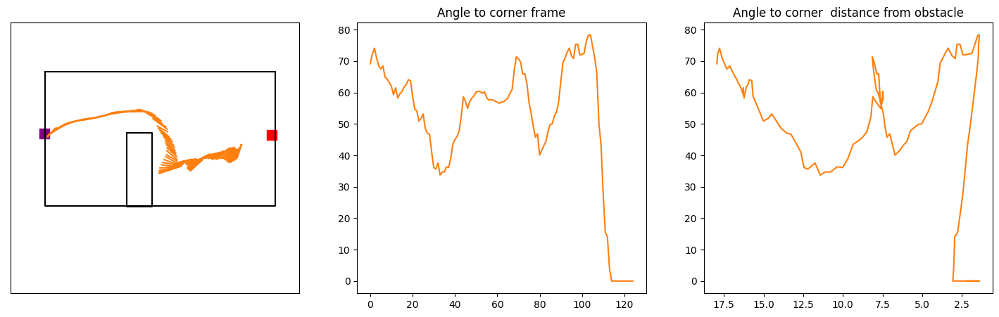

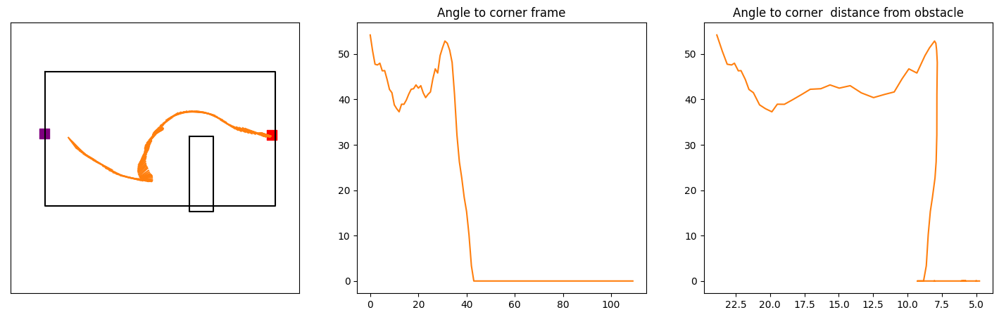

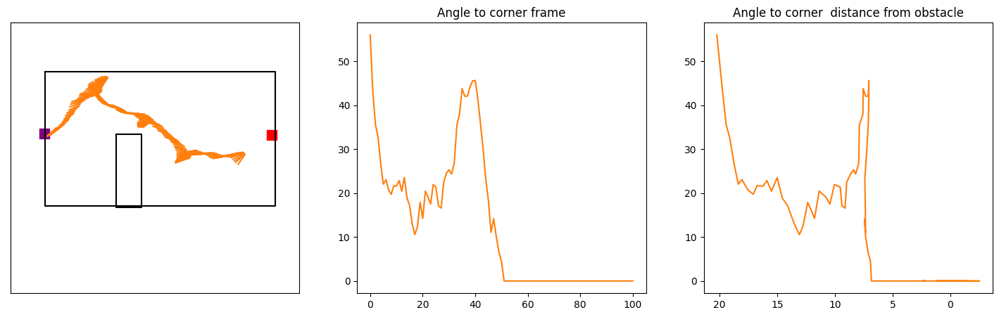

In [65]:
test = long[long.date_index == 3.0].sample(15)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('Angle to corner frame')
    ax[2].set_title('Angle to corner  distance from obstacle')
   
    #ax[1].set_ylim(-12,2)

    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    #ax[1].plot(row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_velocity_at_turn_trace,color = 'tab:orange')
    ax[2].plot( row.ts_distance_from_edge[:int(row.obstacle_ind)],row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)],color = 'tab:orange')
    thresh = row.head_corner_angle_velocity[:int(row.obstacle_ind)].argmin()
    thresh_ind = np.argwhere(row.head_corner_angle_velocity[:int(row.obstacle_ind)] == row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]
    #ax[1].scatter(thresh_ind,row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[2].scatter(row.ts_distance_from_edge[:int(row.obstacle_ind)][thresh],row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[0].scatter(row.ts_nose_x_cm[:int(row.obstacle_ind)][thresh],row.ts_nose_y_cm[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[1].plot(row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)],color = 'tab:orange')

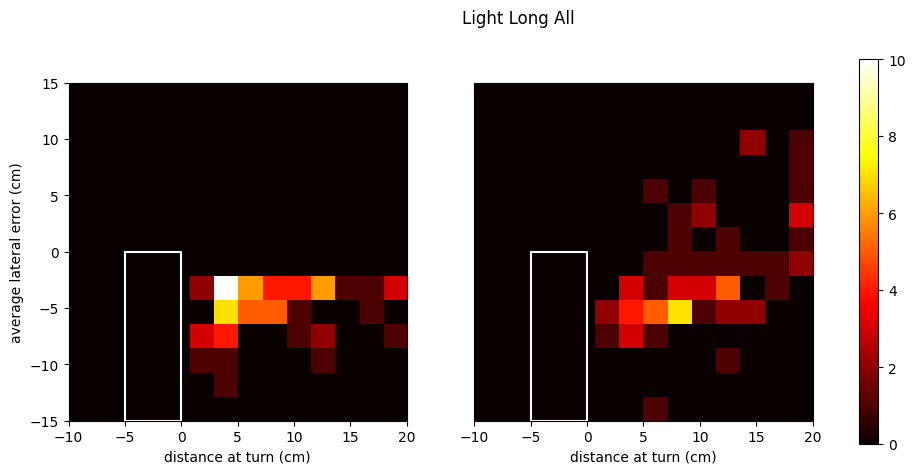

In [15]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
long_short = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Light Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

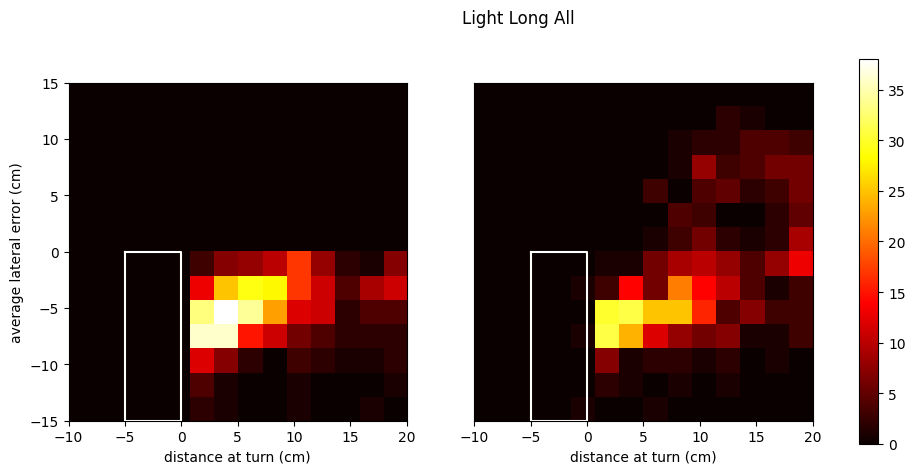

In [19]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = long_short
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.avg_lateral_error <= -2) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = data.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Light Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

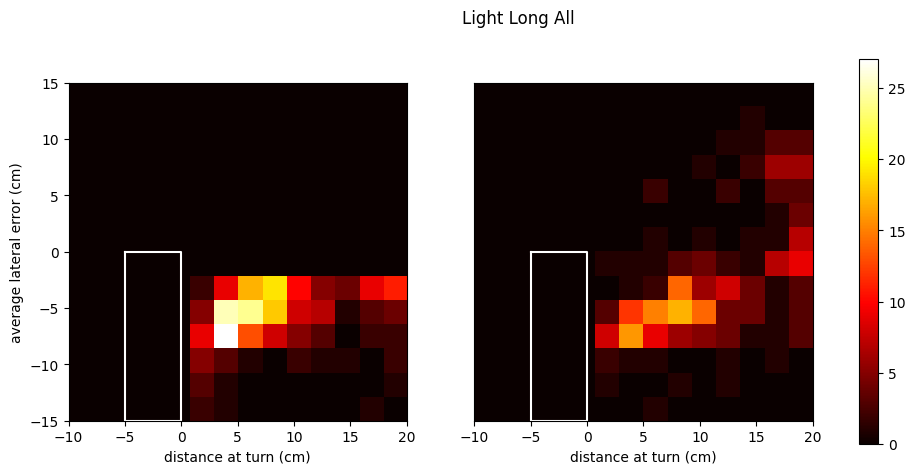

In [20]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Light Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

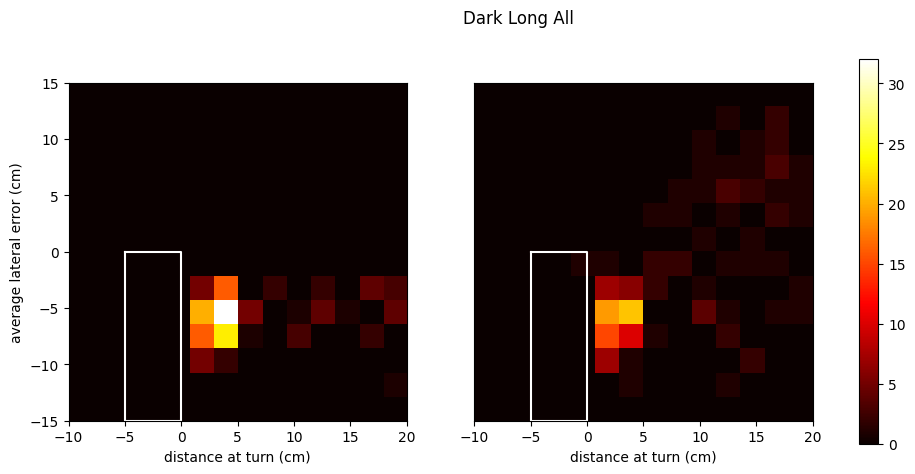

In [663]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
long_short = pd.concat([long_con,short_con])
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Dark Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

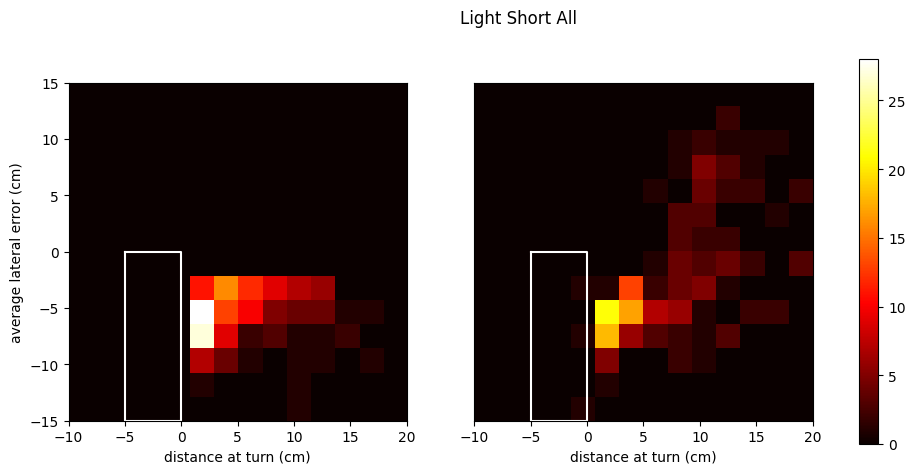

In [661]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
long_short = pd.concat([long_con,short_con])
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Light Short All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

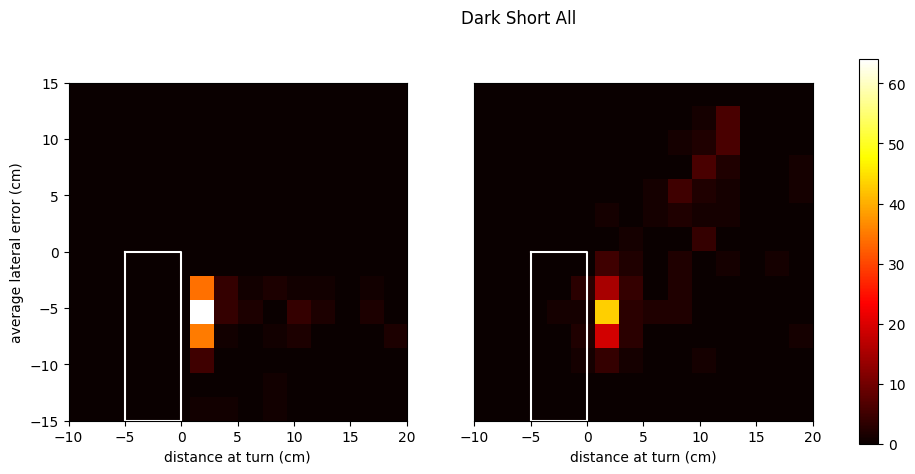

In [664]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
long_short = pd.concat([long_con,short_con])
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Dark Short All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

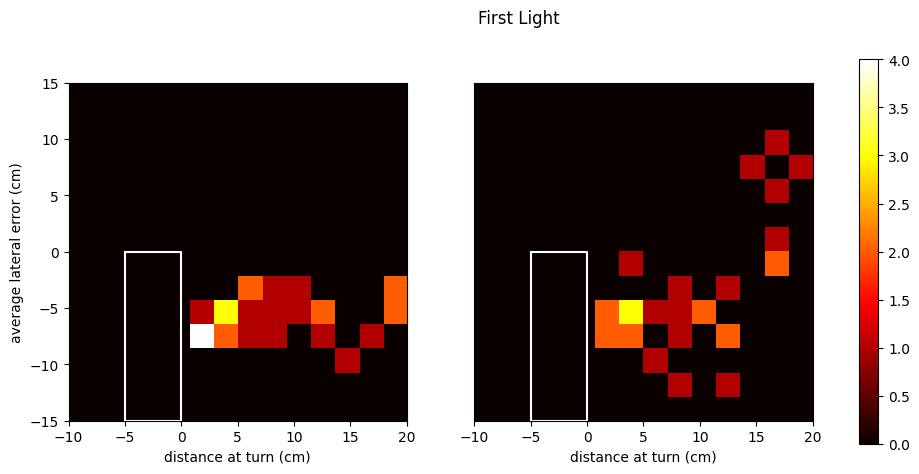

In [597]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Light')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

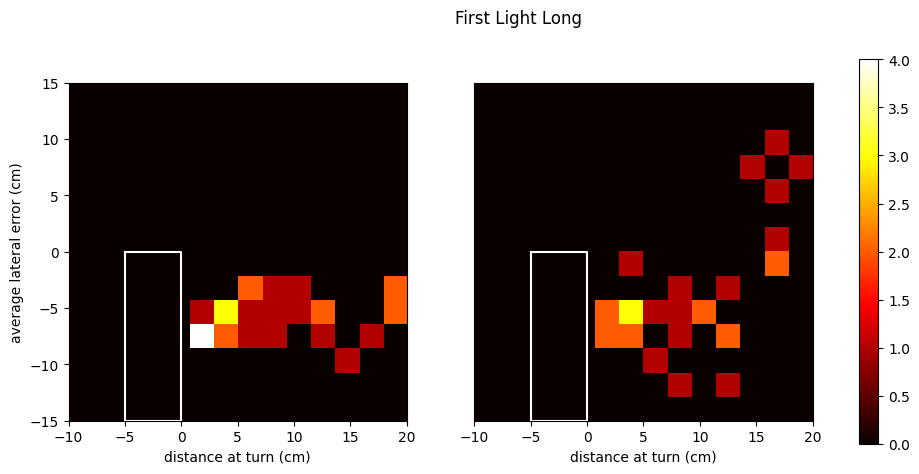

In [600]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Light Long')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

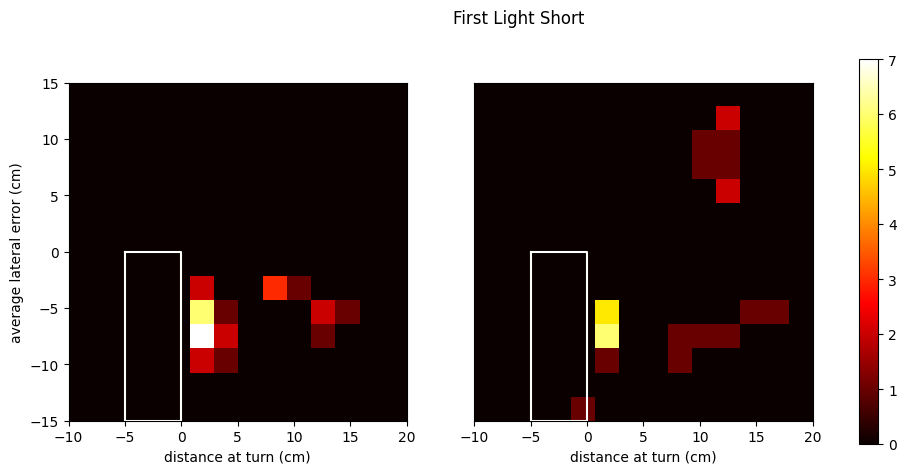

In [601]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Light Short')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

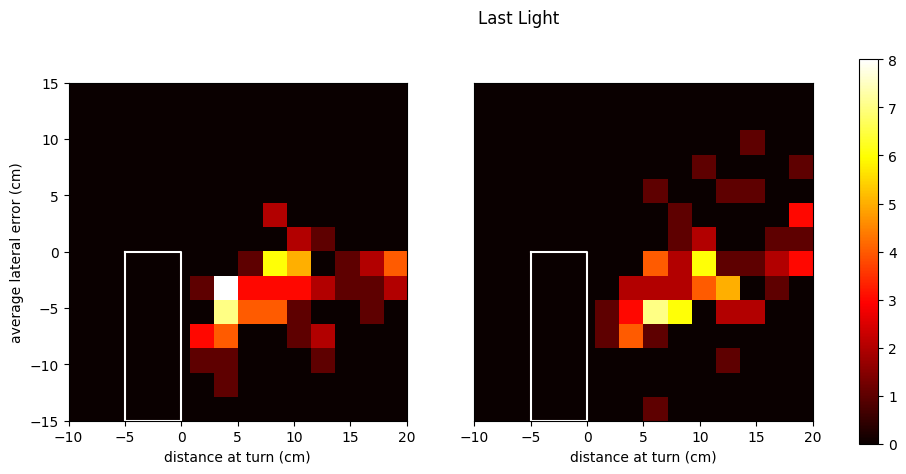

In [695]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.intial_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Light')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')


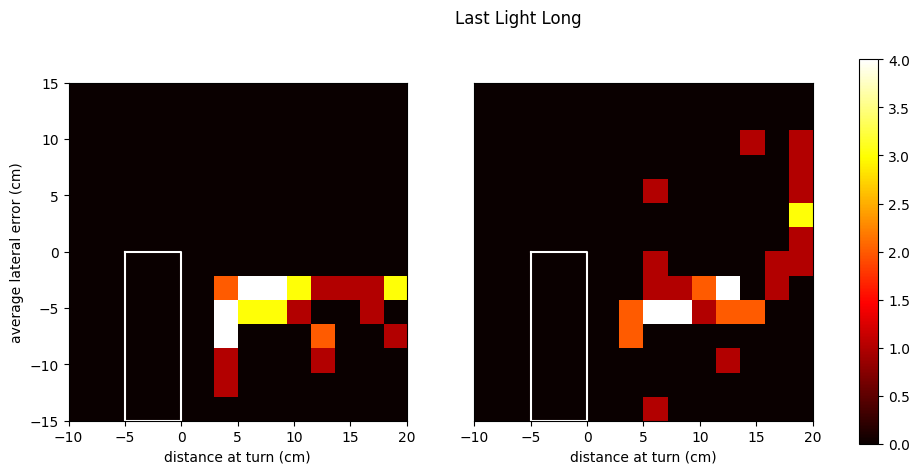

In [602]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Light Long')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

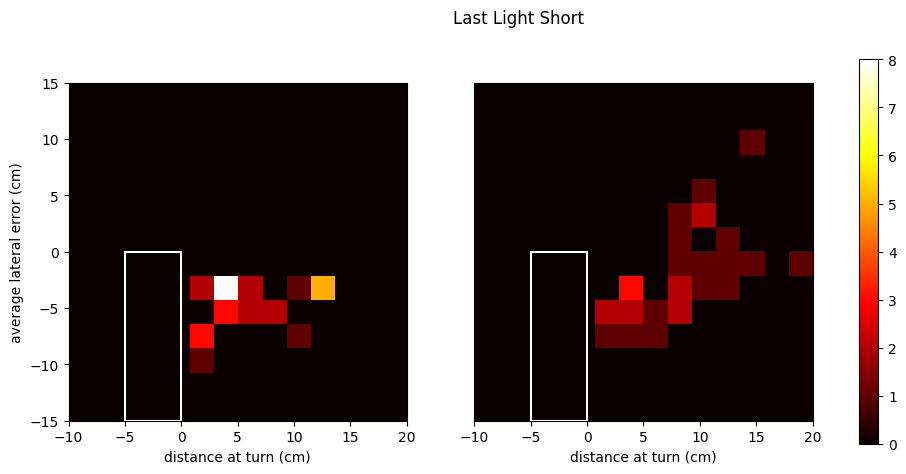

In [604]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Light Short')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

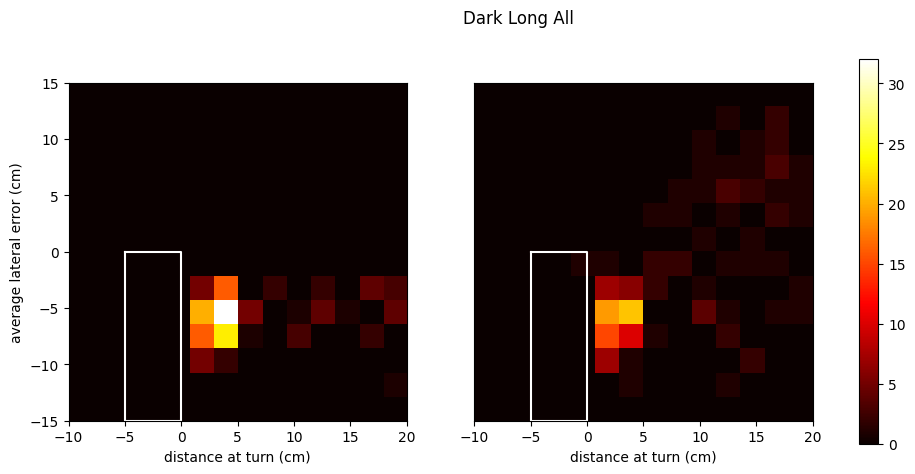

In [614]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Dark Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

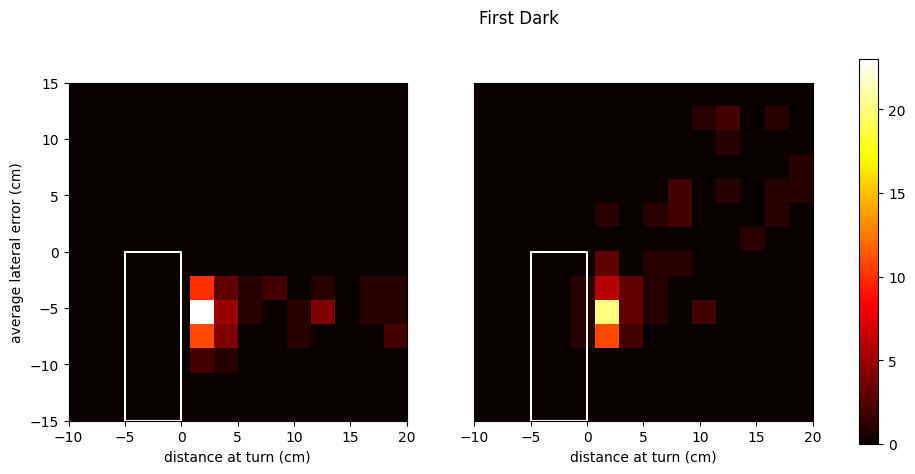

In [589]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Dark')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

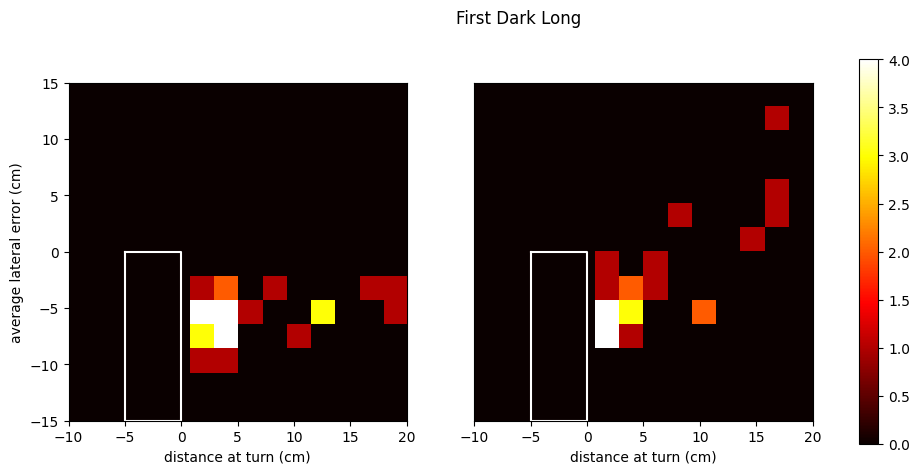

In [605]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Dark Long')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

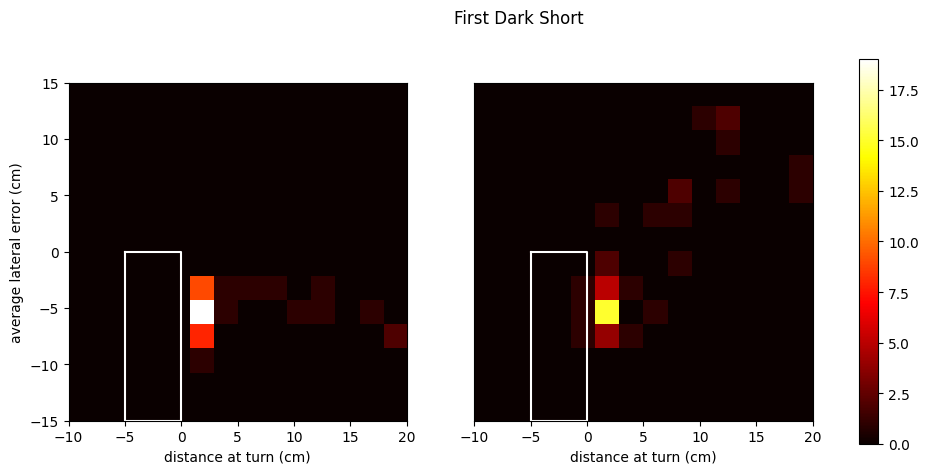

In [607]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Dark Short')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

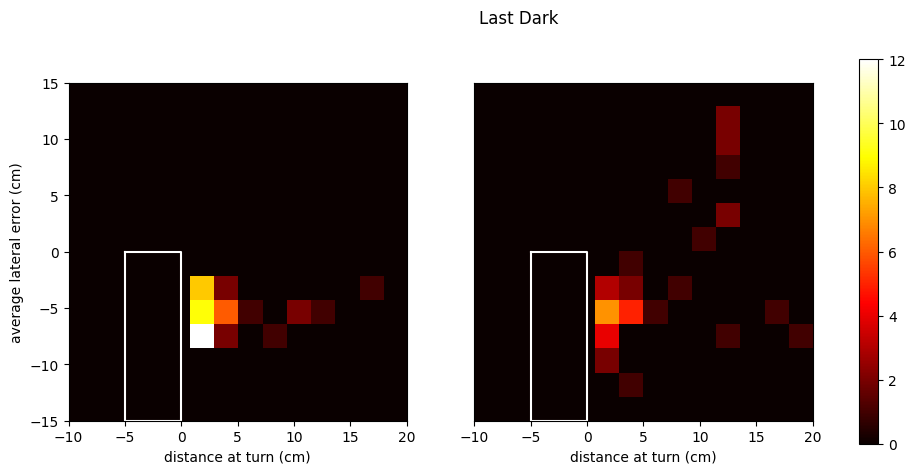

In [610]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Dark')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')


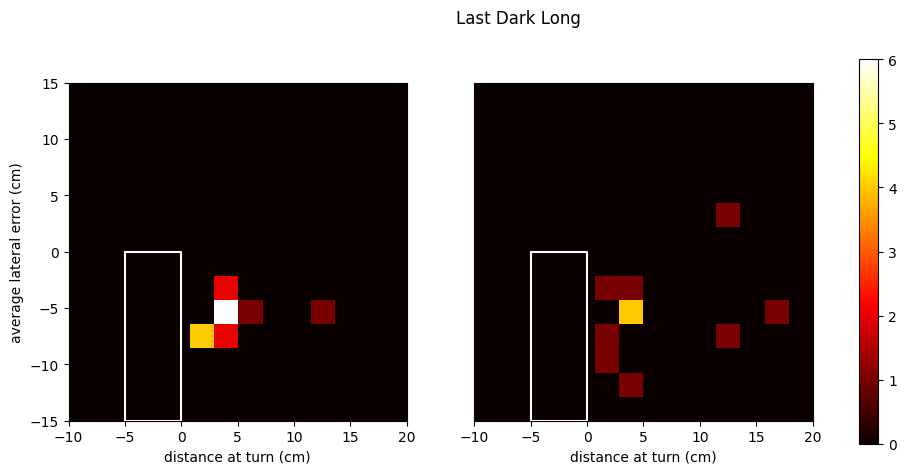

In [629]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Dark Long')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')


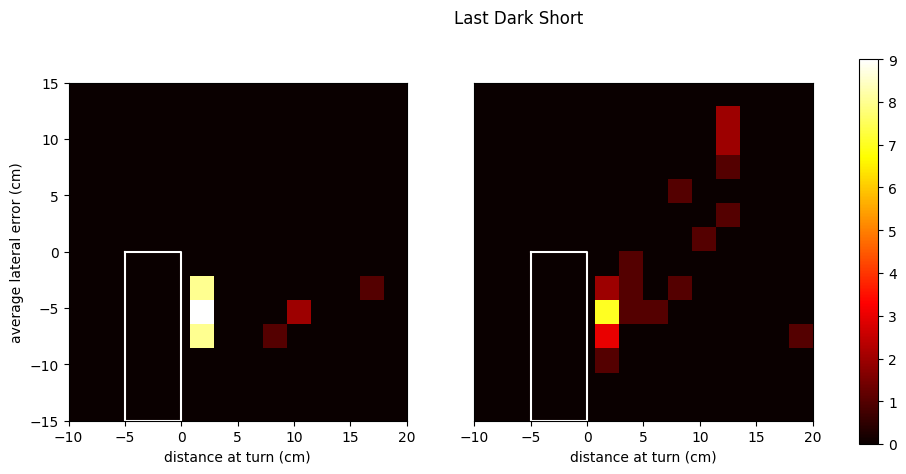

In [612]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Dark Short')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

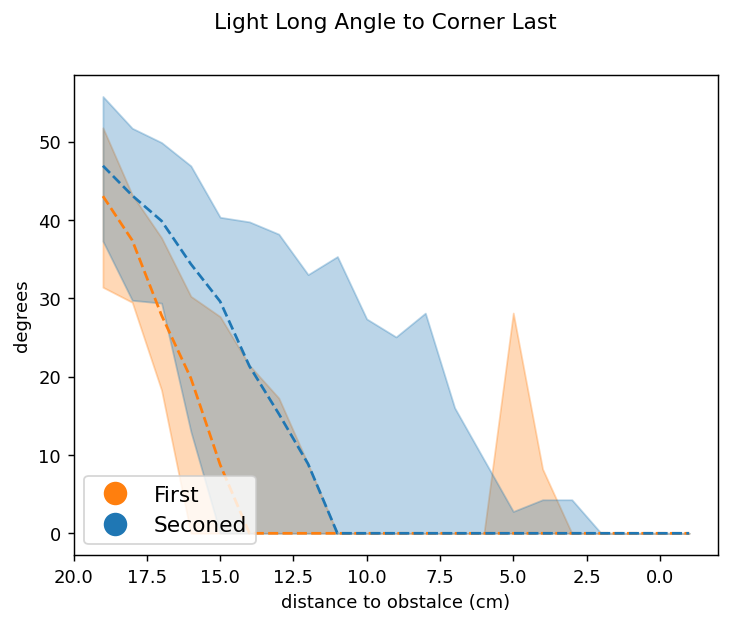

In [90]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Angle to Corner Last')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error >= 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

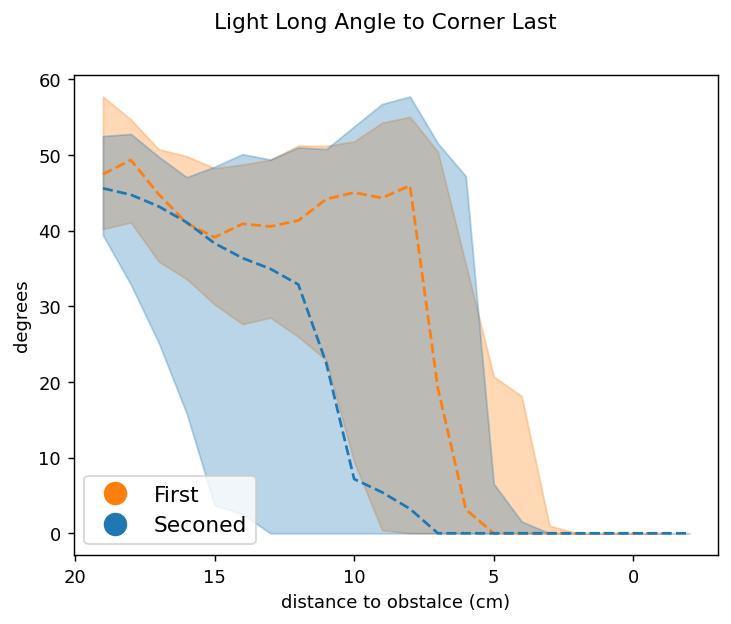

In [653]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Angle to Corner Last')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

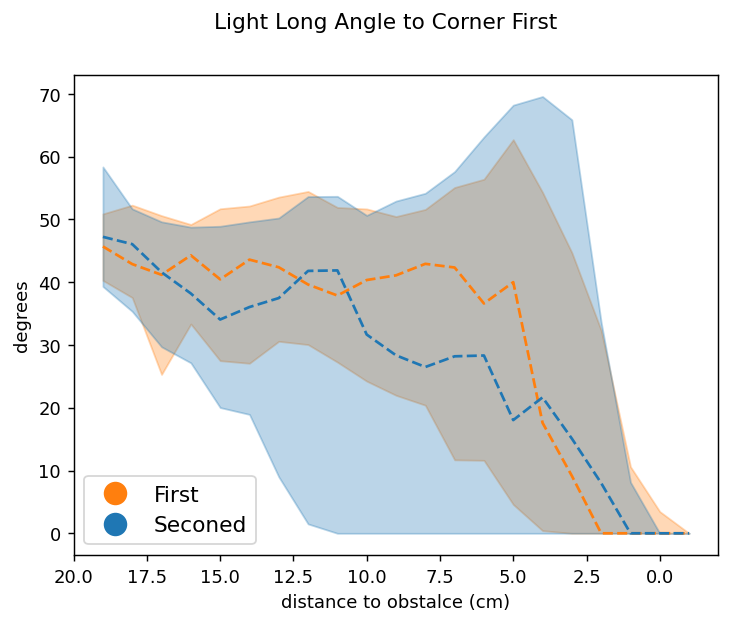

In [654]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Angle to Corner First')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

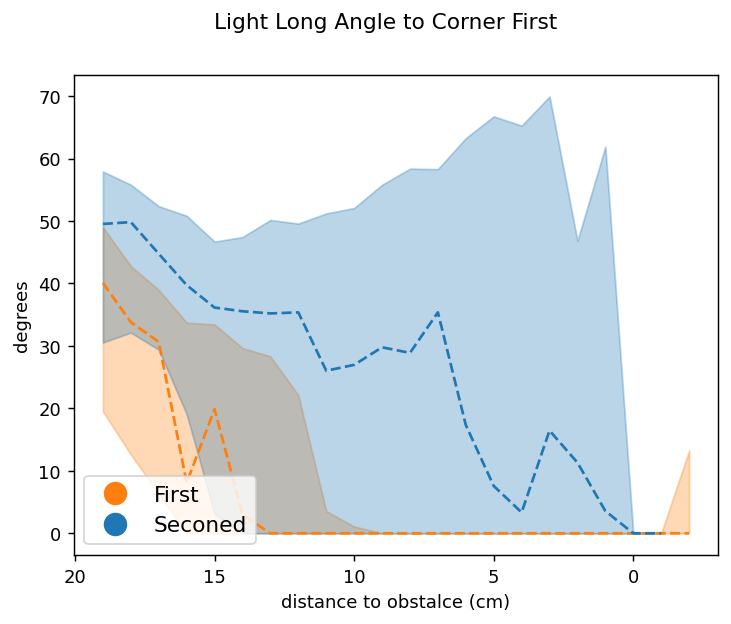

In [91]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Angle to Corner First')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error >= 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

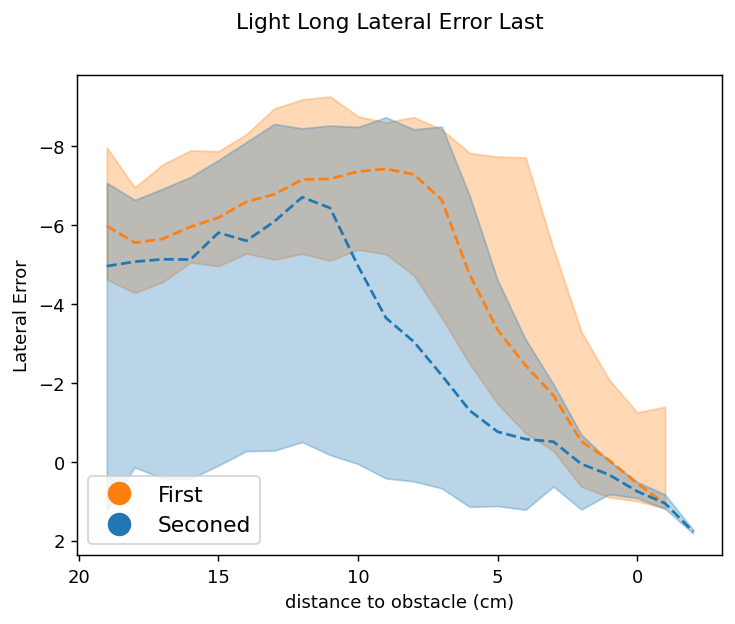

In [53]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error Last')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

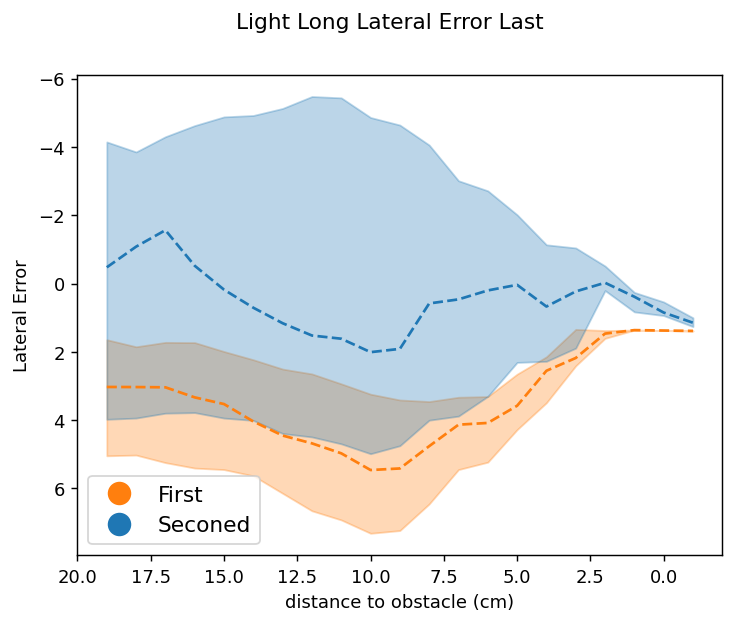

In [92]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error Last')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error >= 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

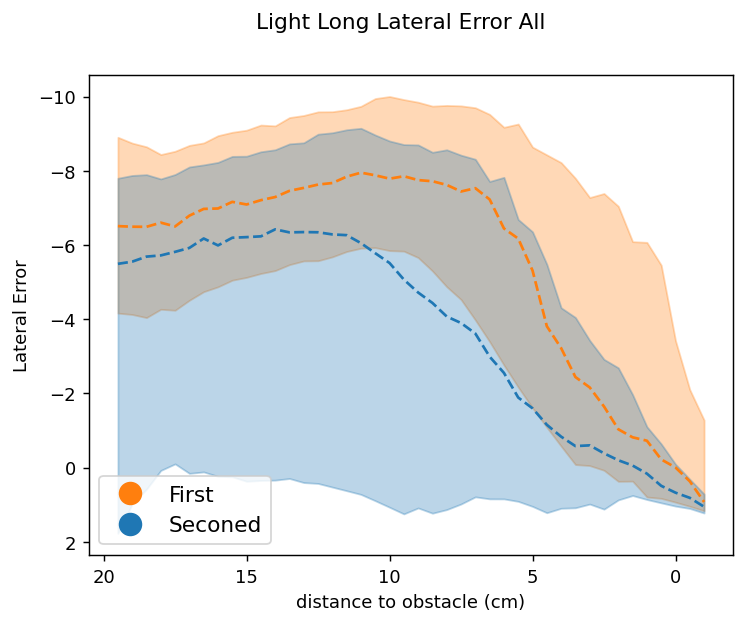

In [290]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-1, 20, .5)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error All')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, t1q1, t1q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, edge_outliers(t1q1,1), t1q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,edge_outliers(first_angle_median,1),'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

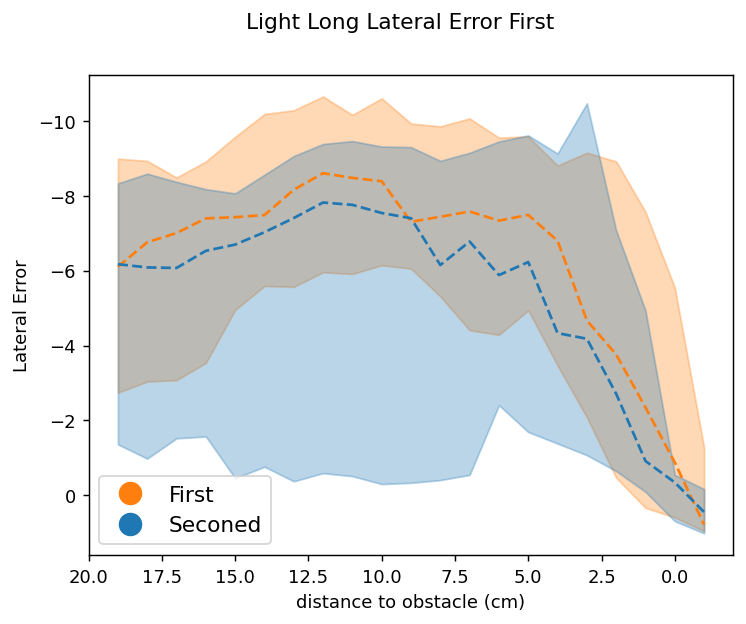

In [58]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error First')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

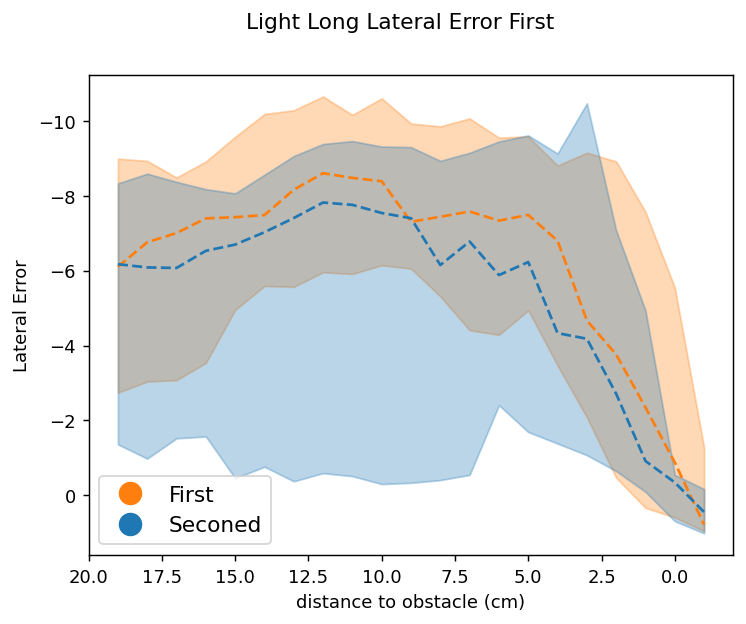

In [297]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error First')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

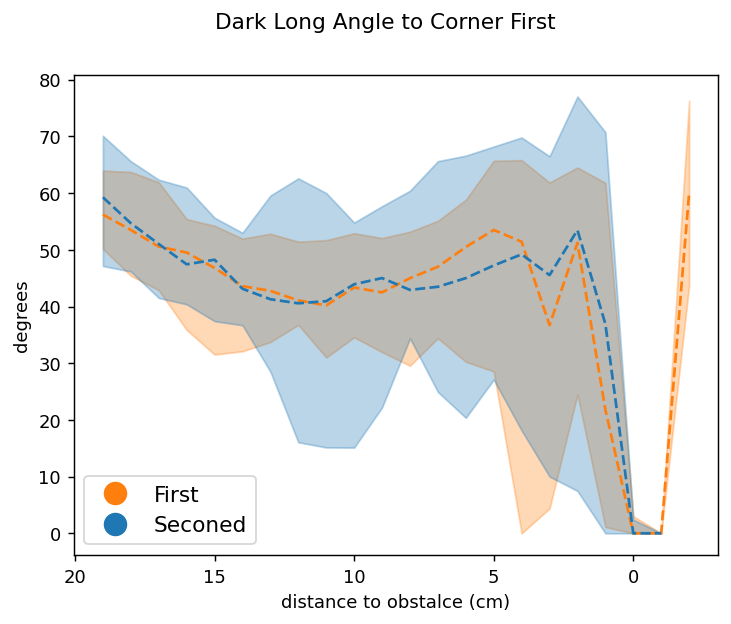

In [659]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Angle to Corner First')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

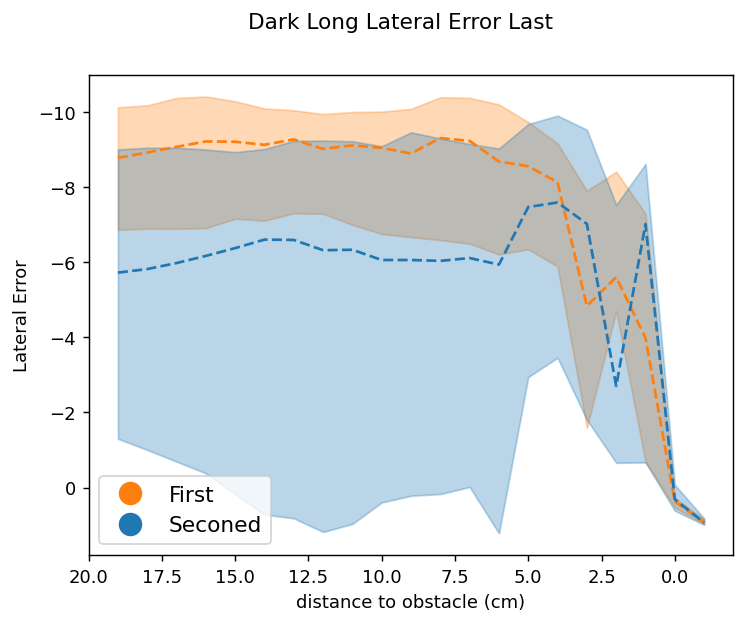

In [63]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Lateral Error Last')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

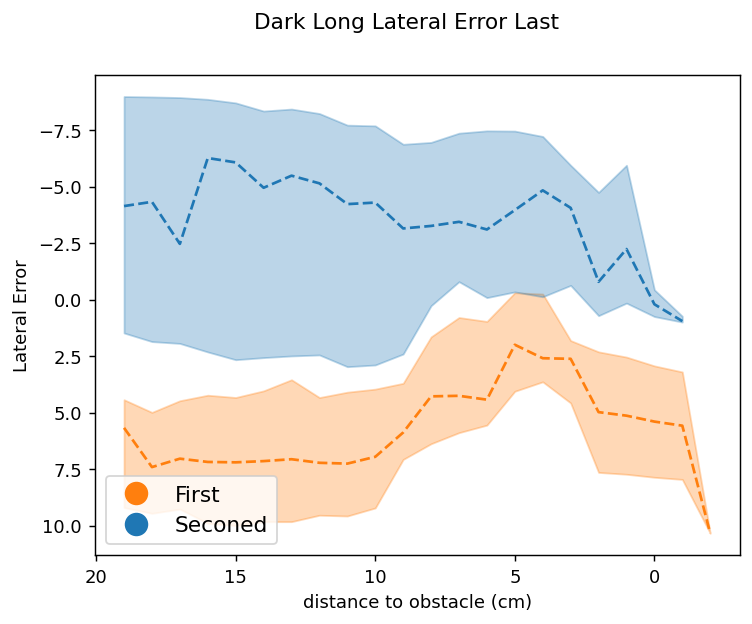

In [94]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Lateral Error Last')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error >= 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

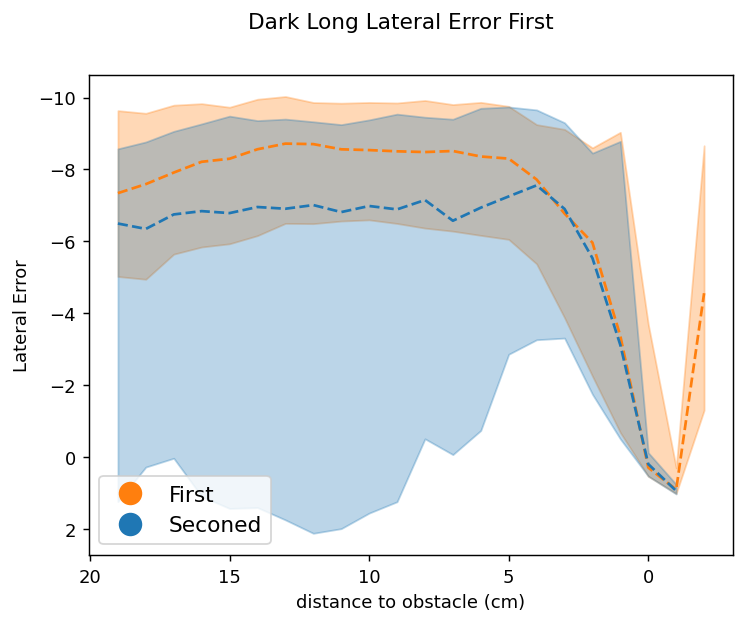

In [262]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Lateral Error First')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

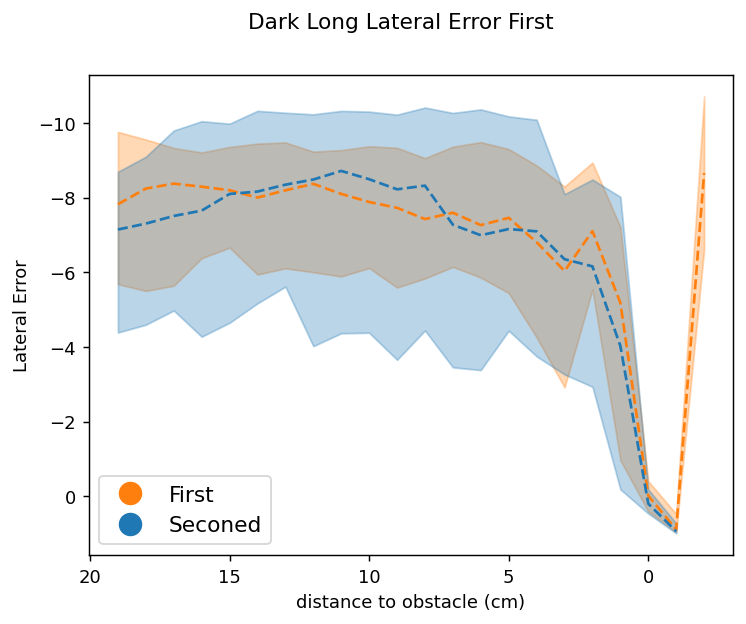

In [259]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Lateral Error First')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

In [ ]:
def con_df_prob_switch_obstacle_turn(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -2) &(date_df.distance_at_head_turn >= 0)]
                ind = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind.tolist()]
                switch = []
                for ind,row in enumerate(first_trial.start.tolist()):
                    if row == third_trial.start.tolist()[ind]:
                        switch.append(0)
                    else:
                        switch.append(1)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch'].append(sum(switch)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [285]:
def smooth(points,sigma = 3):
    filtered = gaussian_filter(points.astype(float),sigma = sigma)
    return filtered


In [165]:
def con_df_prob_switch_turn_obstacle(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial_ob','switch_third_trial_ob','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -2) &(date_df.distance_at_head_turn >= 0)]
                ind_2 = first_trial.index.to_numpy()+1
                sec_trial = long_short.loc[ind_2.tolist()] 
                ind_3 = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind_3.tolist()]
                switch_2 = []
                switch_3 = []
                for ind,row in enumerate(first_trial.turn_to_obstacle.tolist()):
                    if row == sec_trial.turn_to_obstacle.tolist()[ind]:
                        switch_2.append(0)
                    else:
                        switch_2.append(1)
                for ind,row in enumerate(sec_trial.turn_to_obstacle.tolist()):
                    
                    if row == third_trial.turn_to_obstacle.tolist()[ind]:
                        switch_3.append(0)
                    else:
                        switch_3.append(1)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch_sec_trial_ob'].append(sum(switch_2)/len(first_trial))
                dictlists['switch_third_trial_ob'].append(sum(switch_3)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [171]:
def con_df_prob_switch_turn(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial','switch_third_trial','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -2) &(date_df.distance_at_head_turn >= 0)]
                ind_2 = first_trial.index.to_numpy()+1
                sec_trial = long_short.loc[ind_2.tolist()]
                ind_3 = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind_3.tolist()]
                switch_2 = []
                switch_3 = []
                for ind,row in enumerate(first_trial.turn_direction.tolist()):
                    if row == sec_trial.turn_direction.tolist()[ind]:
                        switch_2.append(1)
                    else:
                        switch_2.append(0)
                for ind,row in enumerate(sec_trial.turn_direction.tolist()):
                    
                    if row == third_trial.turn_direction.tolist()[ind]:
                        switch_3.append(1)
                    else:
                        switch_3.append(0)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch_sec_trial'].append(sum(switch_2)/len(first_trial))
                dictlists['switch_third_trial'].append(sum(switch_3)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [442]:
def con_df_prob_switch_turn_type(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial_type','switch_sec_trial','switch_third_trial_type','switch_third_trial','task','animal','obstacle_cluster','switch_type_all']}
    #long_con, short_con,middle_con = create_df_by_type_nostart(df)
    #df = pd.concat([long_con,short_con])
    for ani,animal_df in df.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                for i,inds in enumerate(date_df.consective_inds.unique().tolist()):
                    trials_ind = ast.literal_eval(date_df.consective_inds.unique()[i])
                    trials = date_df.loc[trials_ind]
                    dictlists['switch_sec_trial_type'].append(trials.iloc[0].turn_direction +'_' +trials.iloc[1].turn_direction )
                    if trials.iloc[0].turn_direction == trials.iloc[1].turn_direction:
                         dictlists['switch_sec_trial'].append(0)
                    else:
                         dictlists['switch_sec_trial'].append(1)

                    dictlists['switch_third_trial_type'].append(trials.iloc[1].turn_direction +'_' +trials.iloc[2].turn_direction)
                    if trials.iloc[1].turn_direction == trials.iloc[2].turn_direction:
                         dictlists['switch_third_trial'].append(0)
                    else:
                         dictlists['switch_third_trial'].append(1)
                    dictlists['switch_type_all'].append(trials.iloc[0].turn_direction + '_' + trials.iloc[1].turn_direction+'_' +trials.iloc[2].turn_direction)
                    dictlists['date_index'].append(date)
                    dictlists['trials'].append(len(trials_ind))
                    dictlists['obstacle_cluster'].append(trials.obstacle_cluster.unique()[0])
                    dictlists['task'].append(task)
                    dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [476]:
def con_df_prob_switch_turn_obstacle_type(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial_type','switch_sec_trial','switch_third_trial_type','switch_third_trial','task','animal','obstacle_cluster'
                                     ,'switch_type_all','inital_turn','initial_linearity','trials_inds']}
    #long_con, short_con,middle_con = create_df_by_type_nostart(df)
    #df = pd.concat([long_con,short_con])
    for ani,animal_df in df.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                for i,inds in enumerate(date_df.consective_inds.unique().tolist()):
                    trials_ind = ast.literal_eval(date_df.consective_inds.unique()[i])
                    trials = date_df.loc[trials_ind]
                    dictlists['switch_sec_trial_type'].append(trials.iloc[0].turn_to_obstacle + '_' + trials.iloc[1].turn_to_obstacle )
                    if trials.iloc[0].turn_to_obstacle == trials.iloc[1].turn_to_obstacle:
                         dictlists['switch_sec_trial'].append(0)
                    else:
                         dictlists['switch_sec_trial'].append(1)

                    dictlists['switch_third_trial_type'].append(trials.iloc[1].turn_to_obstacle +'_' +trials.iloc[2].turn_to_obstacle)
                    if trials.iloc[1].turn_to_obstacle == trials.iloc[2].turn_to_obstacle:
                         dictlists['switch_third_trial'].append(0)
                    else:
                         dictlists['switch_third_trial'].append(1)
                    dictlists['switch_type_all'].append(trials.iloc[0].turn_to_obstacle + '_' + trials.iloc[1].turn_to_obstacle+'_' +trials.iloc[2].turn_to_obstacle)
                    dictlists['initial_linearity'].append(trials.iloc[0].linearity )
                    dictlists['trials_inds'].append(trials_ind)
                    dictlists['inital_turn'].append(trials.iloc[0].turn_to_obstacle )
                    dictlists['date_index'].append(date)
                    dictlists['trials'].append(len(trials_ind))
                    dictlists['obstacle_cluster'].append(trials.obstacle_cluster.unique()[0])
                    dictlists['task'].append(task)
                    dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [ ]:
trials.obstacle_cluster.unique()[0]

In [ ]:
dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial_type','switch_sec_trial','switch_third_trial_type','switch_third_trial','task','animal']}
for i,inds in enumerate(test_df.consective_inds.unique().tolist()):
    trials_ind = ast.literal_eval(test_df.consective_inds.unique()[i])
    trials = test_df.loc[trials_ind]
    dictlists['switch_sec_trial_type'].append(trials.iloc[0].turn_direction +trials.iloc[1].turn_direction )
    if trials.iloc[0].turn_direction == trials.iloc[1].turn_direction:
         dictlists['switch_sec_trial'].append(0)
    else:
         dictlists['switch_sec_trial'].append(1)

    dictlists['switch_third_trial_type'].append(trials.iloc[1].turn_direction +trials.iloc[2].turn_direction)
    if trials.iloc[1].turn_direction == trials.iloc[2].turn_direction:
         dictlists['switch_third_trial'].append(0)
    else:
         dictlists['switch_third_trial'].append(1)
   

In [229]:
for ani,animal_con_df in con_df.groupby(['animal']):
        for task,task_con_df in animal_con_df.groupby(['task']):
            for date,date_con_df in task_con_df.groupby(['date_index']):
                  for trials in date_con_df.consective_inds.unique():
                        

SyntaxError: unexpected EOF while parsing (3630028380.py, line 4)

In [331]:
test_df.turn_direction

3012      up
3013      up
3014      up
3015    down
3016      up
3017      up
Name: turn_direction, dtype: object

In [336]:
dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial_type','switch_sec_trial','switch_third_trial_type','switch_third_trial','task','animal']}
for i,inds in enumerate(test_df.consective_inds.unique().tolist()):
    trials_ind = ast.literal_eval(test_df.consective_inds.unique()[i])
    trials = test_df.loc[trials_ind]
    dictlists['switch_sec_trial_type'].append(trials.iloc[0].turn_direction +trials.iloc[1].turn_direction )
    if trials.iloc[0].turn_direction == trials.iloc[1].turn_direction:
         dictlists['switch_sec_trial'].append(0)
    else:
         dictlists['switch_sec_trial'].append(1)

    dictlists['switch_third_trial_type'].append(trials.iloc[1].turn_direction +trials.iloc[2].turn_direction)
    if trials.iloc[1].turn_direction == trials.iloc[2].turn_direction:
         dictlists['switch_third_trial'].append(0)
    else:
         dictlists['switch_third_trial'].append(1)
   


In [472]:
test_df.task

3907    oa
3908    oa
3909    oa
3910    oa
Name: task, dtype: object

In [278]:
pd.concat([long_con_nostart,short_con_nostart]).consective_inds.unique()[799]

'[1696, 1697, 1698]'

In [284]:
smooth(row.ts_nose_x_cm)

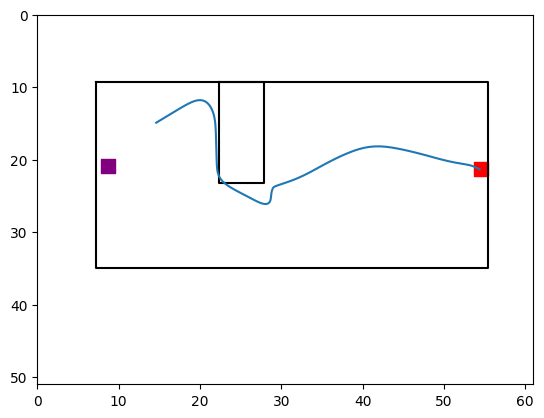

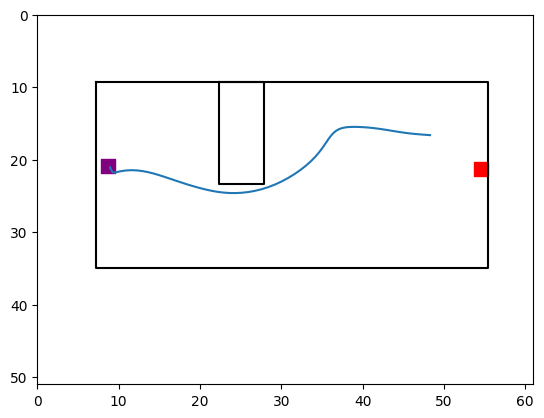

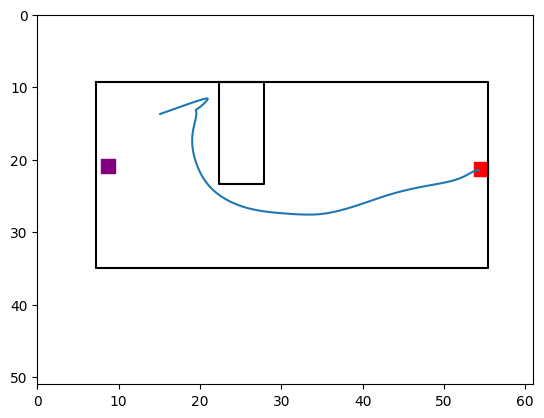

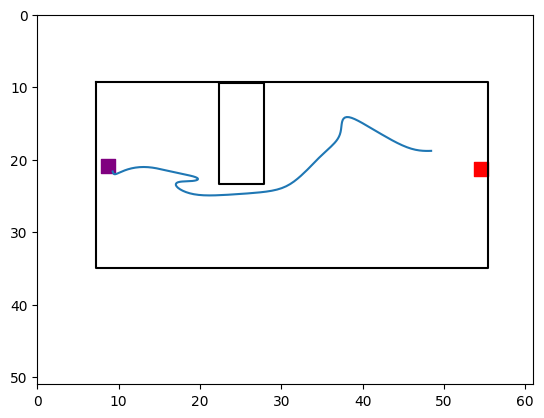

In [471]:
test_df = pd.concat([long_con_nostart,short_con_nostart]).loc[ast.literal_eval(pd.concat([long_con_nostart,short_con_nostart]).consective_inds.unique()[66])
]
for ind, row in test_df.iterrows():
    fig,ax = plt.subplots()
    plot_arena(test_df,ax)
    plot_obstacle_from_row(ax,row)
    ax.plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm))

In [349]:
pd.concat([long_con_nostart,short_con_nostart])

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,consective_inds,consective_type
3013,7204,51996.770688,52001.042969,"[51996.774412, 51996.792038, 51996.807859, 519...","[[16421, 16422, 16423, 16424, 16425, 16426, 16...","[691.1340942382812, 691.9711303710938, 692.290...","[272.3184509277344, 272.58721923828125, 272.62...","[677.164306640625, 679.0819702148438, 680.3773...","[267.57257080078125, 266.7694396972656, 266.04...","[682.9622192382812, 684.521484375, 685.1768188...",...,"[0.08698269226695743, 0.02773556027190338, 0.0...","[0.7389303934773643, 0.6365435909226562, 0.561...",92.921842,83.452507,-0.933311,up,torwards,True,"[3012, 3013, 3014, 3015, 3016, 3017]",1
3015,7206,52004.119424,52007.330969,"[52004.126988, 52004.143846, 52004.160512, 520...","[[16862, 16863, 16864, 16865, 16866, 16867, 16...","[691.9703979492188, 692.141357421875, 692.0581...","[273.4132995605469, 272.8192443847656, 272.415...","[676.9120483398438, 678.29296875, 679.00909423...","[268.1648254394531, 266.4772033691406, 266.131...","[683.688232421875, 684.5943603515625, 685.2813...",...,"[0.060176131633724594, 0.03828822800214837, 0....","[0.16199401192909946, 0.08904713590844793, 0.2...",74.097614,59.733877,-0.054860,down,away,True,"[3012, 3013, 3014, 3015, 3016, 3017]",3
3017,7208,52010.354009,52013.492057,"[52010.362406, 52010.379865, 52010.396326, 520...","[[17236, 17237, 17238, 17239, 17240, 17241, 17...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[686.3831176757812, 687.662353515625, 688.4680...","[259.5020446777344, 259.82958984375, 259.37011...","[680.0253295898438, 681.4765014648438, 682.823...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5690614892623085, 0.5388497968785408, 0.740...",89.138607,76.103441,-1.650283,up,torwards,True,"[3012, 3013, 3014, 3015, 3016, 3017]",5
3362,7553,54975.085056,54977.751884,"[54975.096614, 54975.113459, 54975.129996, 549...","[[6584, 6585, 6586, 6587, 6588, 6589, 6590, 65...","[692.3567504882812, 692.2962646484375, 692.520...","[272.50238037109375, 272.5284118652344, 272.45...","[678.6873779296875, 679.5926513671875, 680.531...","[266.2485046386719, 266.1864318847656, 265.873...","[684.0333251953125, 684.5537109375, 685.142028...",...,"[0.006890876822343017, 0.023458148928565237, 0...","[0.7276547166406182, 0.6707982985841863, 0.805...",84.964126,73.530732,-1.347415,up,torwards,True,"[3362, 3363, 3364]",0
3364,7555,54979.873856,54982.462796,"[54979.881459, 54979.898393, 54979.915788, 549...","[[6871, 6872, 6873, 6874, 6875, 6876, 6877, 68...","[690.9060668945312, 691.1382446289062, 691.611...","[271.0107727050781, 270.8990478515625, 271.453...","[680.927001953125, 681.3095703125, 682.2862548...","[262.8451232910156, 262.5636291503906, 263.138...","[683.3098754882812, 683.7190551757812, 683.634...",...,"[0.027390931538292307, 0.08181062860198551, 0....","[0.7004533753641091, 0.41514555315285406, 0.45...",73.942408,62.086776,-1.136390,up,torwards,True,"[3362, 3363, 3364]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11142,2261,44107.853760,44111.048857,"[44107.855872, 44107.871961, 44107.888691, 441...","[[23505, 23506, 23507, 23508, 23509, 23510, 23...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[636.0220336914062, 637.3818359375, 638.477111...","[259.07000732421875, 258.9283447265625, 259.96...","[635.5485229492188, 638.0135498046875, 639.890...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.6516736975354505, 0.3113641535370135, 0.532...",69.405131,63.202714,-0.360520,up,away,True,"[11142, 11143, 11144, 11145]",0
11144,2263,44113.170764,44116.513267,"[44113.174297, 44113.190374, 44113.207296, 441...","[[23824, 23825, 23826

In [444]:
con_switch_turn = con_df_prob_switch_turn_type(pd.concat([long_con_nostart,short_con_nostart]))

In [445]:
con_switch_turn

,date_index,trials,switch_sec_trial_type,switch_sec_trial,switch_third_trial_type,switch_third_trial,task,animal,obstacle_cluster,switch_type_all
0,0.0,6,up_up,0,up_up,0,oa,G8CK1LN,0,up_up_up
1,0.0,3,up_down,1,down_up,1,oa,G8CK1LN,1,up_down_up
2,0.0,3,up_down,1,down_up,1,oa,G8CK1LN,1,up_down_up
3,0.0,4,down_up,1,up_down,1,oa,G8CK1LN,1,down_up_down
4,0.0,3,down_up,1,up_down,1,oa,G8CK1LN,1,down_up_down
...,...,...,...,...,...,...,...,...,...,...
1904,5.0,3,down_up,1,up_down,1,oadark,J704RT,5,down_up_down
1905,5.0,6,down_down,0,down_down,0,oadark,J704RT,5,down_down_down
1906,5.0,8,down_up,1,up_up,0,oadark,J704RT,5,down_up_up
1907,5.0,4,up_down,1,down_down,0,oadark,J704RT,5,up_down_down


Text(0.5, 0, 'turn direction all')

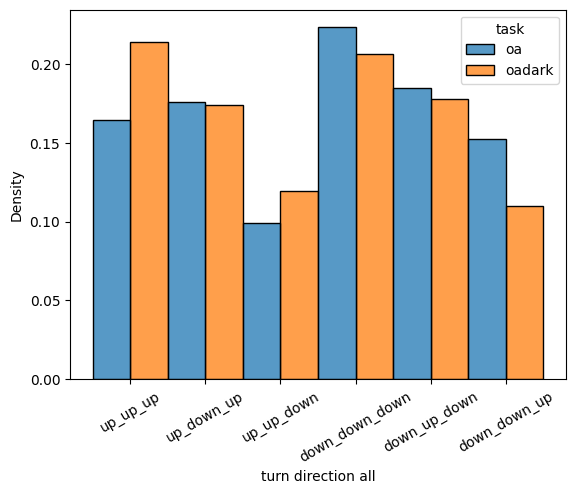

In [473]:
data = con_switch_turn

up_up_up = data[data.switch_type_all == 'up_up_up']
up_down_up = data[data.switch_type_all == 'up_down_up']
up_up_down = data[data.switch_type_all == 'up_up_down']
down_down_down = data[data.switch_type_all == 'down_down_down']
down_up_down = data[data.switch_type_all == 'down_up_down']
down_down_up = data[data.switch_type_all == 'down_down_up']

data = pd.concat([up_up_up,up_down_up,up_up_down,down_down_down,down_up_down,down_down_up])

sns.histplot(data=data,x='switch_type_all',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction all')

Text(0.5, 0, 'turn direction 1st - 2nd')

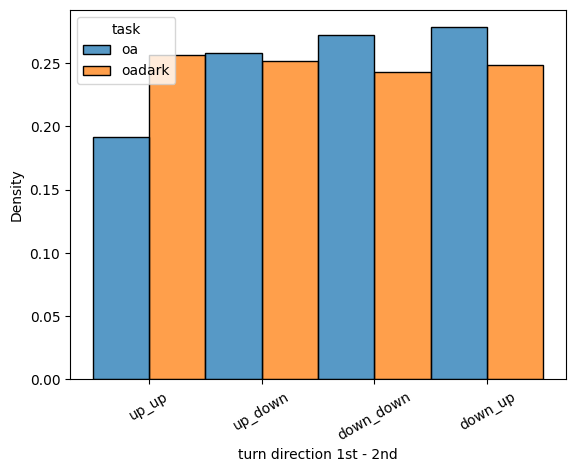

In [436]:
data = con_switch_turn

up_up = data[data.switch_sec_trial_type == 'up_up']
up_down = data[data.switch_sec_trial_type == 'up_down']
down_down = data[data.switch_sec_trial_type == 'down_down']
down_up = data[data.switch_sec_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])

sns.histplot(data=data,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction 1st - 2nd')

([0, 1, 2, 3],
 [Text(0, 0, 'up_up'),
  Text(1, 0, 'up_down'),
  Text(2, 0, 'down_down'),
  Text(3, 0, 'down_up')])

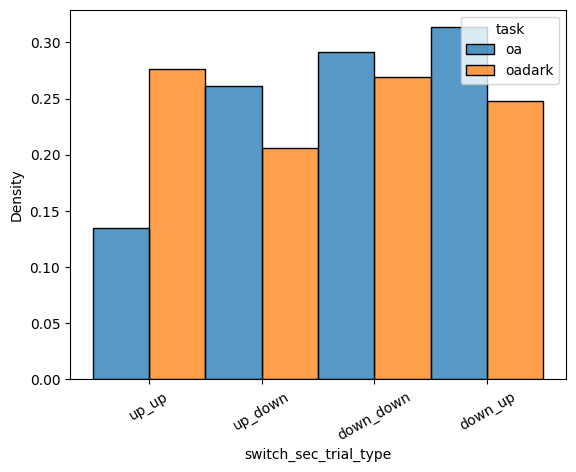

In [421]:
data = con_switch_turn

up_up = data[data.switch_sec_trial_type == 'up_up']
up_down = data[data.switch_sec_trial_type == 'up_down']
down_down = data[data.switch_sec_trial_type == 'down_down']
down_up = data[data.switch_sec_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])
data =data[data.date_index == 0]

sns.histplot(data=data,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

([0, 1, 2, 3],
 [Text(0, 0, 'up_up'),
  Text(1, 0, 'up_down'),
  Text(2, 0, 'down_down'),
  Text(3, 0, 'down_up')])

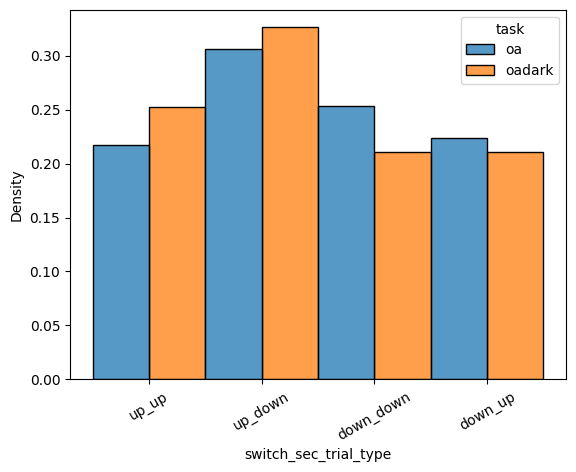

In [422]:
data = con_switch_turn

up_up = data[data.switch_sec_trial_type == 'up_up']
up_down = data[data.switch_sec_trial_type == 'up_down']
down_down = data[data.switch_sec_trial_type == 'down_down']
down_up = data[data.switch_sec_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])
data =data[data.date_index == 5]

sns.histplot(data=data,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

Text(0.5, 0, 'turn direction 2nd - 3rd')

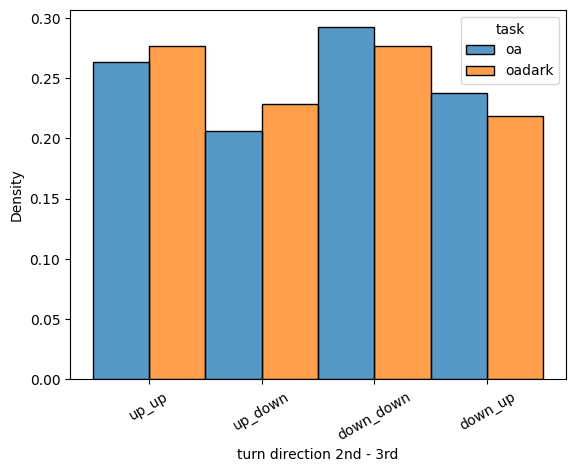

In [437]:
data = con_switch_turn

up_up = data[data.switch_third_trial_type == 'up_up']
up_down = data[data.switch_third_trial_type == 'up_down']
down_down = data[data.switch_third_trial_type == 'down_down']
down_up = data[data.switch_third_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction 2nd - 3rd')

([0, 1, 2, 3],
 [Text(0, 0, 'up_up'),
  Text(1, 0, 'up_down'),
  Text(2, 0, 'down_down'),
  Text(3, 0, 'down_up')])

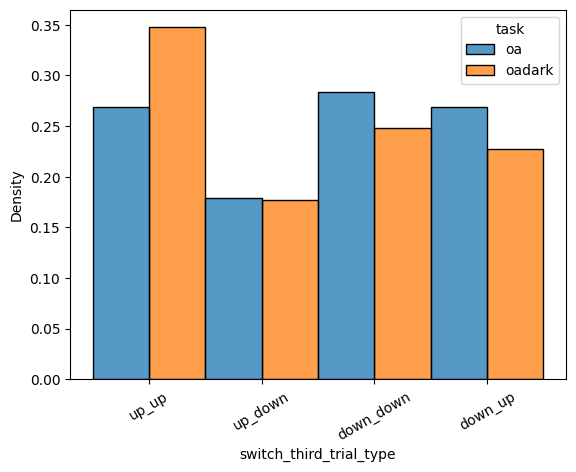

In [423]:
data = con_switch_turn

up_up = data[data.switch_third_trial_type == 'up_up']
up_down = data[data.switch_third_trial_type == 'up_down']
down_down = data[data.switch_third_trial_type == 'down_down']
down_up = data[data.switch_third_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])
data =data[data.date_index == 0]

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

([0, 1, 2, 3],
 [Text(0, 0, 'up_up'),
  Text(1, 0, 'up_down'),
  Text(2, 0, 'down_down'),
  Text(3, 0, 'down_up')])

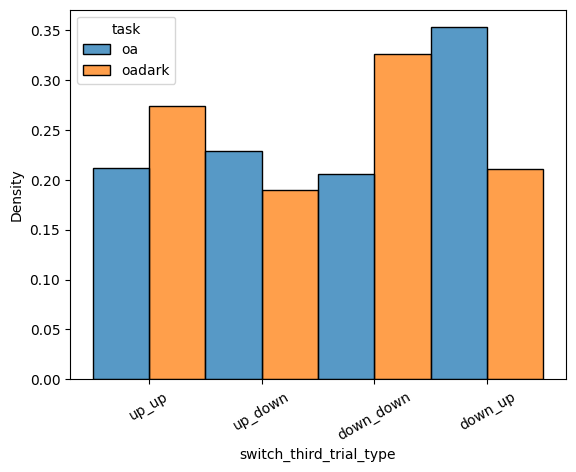

In [430]:
data = con_switch_turn

up_up = data[data.switch_third_trial_type == 'up_up']
up_down = data[data.switch_third_trial_type == 'up_down']
down_down = data[data.switch_third_trial_type == 'down_down']
down_up = data[data.switch_third_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])
data =data[data.date_index == 5]

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

<AxesSubplot: xlabel='switch_third_trial_type', ylabel='Density'>

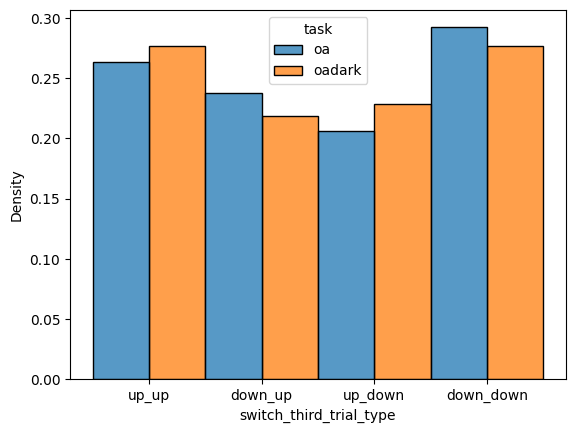

In [407]:
sns.histplot(data=con_switch_turn,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: ylabel='switch_sec_trial'>

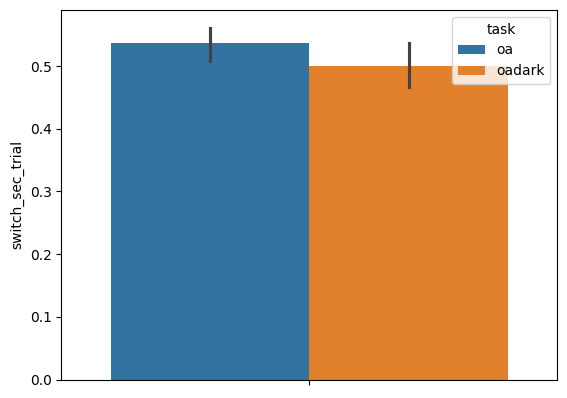

In [366]:
sns.barplot(data= con_switch_turn,y = 'switch_sec_trial',hue = 'task')

<AxesSubplot: ylabel='switch_third_trial'>

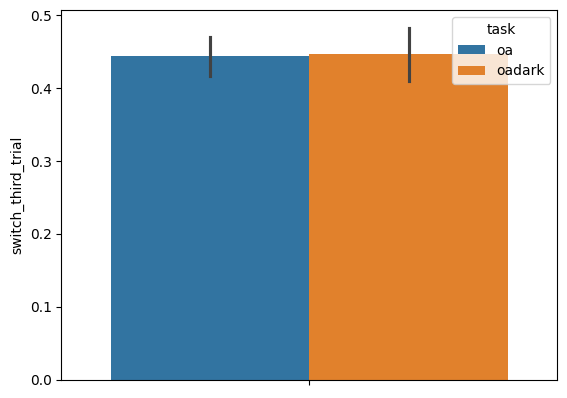

In [367]:
sns.barplot(data= con_switch_turn,y = 'switch_third_trial',hue = 'task')

In [477]:
long_short = pd.concat([long_con_nostart,short_con_nostart])
con_switch_turn_ob = con_df_prob_switch_turn_obstacle_type(long_short)

In [478]:
con_switch_turn_ob

,date_index,trials,switch_sec_trial_type,switch_sec_trial,switch_third_trial_type,switch_third_trial,task,animal,obstacle_cluster,switch_type_all,inital_turn,initial_linearity,trials_inds
0,0.0,6,torwards_torwards,0,torwards_torwards,0,oa,G8CK1LN,0,torwards_torwards_torwards,torwards,0.616566,"[3012, 3013, 3014, 3015, 3016, 3017]"
1,0.0,3,torwards_away,1,away_torwards,1,oa,G8CK1LN,1,torwards_away_torwards,torwards,0.545848,"[2957, 2958, 2959]"
2,0.0,3,torwards_away,1,away_torwards,1,oa,G8CK1LN,1,torwards_away_torwards,torwards,0.471582,"[2990, 2991, 2992]"
3,0.0,4,away_torwards,1,torwards_away,1,oa,G8CK1LN,1,away_torwards_away,away,0.941291,"[3005, 3006, 3007, 3008]"
4,0.0,3,away_torwards,1,torwards_away,1,oa,G8CK1LN,1,away_torwards_away,away,0.657261,"[3028, 3029, 3030]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1904,5.0,3,torwards_away,1,away_torwards,1,oadark,J704RT,5,torwards_away_torwards,torwards,0.752838,"[11072, 11073, 11074]"
1905,5.0,6,torwards_torwards,0,torwards_torwards,0,oadark,J704RT,5,torwards_torwards_torwards,torwards,0.786354,"[11092, 11093, 11094, 11095, 11096, 11097]"
1906,5.0,8,torwards_away,1,away_away,0,oadark,J704RT,5,torwards_away_away,torwards,0.753153,"[11117, 11118, 11119, 11120, 11121, 11122, 111..."
1907,5.0,4,away_torwards,1,torwards_torwards,0,oadark,J704RT,5,away_torwards_torwards,away,0.861609,"[11142, 11143, 11144, 11145]"


In [479]:
con_switch_turn_ob.sample(10).trials_inds.tolist()

[[4983, 4984, 4985, 4986],
 [2480, 2481, 2482],
 [8529, 8530, 8531],
 [6547, 6548, 6549],
 [11262, 11263, 11264, 11265],
 [4410, 4411, 4412],
 [4148, 4149, 4150, 4151, 4152, 4153, 4154, 4155],
 [7457, 7458, 7459],
 [2710, 2711, 2712],
 [12933, 12934, 12935, 12936, 12937, 12938, 12939]]

In [487]:
inds

[[8119, 8120, 8121],
 [6005, 6006, 6007, 6008],
 [12082, 12083, 12084, 12085, 12086, 12087, 12088, 12089, 12090, 12091, 12092],
 [6707, 6708, 6709],
 [14461, 14462, 14463],
 [9309, 9310, 9311, 9312],
 [4430, 4431, 4432, 4433],
 [6823, 6824, 6825],
 [9154, 9155, 9156],
 [12182, 12183, 12184, 12185, 12186, 12187, 12188, 12189, 12190]]

In [495]:
trials_df

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,consective_inds,consective_type
1693,1695,43315.144537,43319.273728,"[43315.146201, 43315.163596, 43315.179622, 433...","[[1967, 1968, 1969, 1970, 1971, 1972, 1973, 19...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[652.9459838867188, 654.4494018554688, 655.281...","[253.69801330566406, 252.9043731689453, 253.65...","[660.2113037109375, 661.6634521484375, 661.903...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.29014847363696283, 0.21371535993904978, 0.1...",74.473386,63.310730,0.306170,up,away,True,"[1693, 1694, 1695]",0
1694,1696,43319.273728,43322.563046,"[43319.280921, 43319.297651, 43319.314892, 433...","[2215, 2216, 2217, 2218, 2219, 2220, 2221, 222...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[98.5565185546875, 98.52289581298828, 98.66811...","[231.7665252685547, 231.77931213378906, 232.12...","[99.74248504638672, 99.30912780761719, 99.5009...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.24944370691081907, 0.3884420979064753, 0.38...",83.085300,72.241016,1.325473,down,torwards,False,"[1693, 1694, 1695]",1
1695,1697,43322.563046,43327.445952,"[43322.565312, 43322.582336, 43322.598732, 433...","[[2412, 2413, 2414, 2415, 2416, 2417, 2418, 24...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[658.431640625, 658.654296875, 658.96569824218...","[252.38131713867188, 252.7365264892578, 252.88...","[653.9014282226562, 656.2158813476562, 656.507...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7371528445264381, 0.8549281120465864, 0.521...",87.697436,81.184223,1.333296,down,torwards,True,"[1693, 1694, 1695]",2


In [ ]:
(row.ts_nose_x_cm,row.ts_spine_x_cm)

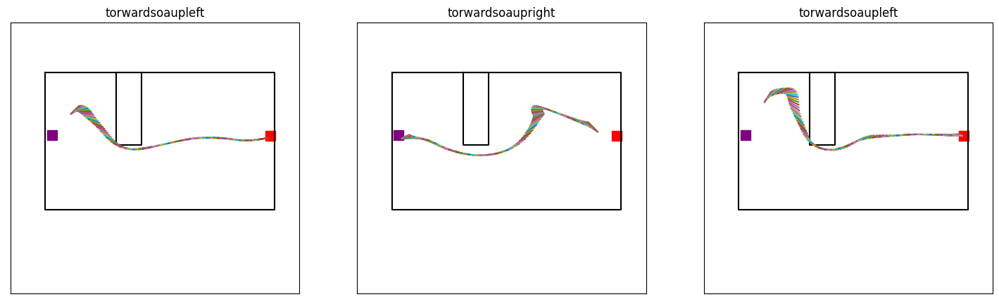

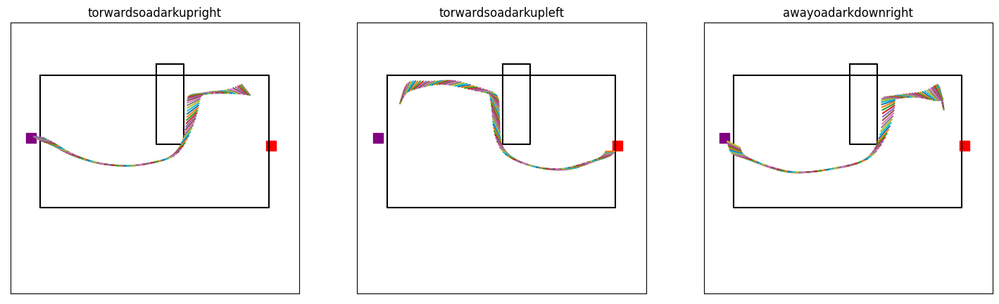

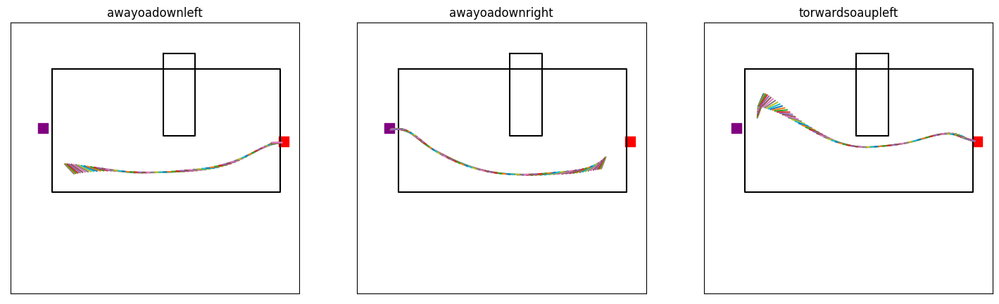

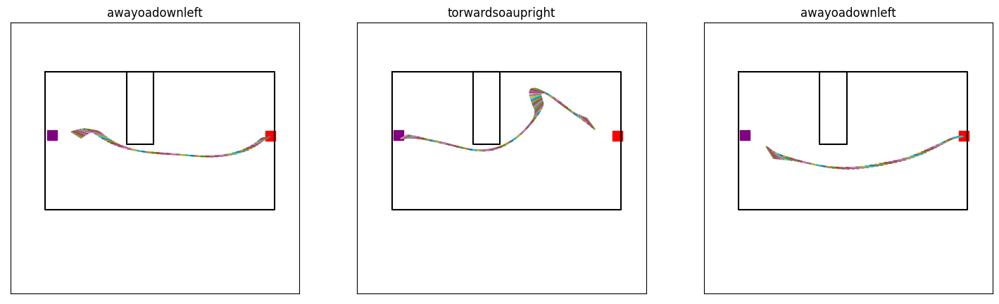

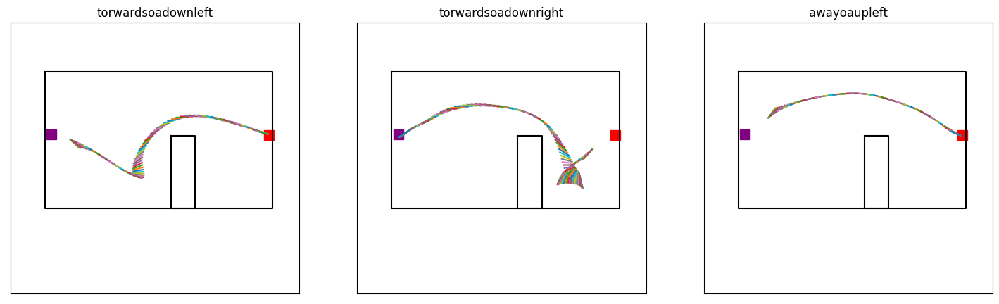

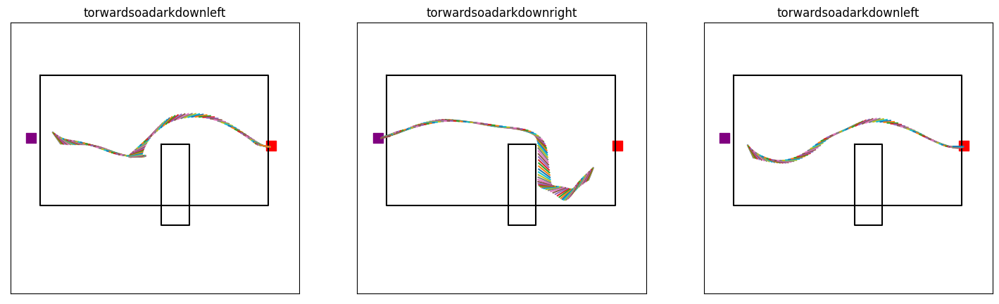

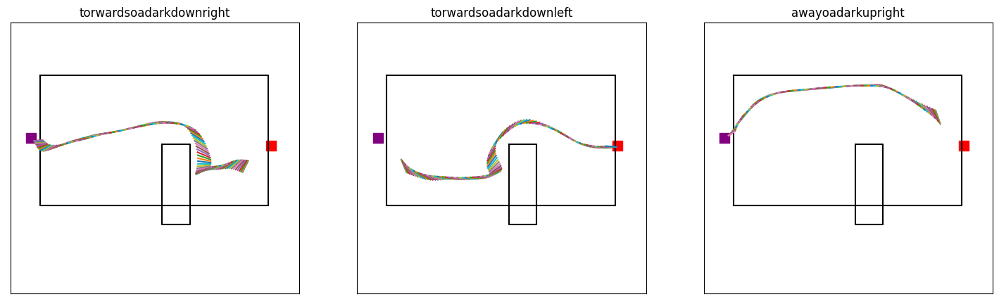

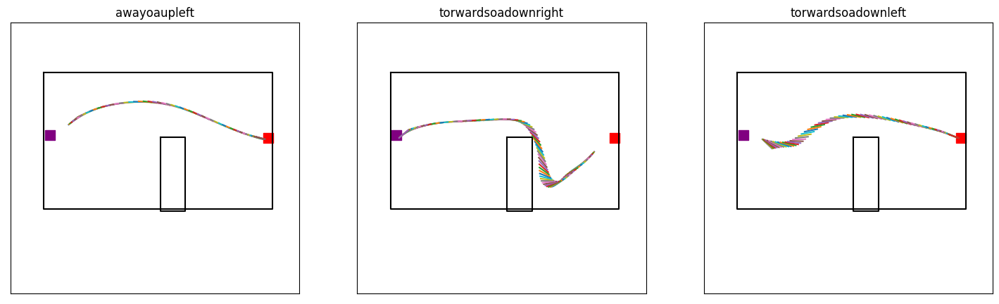

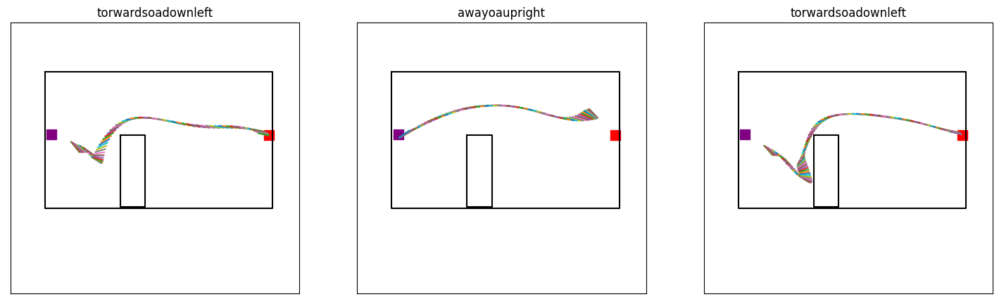

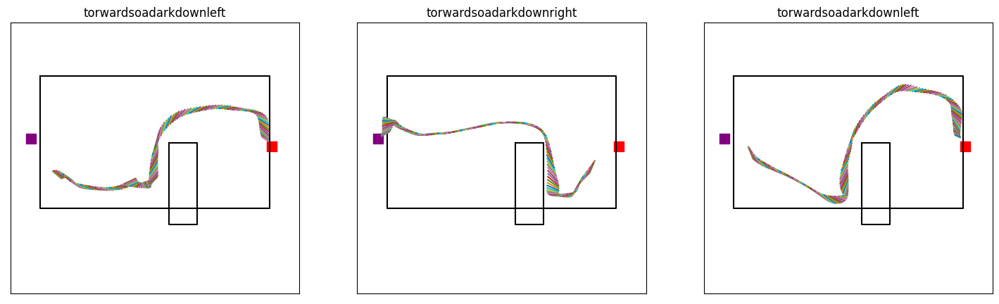

In [511]:
long_short = pd.concat([long_con_nostart,short_con_nostart])
inds = con_switch_turn_ob[con_switch_turn_ob.date_index == 5].sample(10).trials_inds.tolist()



for ind in inds:
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[2].set_xticks([])
    ax[2].set_yticks([])
    trials_df = long_short.loc[ind][:3]
    for i in range(3):
        plot_arena(trials_df,ax[i])
        plot_orginal_obstacle(trials_df,ax[i],0)
        ax[i].plot((smooth(trials_df.iloc[i].ts_nose_x_cm),smooth(trials_df.iloc[i].ts_spine_x_cm)),(smooth(trials_df.iloc[i].ts_nose_y_cm),smooth(trials_df.iloc[i].ts_spine_y_cm)))
        ax[i].set_title(trials_df.iloc[i].turn_to_obstacle + trials_df.iloc[i].task + trials_df.iloc[i].turn_direction+ trials_df.iloc[i].odd)

<AxesSubplot: xlabel='inital_turn', ylabel='Density'>

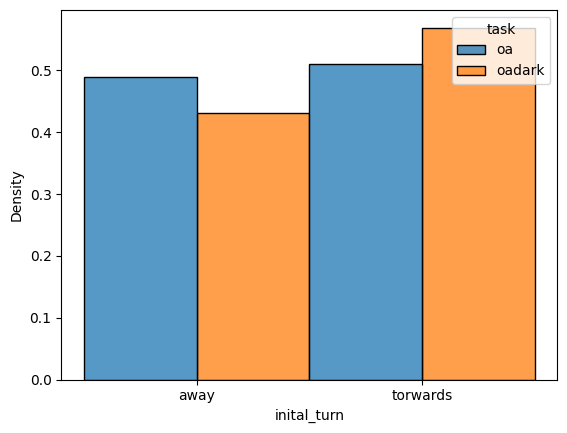

In [468]:
data = con_switch_turn_ob[con_switch_turn_ob.initial_linearity >= .7]
sns.histplot(data=data,x='inital_turn',stat='density',hue ='task',common_norm=False,multiple='dodge')

Text(0.5, 0, 'turn relative to obstacle all')

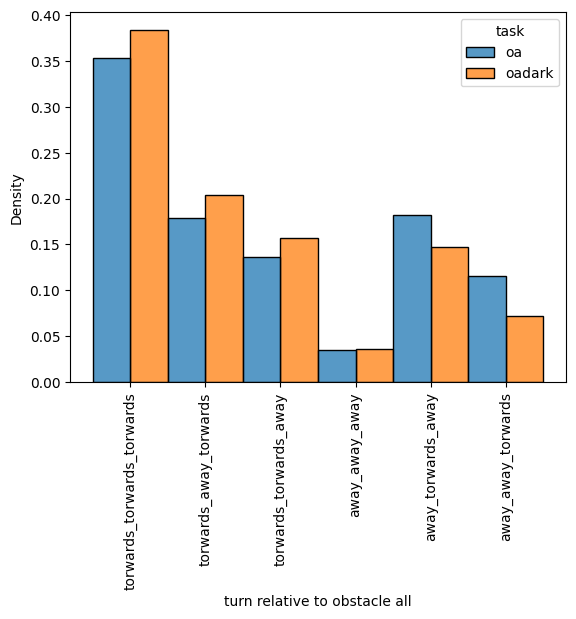

In [459]:
data = con_switch_turn_ob

towards_towards_towards = data[data.switch_type_all == 'torwards_torwards_torwards']
towards_away_towards = data[data.switch_type_all == 'torwards_away_torwards']
towards_towards_away = data[data.switch_type_all == 'torwards_torwards_away']
away_away_away = data[data.switch_type_all == 'away_away_away']
away_towards_away = data[data.switch_type_all == 'away_torwards_away']
away_away_towards = data[data.switch_type_all == 'away_away_torwards']


data = pd.concat([towards_towards_towards,towards_away_towards,towards_towards_away,away_away_away,away_towards_away,away_away_towards])

sns.histplot(data=data,x='switch_type_all',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=90)
plt.xlabel('turn relative to obstacle all')

Text(0.5, 0, 'turn relative to obstacle 1st - 2nd')

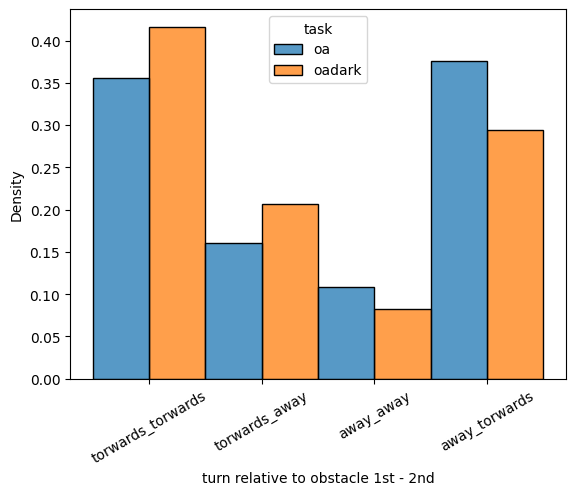

In [438]:
data = con_switch_turn_ob

towards_towards = data[data.switch_sec_trial_type == 'torwards_torwards']
towards_away = data[data.switch_sec_trial_type == 'torwards_away']
away_away = data[data.switch_sec_trial_type == 'away_away']
away_torwards = data[data.switch_sec_trial_type == 'away_torwards']

data = pd.concat([towards_towards,towards_away,away_away,away_torwards])

sns.histplot(data=data,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn relative to obstacle 1st - 2nd')

([0, 1, 2, 3],
 [Text(0, 0, 'torwards_torwards'),
  Text(1, 0, 'torwards_away'),
  Text(2, 0, 'away_away'),
  Text(3, 0, 'away_torwards')])

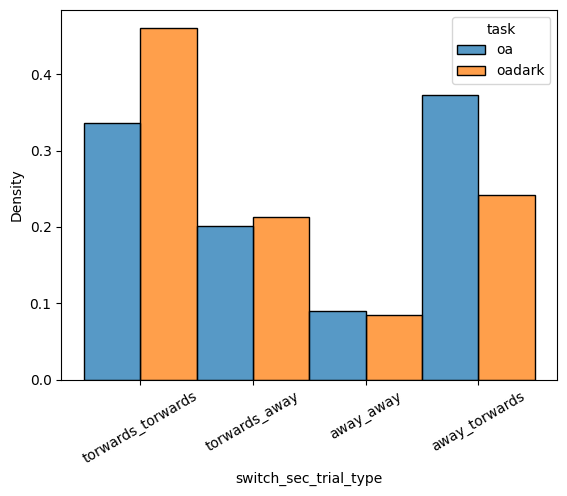

In [433]:
data = con_switch_turn_ob

towards_towards = data[data.switch_sec_trial_type == 'torwards_torwards']
towards_away = data[data.switch_sec_trial_type == 'torwards_away']
away_away = data[data.switch_sec_trial_type == 'away_away']
away_torwards = data[data.switch_sec_trial_type == 'away_torwards']

data = pd.concat([towards_towards,towards_away,away_away,away_torwards])
data = data[data.date_index == 0] 

sns.histplot(data=data,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

([0, 1, 2, 3],
 [Text(0, 0, 'torwards_torwards'),
  Text(1, 0, 'torwards_away'),
  Text(2, 0, 'away_away'),
  Text(3, 0, 'away_torwards')])

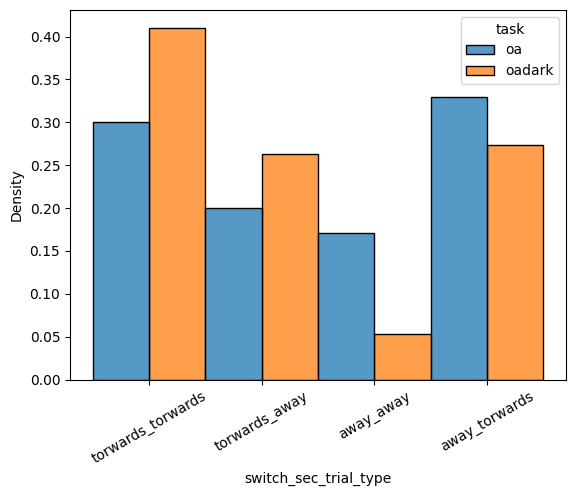

In [434]:
data = con_switch_turn_ob

towards_towards = data[data.switch_sec_trial_type == 'torwards_torwards']
towards_away = data[data.switch_sec_trial_type == 'torwards_away']
away_away = data[data.switch_sec_trial_type == 'away_away']
away_torwards = data[data.switch_sec_trial_type == 'away_torwards']

data = pd.concat([towards_towards,towards_away,away_away,away_torwards])
data = data[data.date_index == 5] 

sns.histplot(data=data,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

Text(0.5, 0, 'turn relative to obstacle 2nd - 3rd')

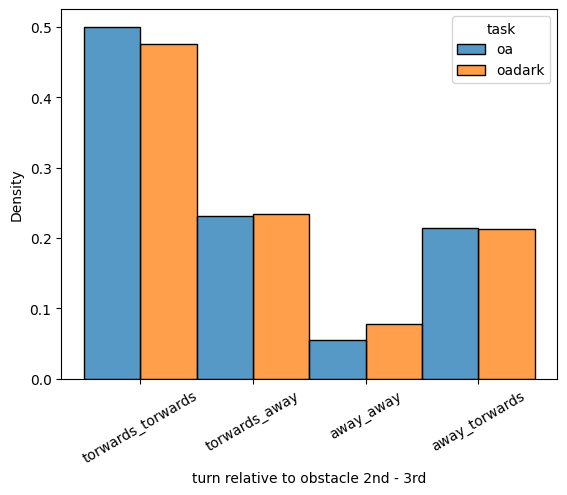

In [439]:
data = con_switch_turn_ob

towards_towards = data[data.switch_third_trial_type == 'torwards_torwards']
towards_away = data[data.switch_third_trial_type == 'torwards_away']
away_away = data[data.switch_third_trial_type == 'away_away']
away_torwards = data[data.switch_third_trial_type == 'away_torwards']

data = pd.concat([towards_towards,towards_away,away_away,away_torwards])

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn relative to obstacle 2nd - 3rd')

([0, 1, 2, 3],
 [Text(0, 0, 'torwards_torwards'),
  Text(1, 0, 'torwards_away'),
  Text(2, 0, 'away_away'),
  Text(3, 0, 'away_torwards')])

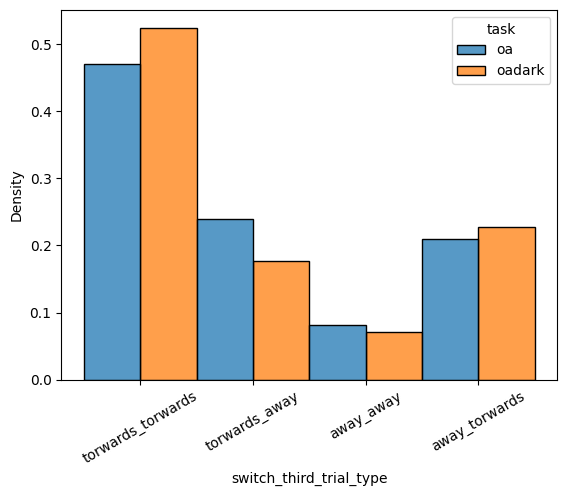

In [419]:
data = con_switch_turn_ob

towards_towards = data[data.switch_third_trial_type == 'torwards_torwards']
towards_away = data[data.switch_third_trial_type == 'torwards_away']
away_away = data[data.switch_third_trial_type == 'away_away']
away_torwards = data[data.switch_third_trial_type == 'away_torwards']

data = pd.concat([towards_towards,towards_away,away_away,away_torwards])
data = data[data.date_index == 0] 

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

([0, 1, 2, 3],
 [Text(0, 0, 'torwards_torwards'),
  Text(1, 0, 'torwards_away'),
  Text(2, 0, 'away_away'),
  Text(3, 0, 'away_torwards')])

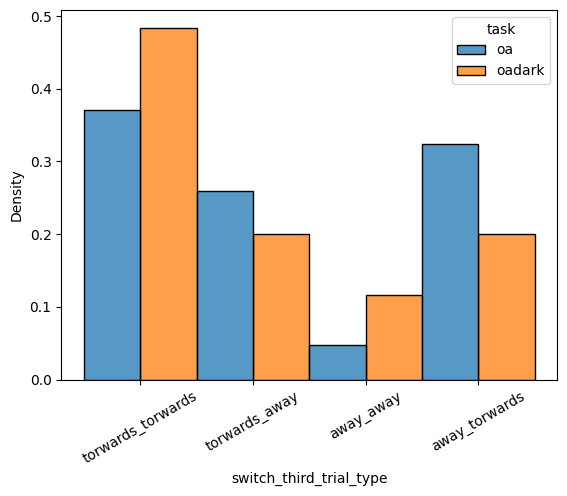

In [420]:
data = con_switch_turn_ob

towards_towards = data[data.switch_third_trial_type == 'torwards_torwards']
towards_away = data[data.switch_third_trial_type == 'torwards_away']
away_away = data[data.switch_third_trial_type == 'away_away']
away_torwards = data[data.switch_third_trial_type == 'away_torwards']

data = pd.concat([towards_towards,towards_away,away_away,away_torwards])
data = data[data.date_index == 5] 

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

<AxesSubplot: xlabel='switch_sec_trial_type', ylabel='Density'>

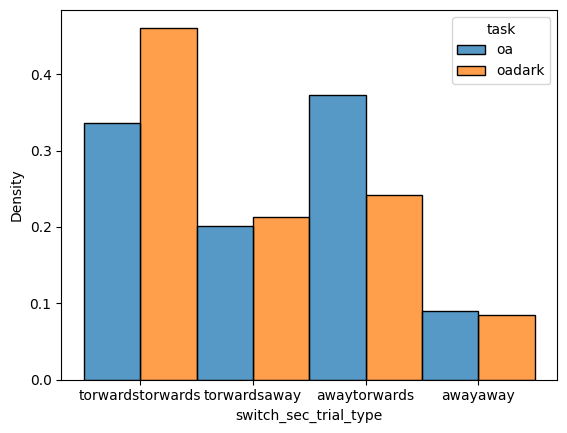

In [398]:
sns.histplot(data=con_switch_turn_ob[con_switch_turn_ob.date_index == 0],x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='switch_sec_trial_type', ylabel='Density'>

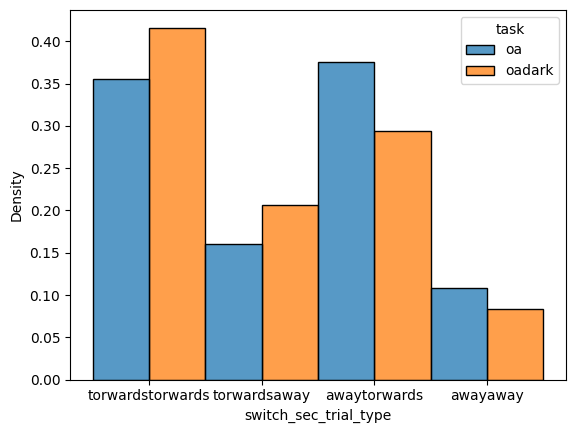

In [379]:
sns.histplot(data=con_switch_turn_ob,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: ylabel='switch_sec_trial'>

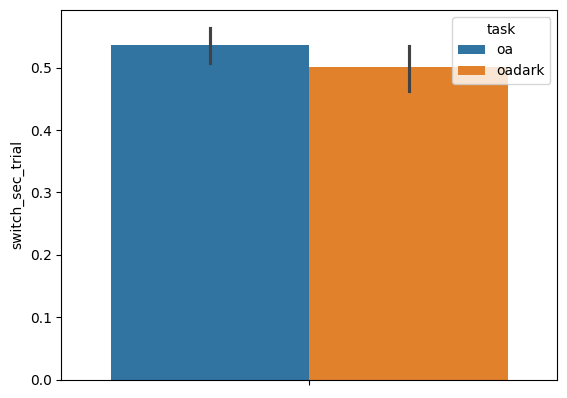

In [381]:
sns.barplot(data= con_switch_turn_ob,y = 'switch_sec_trial',hue = 'task')

<AxesSubplot: xlabel='switch_third_trial_type', ylabel='Density'>

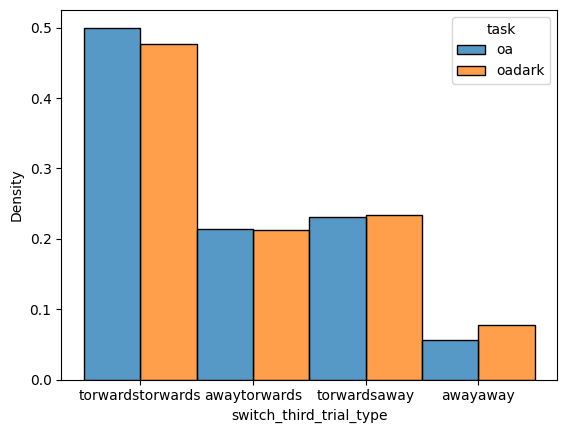

In [380]:
sns.histplot(data=con_switch_turn_ob,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='switch_third_trial_type', ylabel='Density'>

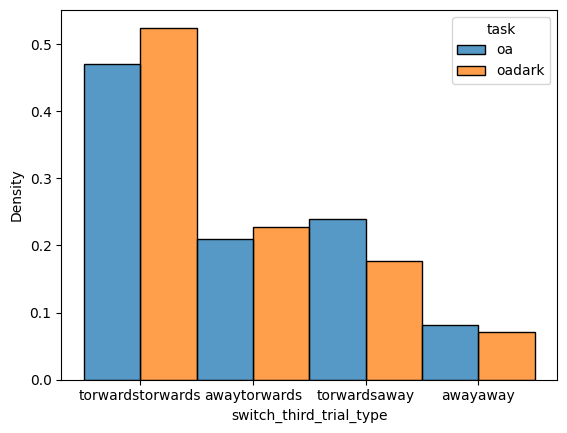

In [401]:

sns.histplot(data=con_switch_turn_ob[con_switch_turn_ob.date_index == 0],x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='switch_third_trial_type', ylabel='Density'>

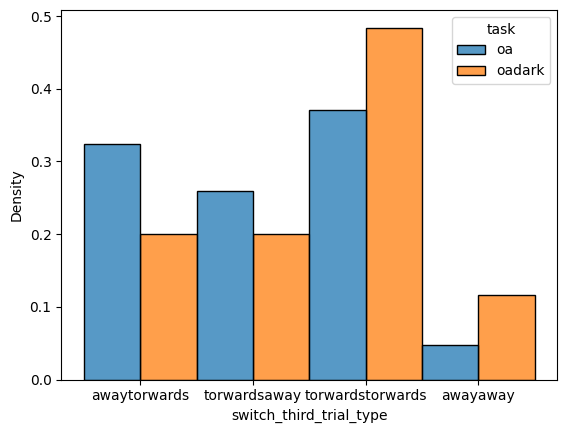

In [400]:

sns.histplot(data=con_switch_turn_ob[con_switch_turn_ob.date_index == 5],x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: ylabel='switch_third_trial'>

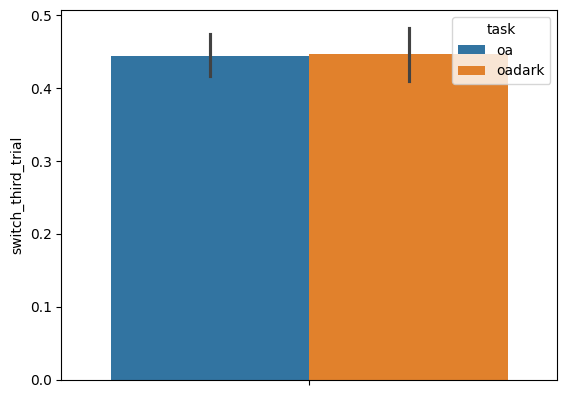

In [383]:
sns.barplot(data= con_switch_turn_ob,y = 'switch_third_trial',hue = 'task')

In [134]:
def con_df_prob_switch(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -2) &(date_df.distance_at_head_turn >= 0)]
                ind = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind.tolist()]
                switch = []
                for ind,row in enumerate(first_trial.start.tolist()):
                    if row == third_trial.start.tolist()[ind]:
                        switch.append(0)
                    else:
                        switch.append(1)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch'].append(sum(switch)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)



    
    

In [5]:
def lateral_error(df):
    lateral_error_open_corner(df)
    ts_lateral_error_to_target_port(df)

In [198]:
lateral_error(joint_con_df)

In [32]:
def intial_lateral_error(df):
    for ind,row in df.iterrows():
        if type(row.lateral_error)==float:
            df.at[ind,'intial_lateral_error'] = np.nan
        else:
            df.at[ind,'intial_lateral_error'] = row.lateral_error[0]
         
def avg_lateral_error(df):
    for ind,row in df.iterrows():
        if type(row.lateral_error)==float:
            df.at[ind,'avg_lateral_error'] = np.nan
        else:
            df.at[ind,'avg_lateral_error'] = np.nanmean(row.lateral_error[:int(row.obstacle_ind)])
        
        

In [200]:
intial_lateral_error(joint_con_df)
avg_lateral_error(joint_con_df)

In [7]:
intial_lateral_error(joint)
avg_lateral_error(joint)

In [244]:
def con_df_prob_in_way(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','inway','task','animal','consective_type']}
    #long_con, short_con,middle_con = create_df_by_type_nostart(df)
    #long_short = pd.concat([long_con,short_con])
    data = df 
    data = drop_nans_in_columns(df,'avg_lateral_error')
    for ani,animal_df in data.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                for con,con_df in date_df.groupby(['consective_type']):
                    in_way_list =[]
                    for lateral_error in con_df.avg_lateral_error.tolist():
                        if lateral_error <0:
                            in_way_list.append(1)
                        
                        elif(lateral_error > 0):
                            in_way_list.append(0)                
                    dictlists['date_index'].append(date)
                    dictlists['trials'].append(len(con_df))
                    dictlists['inway'].append(sum(in_way_list)/len(in_way_list))
                    dictlists['task'].append(task)
                    dictlists['animal'].append(ani)
                    dictlists['consective_type'].append(con)
    return pd.DataFrame.from_dict(dictlists)

In [256]:
con_df_prob_in_way= con_df_prob_in_way(joint_con_df)

<AxesSubplot: >

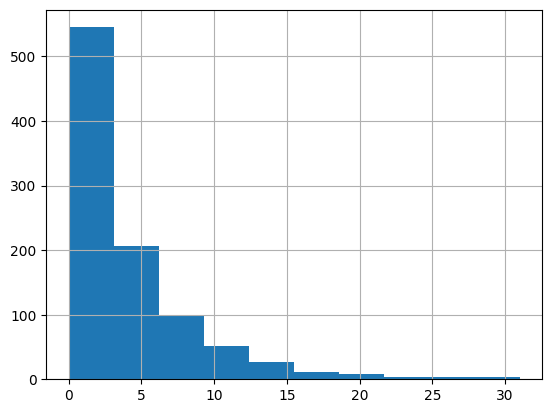

In [257]:
con_df_prob_in_way.consective_type.hist()

In [515]:
def intial_angle_to_corner(df):
    for ind,row in df.iterrows():
        df.at[ind,'intial_angle_to_corner'] = row.ts_zero_out_angle_to_corner[0]

<AxesSubplot: xlabel='consective_type', ylabel='inway'>

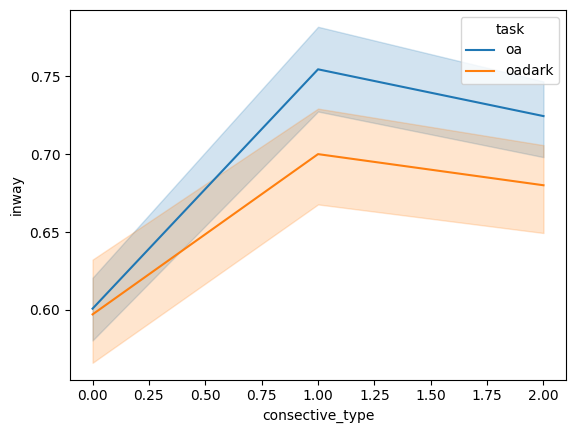

In [215]:
sns.lineplot(data= con_df_prob_in_way[con_df_prob_in_way.consective_type<=2],x = 'consective_type',y ='inway',hue = 'task' )



<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

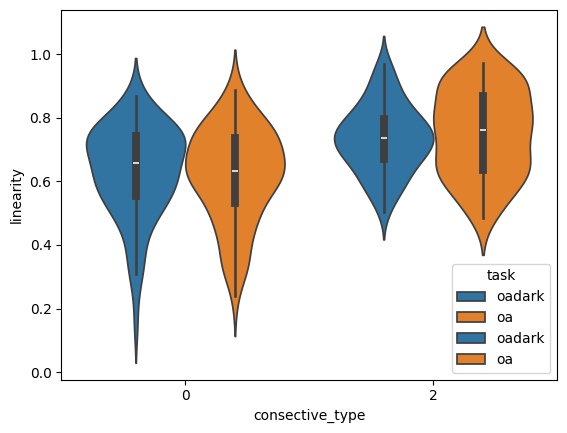

In [672]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.consective_type == 0)&(long_short.date_index == 0)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'linearity',hue = 'task')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'linearity',hue = 'task')

<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

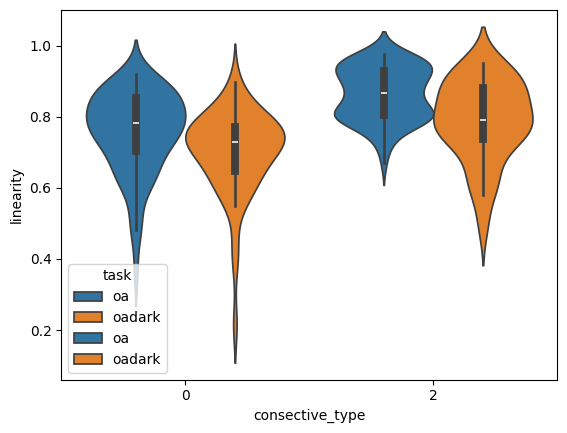

In [675]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'linearity',hue = 'task')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'linearity',hue = 'task')

<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

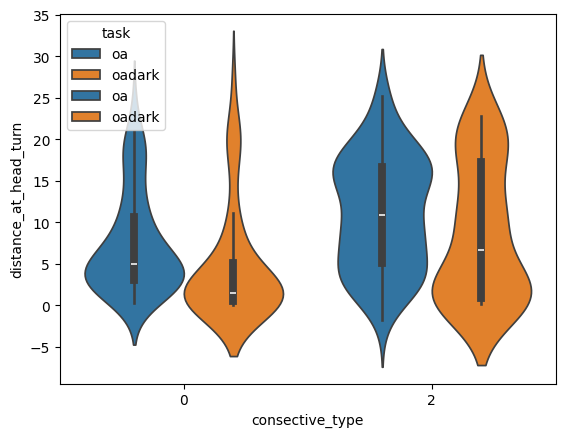

In [680]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'distance_at_head_turn',hue = 'task')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'distance_at_head_turn',hue = 'task')

<AxesSubplot: xlabel='consective_type', ylabel='avg_lateral_error'>

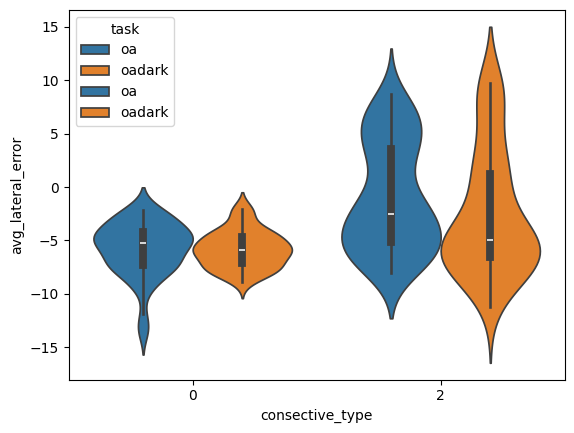

In [677]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'avg_lateral_error',hue = 'task')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'avg_lateral_error',hue = 'task')

<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

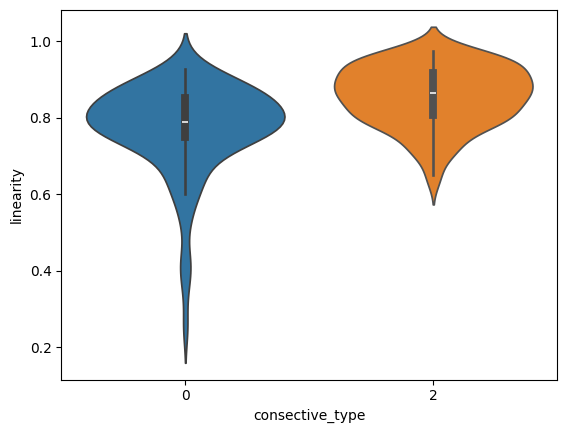

In [670]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oa')&(long_short.consective_type == 0)&(long_short.date_index == 6)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'linearity')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'linearity')
#plt.gca().invert_yaxis()

<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

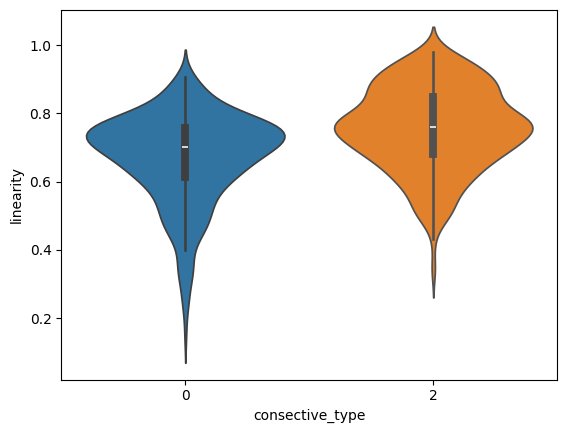

In [669]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0) &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'linearity')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'linearity')
#plt.gca().invert_yaxis()

<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

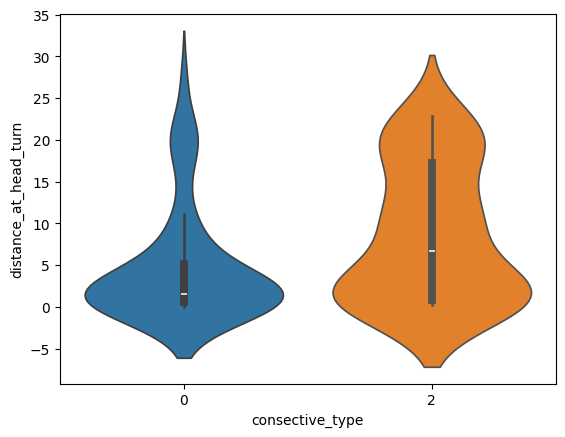

In [383]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'distance_at_head_turn')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'distance_at_head_turn')
#plt.gca().invert_yaxis()

<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

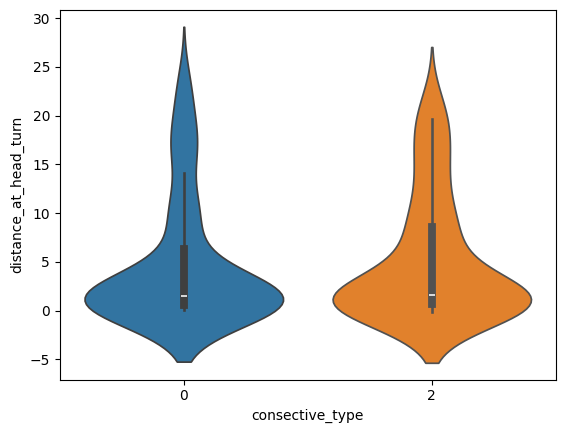

In [384]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0)&(long_short.date_index == 0)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'distance_at_head_turn')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'distance_at_head_turn')

<AxesSubplot: xlabel='consective_type', ylabel='avg_lateral_error'>

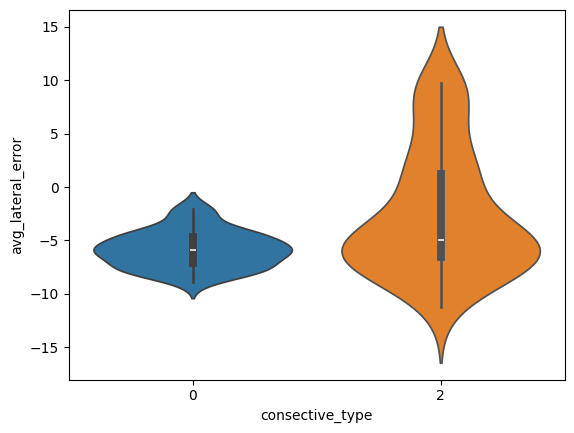

In [385]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'avg_lateral_error')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'avg_lateral_error')

<AxesSubplot: xlabel='consective_type', ylabel='avg_lateral_error'>

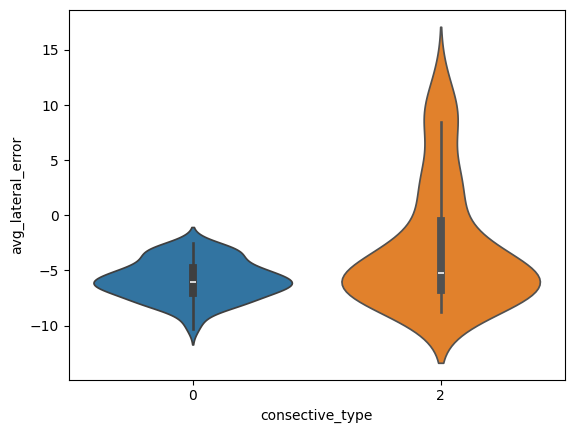

In [386]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0)&(long_short.date_index == 0)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'avg_lateral_error')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'avg_lateral_error')

In [401]:
def get_head_angle(df):
        for ind, row in df.iterrows():
            leftear_x = row['ts_leftear_x_cm']
            leftear_y = row['ts_leftear_y_cm']
            rightear_x = row['ts_rightear_x_cm']
            rightear_y = row['ts_rightear_y_cm']
            nose_x = row['ts_nose_x_cm']
            nose_y = row['ts_nose_y_cm']
            angs = []
            if row.odd == 'left':
                for step in range(len(leftear_x)):
                    ang = np.arctan2(np.mean([leftear_y[step],rightear_y[step]])-nose_y[step],(np.mean([leftear_x[step],rightear_x[step]])-nose_x[step])*-1)
                    angs.append(ang)
            else:
                for step in range(len(leftear_x)):
                    ang = np.arctan2(np.mean([leftear_y[step],rightear_y[step]])-nose_y[step],(np.mean([leftear_x[step],rightear_x[step]])-nose_x[step]))
                    angs.append(ang)

            df.at[ind, 'head_angle'] = gaussian_filter(np.array(np.degrees(angs)),3,mode = 'reflect').astype(object)
def angular_velocity_head(df):
    for ind,row in df.iterrows():
        #filtered_head_angle = gaussian_filter(row.head_angle.astype(float),2)
        head_angle_velocity = calculate_angular_velocity(row.head_angle.astype(float),60).astype(object)
        df.at[ind,'head_angle_velocity'] = head_angle_velocity
        df.at[ind,'intial_head_angle_velocity'] = head_angle_velocity.astype(float)[np.isfinite(head_angle_velocity.astype(float))][0]

def calculate_angular_velocity(angles, frame_rate):
    # Convert angles to radians if they are given in degrees
    angles = np.radians(angles)

    # Calculate angular velocity using NumPy's array operations
    angular_displacements = np.diff(angles)
    angular_velocities = angular_displacements / (1 / frame_rate)
    np.angle(angular_velocities.astype(float))
    return angular_velocities

In [402]:
def turn_direction(df):
    for ind,row in df.iterrows():
        if np.nanmean(row.head_angle_velocity[:5]) < 0:
            df.at[ind,'turn_direction'] = 'up'
        elif np.nanmean(row.head_angle_velocity[:5])> 0:
            df.at[ind,'turn_direction'] = 'down'

def turn_to_obstacle(df):
    for ind,row in df.iterrows():
        if (row.obstacle_cluster ==  2) or  (row.obstacle_cluster ==  3):
            df.at[ind,'turn_to_obstacle'] = 'middle'
        elif (row.obstacle_cluster ==  0) or  (row.obstacle_cluster ==  1):
            if row.turn_direction == 'up':
                df.at[ind,'turn_to_obstacle'] = 'torwards'
            else:
                df.at[ind,'turn_to_obstacle'] = 'away'
        elif (row.obstacle_cluster ==  4) or  (row.obstacle_cluster ==  5):
            if row.turn_direction == 'up':
                df.at[ind,'turn_to_obstacle'] = 'away'
            else:
                df.at[ind,'turn_to_obstacle'] = 'torwards'




In [403]:
intial_lateral_error(joint)
avg_lateral_error(joint)
get_head_angle(joint)
angular_velocity_head(joint)
turn_direction(joint)
turn_to_obstacle(joint)

In [149]:
redo_ts_trace(joint)

corner
port


In [167]:
joint[joint.task == 'oa'].to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_91024.h5",'w')
joint[joint.task == 'oadark'].to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\dark_91024.h5",'w')

In [404]:
joint[joint.task == 'oa'].to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_91024_1.h5",'w')
joint[joint.task == 'oadark'].to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\dark_91024_1.h5",'w')

In [405]:
con_df = create_consective_df_new(joint)

In [406]:
long_con_nostart,short_con_nostart,middle_con_nostart = create_df_by_type_nostart(con_df)

In [407]:
long_nostart,short_nostart,middle_nostart = create_df_by_type_nostart(joint)

<AxesSubplot: xlabel='turn_direction', ylabel='Density'>

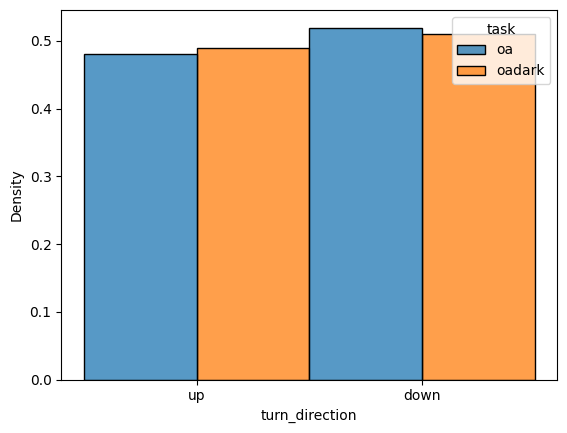

In [408]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_direction',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

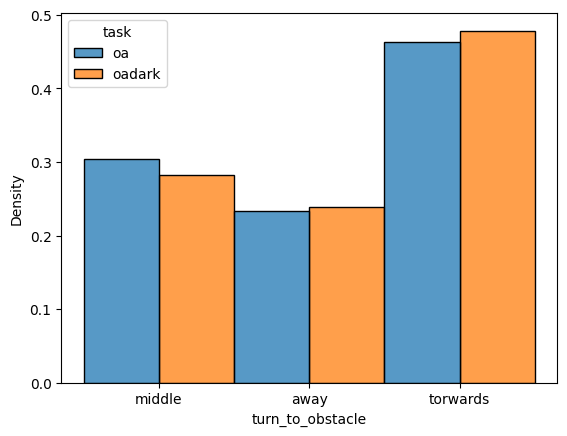

In [409]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

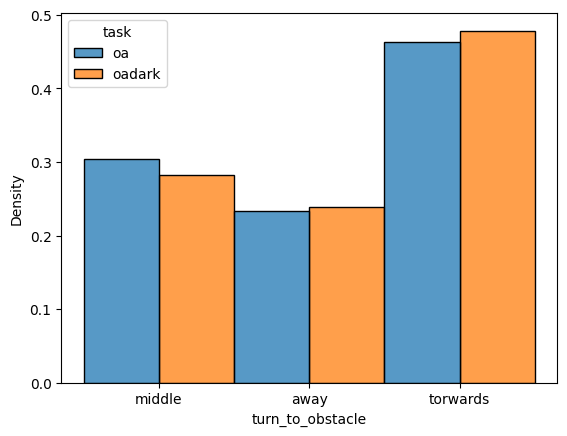

In [1233]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

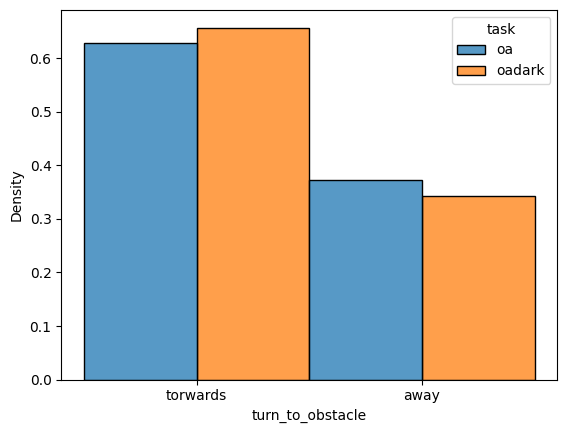

In [410]:
data = pd.concat([long_nostart])
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

In [873]:
def con_df_prob_in_way(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','inway','task','animal','consective_type']}
    #long_con, short_con,middle_con = create_df_by_type_nostart(df)
    #long_short = pd.concat([long_con,short_con])
    data = df 
    data = drop_nans_in_columns(df,'avg_lateral_error')
    for ani,animal_df in data.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                for con,con_df in date_df.groupby(['consective_type']):
                    in_way_list =[]
                    for turn_to_obstacle in con_df.turn_to_obstacle.tolist():
                        if turn_to_obstacle =='torwards':
                            in_way_list.append(1)
                        
                        elif turn_to_obstacle =='away':
                            in_way_list.append(0)                
                    dictlists['date_index'].append(date)
                    dictlists['trials'].append(len(con_df))
                    dictlists['inway'].append(sum(in_way_list)/len(in_way_list))
                    dictlists['task'].append(task)
                    dictlists['animal'].append(ani)
                    dictlists['consective_type'].append(con)
    return pd.DataFrame.from_dict(dictlists)

In [992]:
def con_df_prob_switch(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -3) &(date_df.distance_at_head_turn >= 0)]
                ind = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind.tolist()]
                switch = []
                for ind,row in enumerate(first_trial.turn_to_obstacle.tolist()):
                    if row == third_trial.turn_to_obstacle.tolist()[ind]:
                        switch.append(0)
                    else:
                        switch.append(1)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch'].append(sum(switch)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

<AxesSubplot: xlabel='turn_direction', ylabel='Density'>

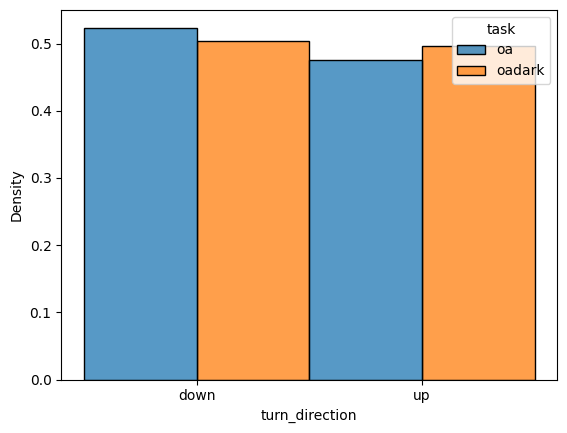

In [7]:
data = con_df
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_direction',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_direction', ylabel='Density'>

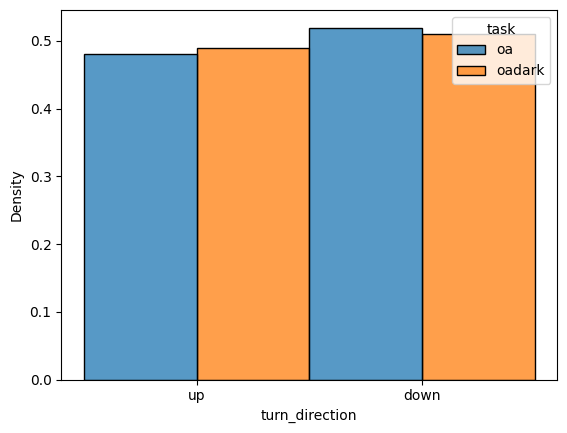

In [414]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_direction',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

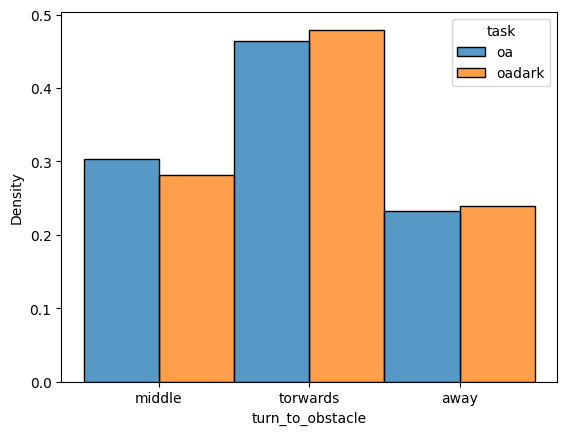

In [8]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_direction', ylabel='Density'>

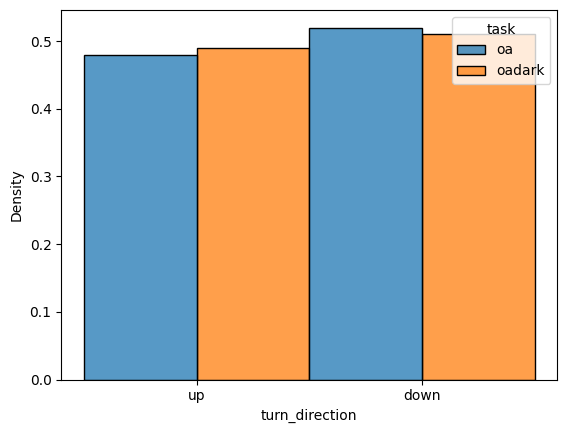

In [9]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_direction',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

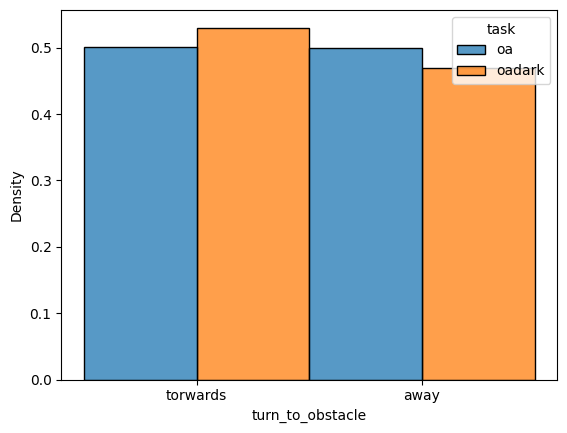

In [9]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==0) & (data.obstacle_cross ==True)& (data.linearity >.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

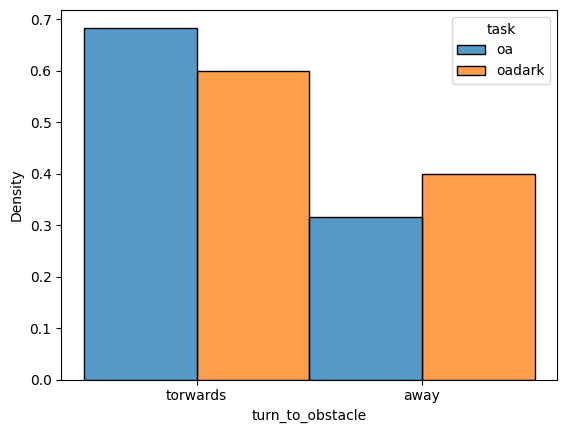

In [10]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) & (data.obstacle_cross ==True)& (data.linearity >.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

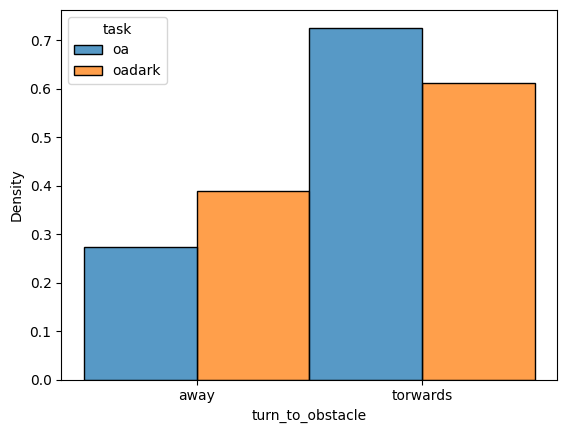

In [11]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==3) & (data.obstacle_cross ==True)& (data.linearity >.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

In [ ]:
sns.barplot(data = data,)

(0.0, 0.8)

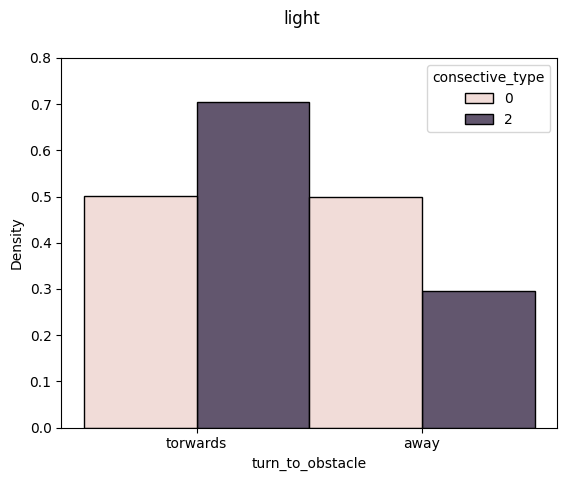

In [90]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light')
plt.ylim(0,.8)

In [18]:
sum(data.turn_to_obstacle == 'torwards')/len(data)

0.6511437908496732

In [40]:
np.array([first_porp,sec_porp,third_porp])

array([0.48148148, 0.67741935, 0.41935484])

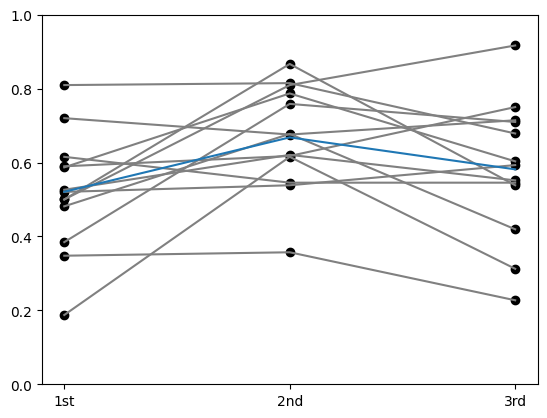

In [44]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0))


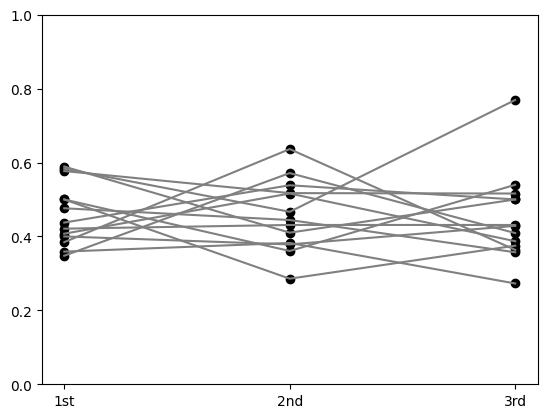

In [46]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')


In [ ]:
create_color_dict()

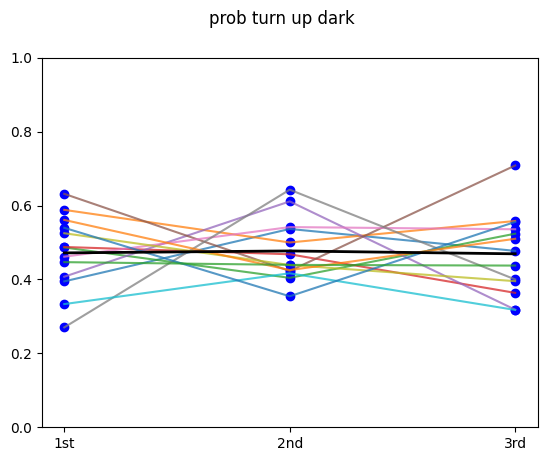

In [139]:
data = pd.concat([con_df])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob turn up dark')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'blue')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'blue')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'blue')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

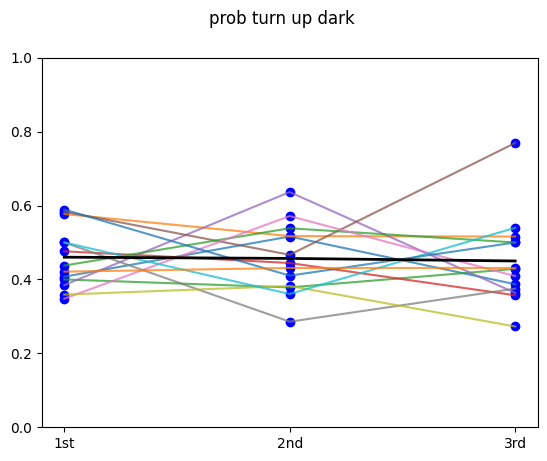

In [138]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob turn up dark')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'blue')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'blue')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'blue')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

G8CK1LN 123
G8CK1LN 123 [0.39473684210526316, 0.5121951219512195, 0.29545454545454547]
G8CK1LT 119
G8CK1LT 119 [0.3235294117647059, 0.5476190476190477, 0.5116279069767442]
G8CK1RT 126
G8CK1RT 126 [0.4864864864864865, 0.574468085106383, 0.5476190476190477]
G8CK1TT 132
G8CK1TT 132 [0.4146341463414634, 0.5106382978723404, 0.4318181818181818]
G8CKLN 85
G8CKLN 85 [0.2962962962962963, 0.3611111111111111, 0.3181818181818182]
G8CKLT 69
G8CKLT 69 [0.3157894736842105, 0.5, 0.2916666666666667]
G8CKRN 78
G8CKRN 78 [0.15384615384615385, 0.3333333333333333, 0.17857142857142858]
G8CKRT 100
G8CKRT 100 [0.21621621621621623, 0.17857142857142858, 0.14285714285714285]
G8CKTT 124
G8CKTT 124 [0.275, 0.43902439024390244, 0.5813953488372093]
J704LN 165
J704LN 165 [0.4444444444444444, 0.5, 0.5714285714285714]
J704LT 223
J704LT 223 [0.4444444444444444, 0.6075949367088608, 0.4691358024691358]
J704NN 269
J704NN 269 [0.47560975609756095, 0.4942528735632184, 0.53]
J704RT 177
J704RT 177 [0.425531914893617, 0.5454545

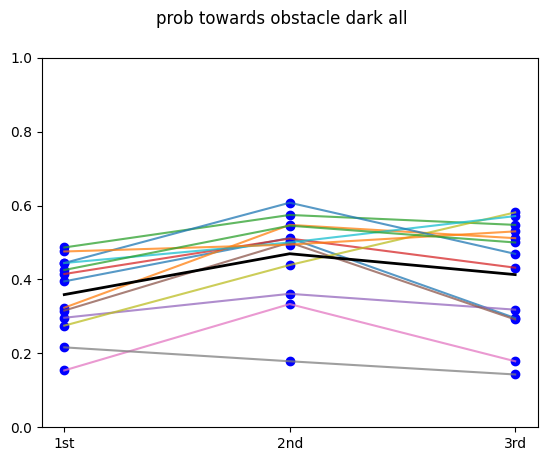

In [141]:
data = pd.concat([con_df])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob towards obstacle dark all')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    print(ani,len(ani_df))
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'blue')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'blue')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'blue')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    print(ani,len(ani_df),[first_porp,sec_porp,third_porp])
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

G8CK1LN 89
G8CK1LN 89 [0.48148148148148145, 0.6774193548387096, 0.41935483870967744]
G8CK1LT 86
G8CK1LT 86 [0.38461538461538464, 0.7586206896551724, 0.7096774193548387]
G8CK1RT 90
G8CK1RT 90 [0.72, 0.6756756756756757, 0.7142857142857143]
G8CK1TT 76
G8CK1TT 76 [0.8095238095238095, 0.8148148148148148, 0.6785714285714286]
G8CKLN 46
G8CKLN 46 [0.6153846153846154, 0.5454545454545454, 0.5454545454545454]
G8CKLT 40
G8CKLT 40 [0.5, 0.8666666666666667, 0.5384615384615384]
G8CKRN 45
G8CKRN 45 [0.1875, 0.6153846153846154, 0.3125]
G8CKRT 59
G8CKRT 59 [0.34782608695652173, 0.35714285714285715, 0.22727272727272727]
G8CKTT 67
G8CKTT 67 [0.5, 0.8095238095238095, 0.9166666666666666]
J704LN 117
J704LN 117 [0.5897435897435898, 0.6176470588235294, 0.75]
J704LT 170
J704LT 170 [0.5869565217391305, 0.7868852459016393, 0.6031746031746031]
J704NN 237
J704NN 237 [0.5205479452054794, 0.5384615384615384, 0.5930232558139535]
J704RT 154
J704RT 154 [0.5263157894736842, 0.6206896551724138, 0.5517241379310345]


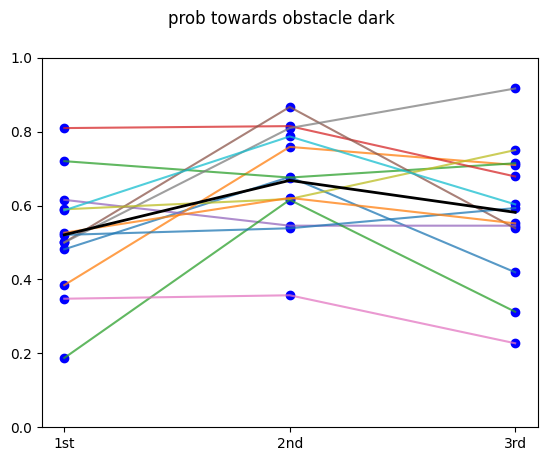

In [142]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob towards obstacle dark')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    print(ani,len(ani_df))
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'blue')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'blue')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'blue')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    print(ani,len(ani_df),[first_porp,sec_porp,third_porp])
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

G8CK1LN 382
G8CK1LT 285
G8CK1RT 298
G8CK1TT 329
G8CKLN 362
G8CKLT 224
G8CKRN 337
G8CKRT 407
G8CKTT 475
J701LT 179
J701NN 274
J701RN 246
J701RT 209


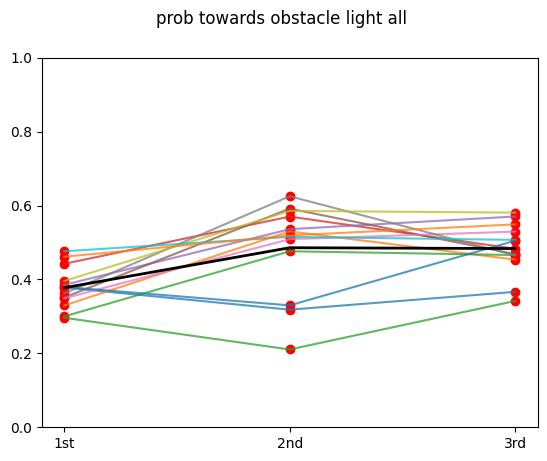

In [144]:
data = pd.concat([con_df])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob towards obstacle light all')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    print(ani,len(ani_df))
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'red')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'red')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'red')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

G8CK1LN 229
G8CK1LT 174
G8CK1RT 167
G8CK1TT 190
G8CKLN 270
G8CKLT 190
G8CKRN 252
G8CKRT 296
G8CKTT 368
J701LT 124
J701NN 204
J701RN 190
J701RT 133


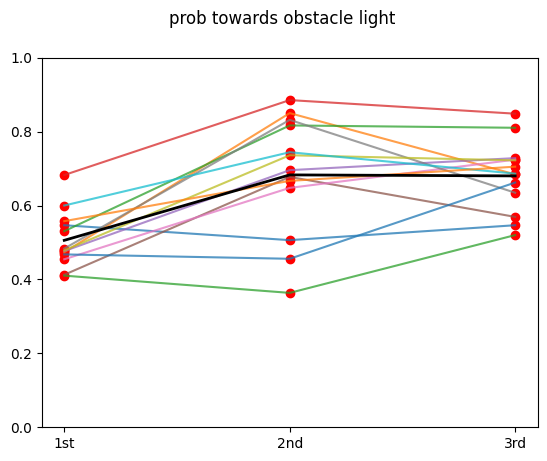

In [145]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob towards obstacle light')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    print(ani,len(ani_df))
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'red')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'red')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'red')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

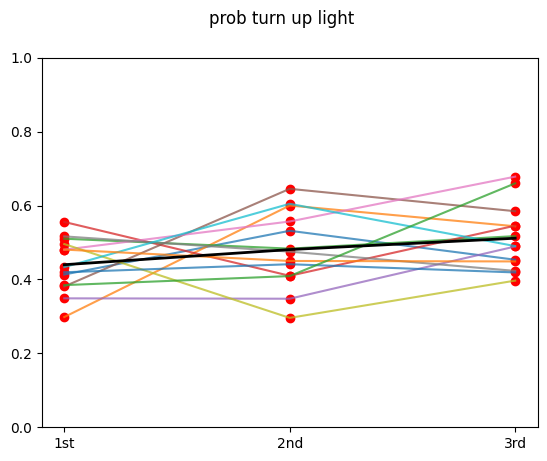

In [74]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob turn up light')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'red')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'red')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'red')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

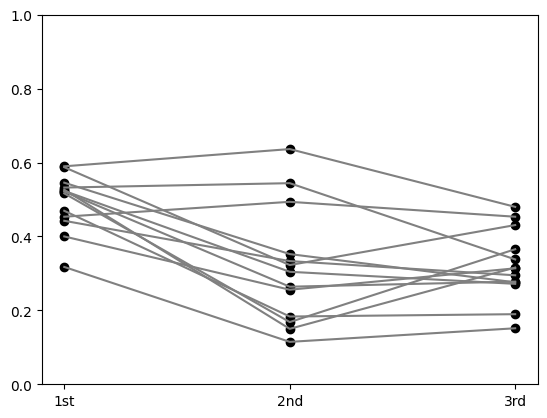

In [36]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'away')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'away')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'away')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')

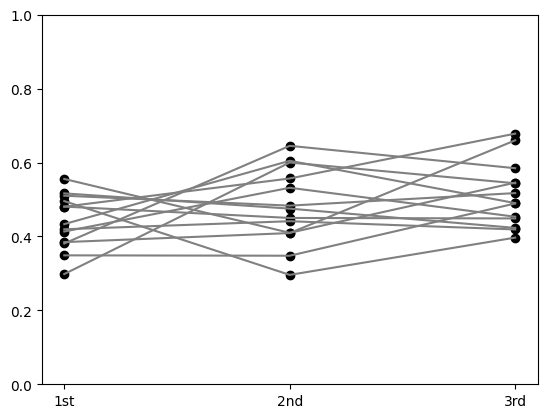

In [35]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')

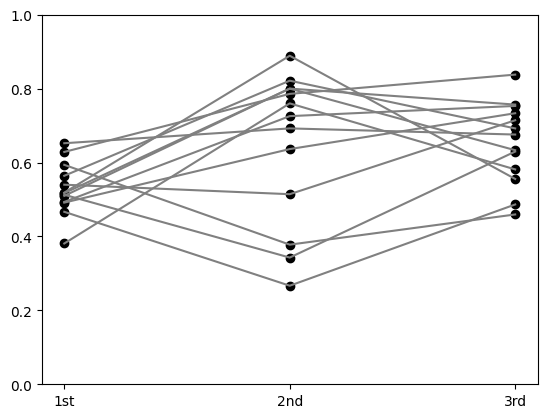

In [33]:
data = pd.concat([long_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')


(0.0, 0.8)

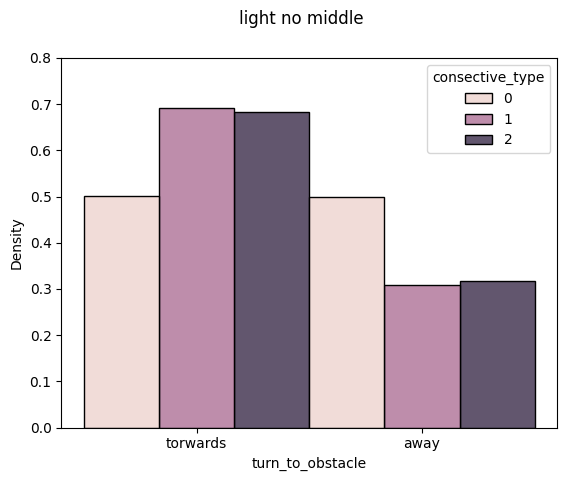

In [135]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light no middle')
plt.ylim(0,.8)

(0.0, 0.8)

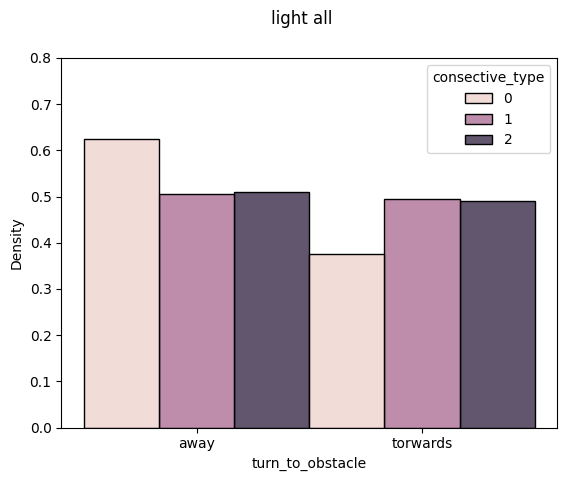

In [133]:
data = con_df
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light all')
plt.ylim(0,.8)

(0.0, 0.8)

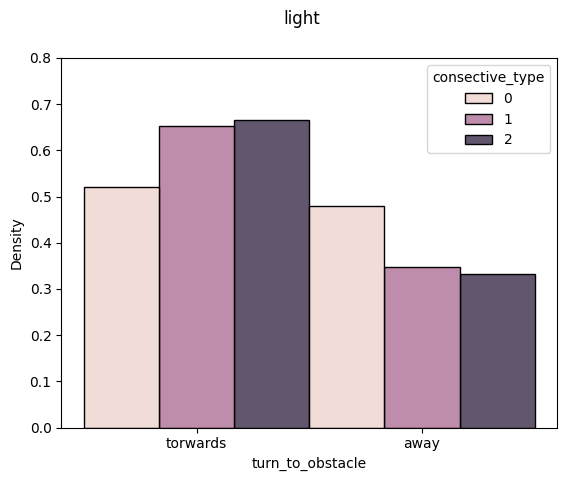

In [127]:
data = long_con_nostart
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light')
plt.ylim(0,.8)

(0.0, 0.8)

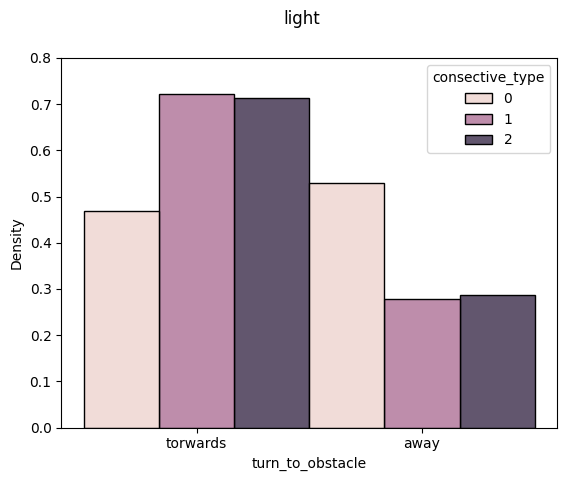

In [15]:
data = short_con_nostart
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light')
plt.ylim(0,.8)

(0.0, 0.8)

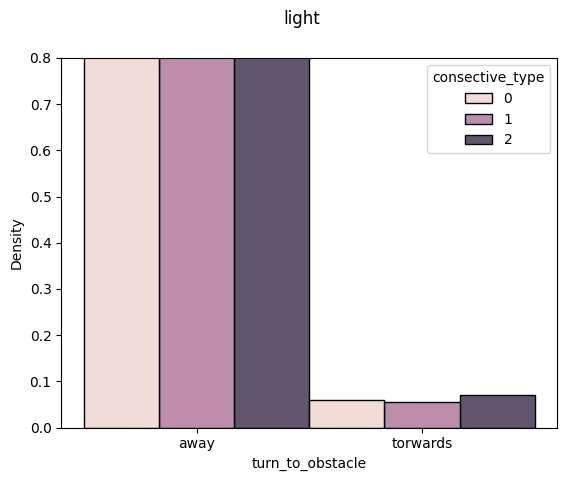

In [131]:
data = middle_con_nostart
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light')
plt.ylim(0,.8)

(0.0, 0.8)

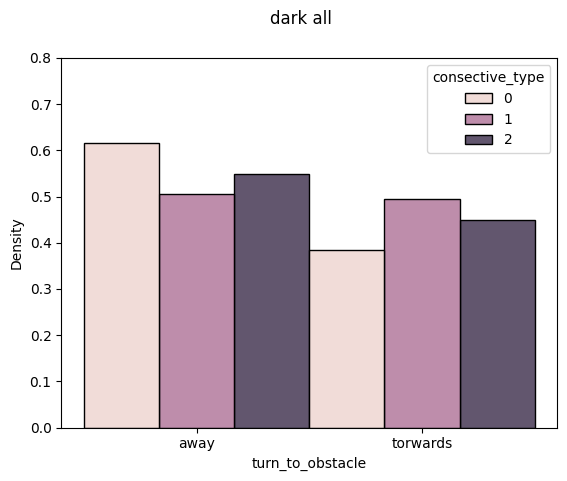

In [136]:
data = pd.concat([con_df])
data = data[(data.consective_type <=2) & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark all')
plt.ylim(0,.8)

(0.0, 0.8)

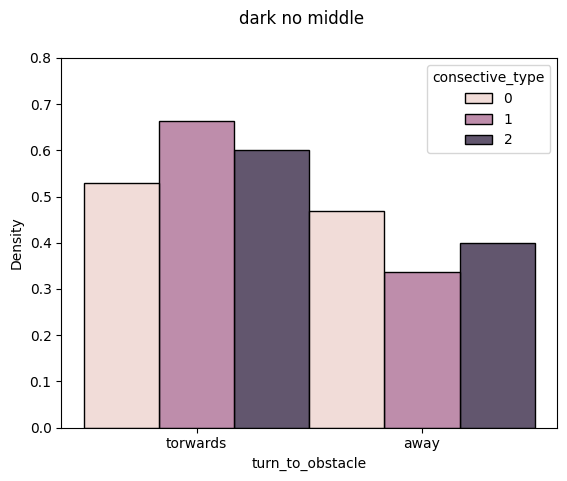

In [137]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2) & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark no middle')
plt.ylim(0,.8)

In [ ]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2) & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >=.7)& (data.date_index == 0)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark')
plt.ylim(0,.8)

(0.0, 0.8)

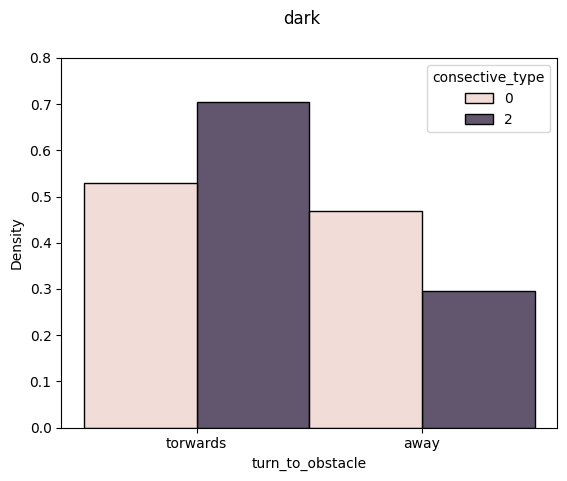

In [104]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark')
plt.ylim(0,.8)

(0.0, 0.8)

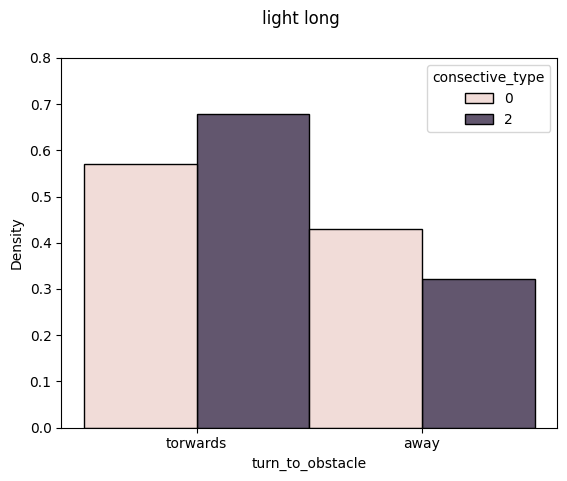

In [420]:
data = long_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')]

sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light long')
plt.ylim(0,.8)


(0.0, 0.8)

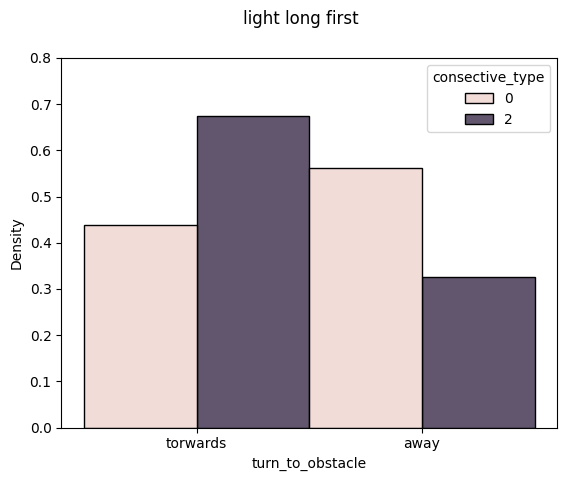

In [422]:
data = long_con_nostart[long_con_nostart.date_index == 0]
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light long first')
plt.ylim(0,.8)

Text(0.5, 0.98, 'light long last')

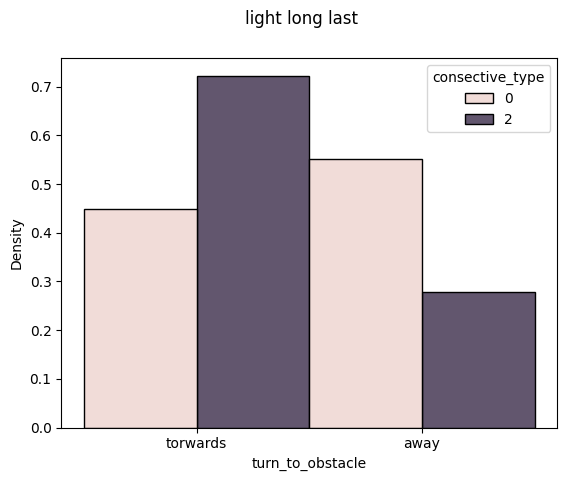

In [423]:
data = long_con_nostart[long_con_nostart.date_index == 6]
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light long last')

Text(0.5, 0.98, 'light long')

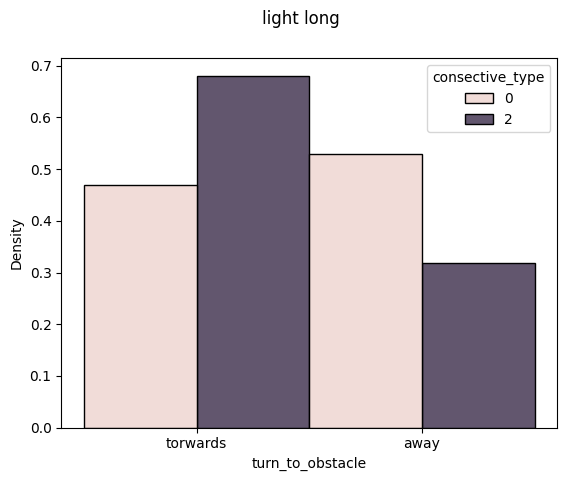

In [1091]:
data = long_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')& (data.date_index ==6)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light long')


Text(0.5, 0.98, 'light short')

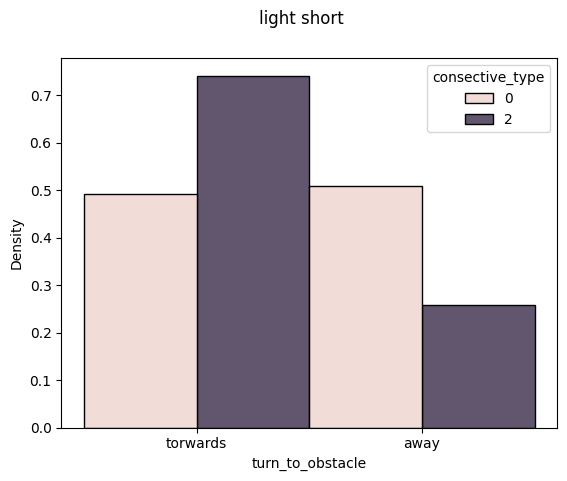

In [108]:
data = short_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')&(data.linearity >.7) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light short')

Text(0.5, 0.98, 'dark')

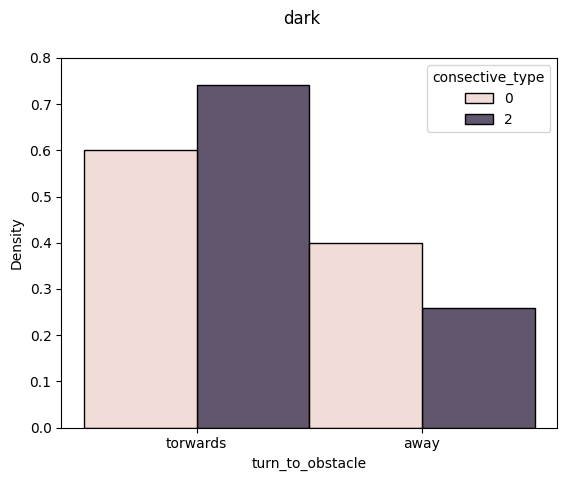

In [106]:
data = pd.concat([short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')&(data.linearity >.7) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

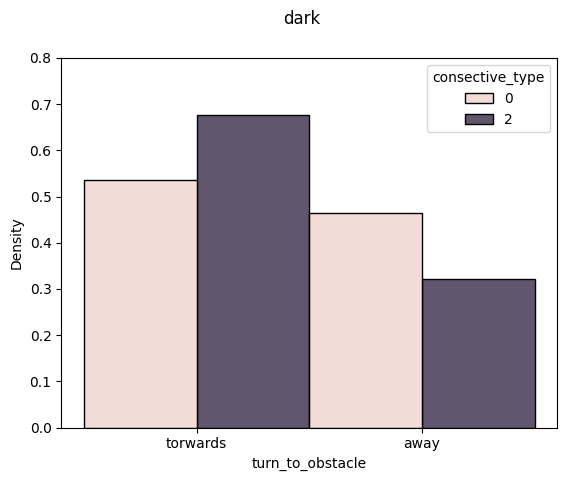

In [107]:
data = pd.concat([long_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')&(data.linearity >.7) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

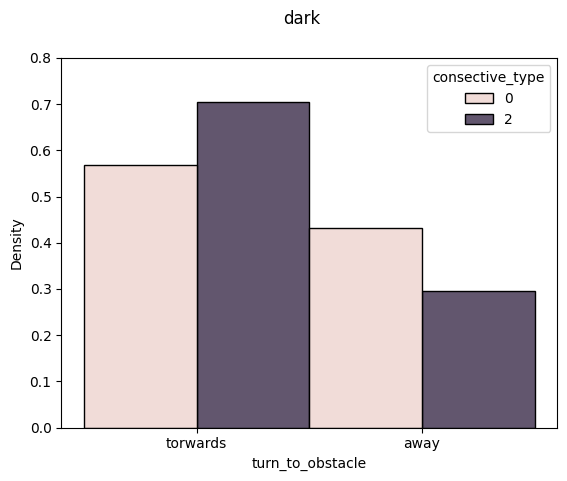

In [74]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')&(data.linearity >.7) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

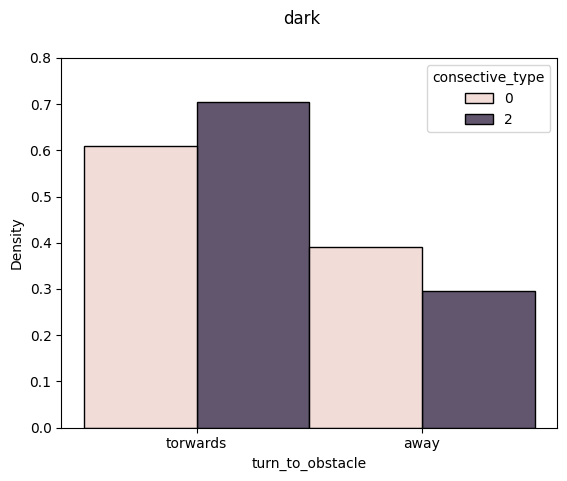

In [13]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')&(data.linearity >.6) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

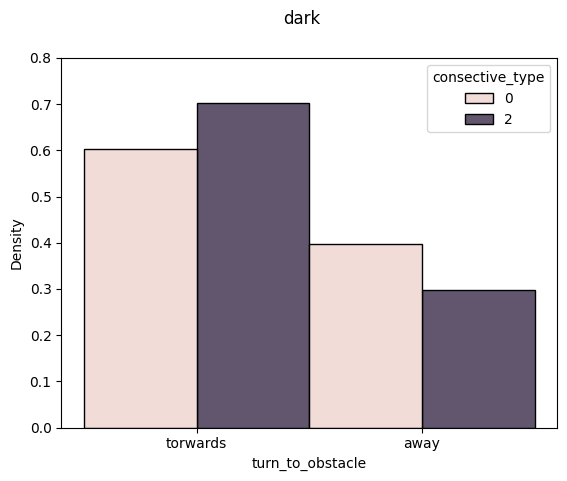

In [1098]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')& (data.date_index ==1)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

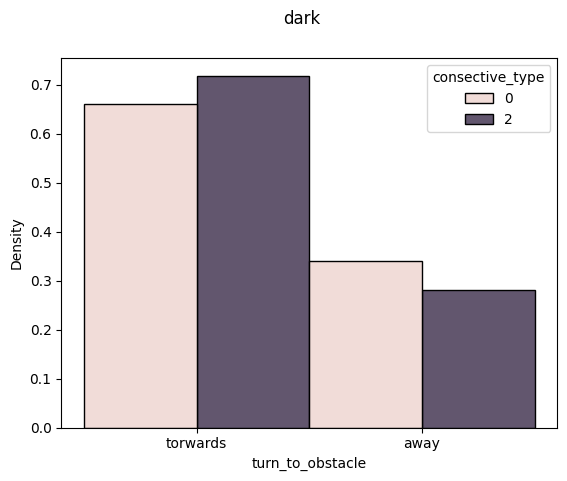

In [425]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')]
torwards = data[(data.turn_to_obstacle == 'torwards') &(data.avg_lateral_error < -3) ]
away = data[(data.turn_to_obstacle == 'away') &(data.avg_lateral_error > 3)]
data = pd.concat([torwards,away])
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark')

Text(0.5, 0.98, 'dark long')

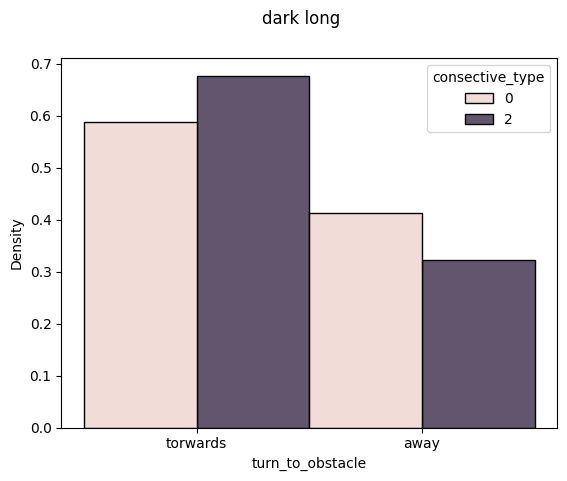

In [109]:
data = long_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark long')


Text(0.5, 0.98, 'dark long first')

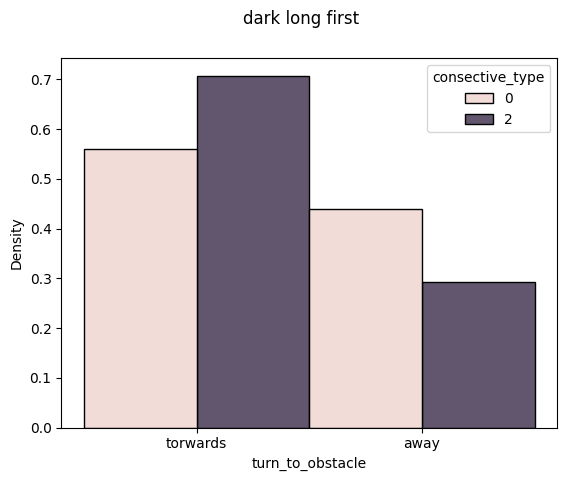

In [427]:
data = long_con_nostart[long_con_nostart.date_index == 0]
data = data[(data.consective_type ==2) | (data.consective_type ==0) ]
data = data[data.task =='oadark']

sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark long first')


Text(0.5, 0.98, 'dark long first')

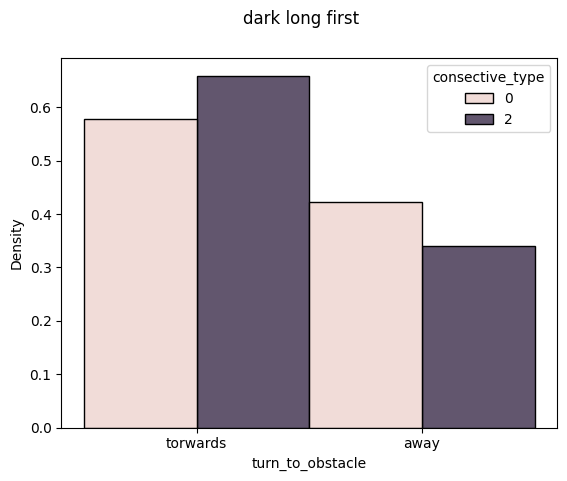

In [428]:
data = long_con_nostart[long_con_nostart.date_index == 5]
data = data[(data.consective_type ==2) | (data.consective_type ==0) ]
data = data[data.task =='oadark']

sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark long first')


Text(0.5, 0.98, 'dark short')

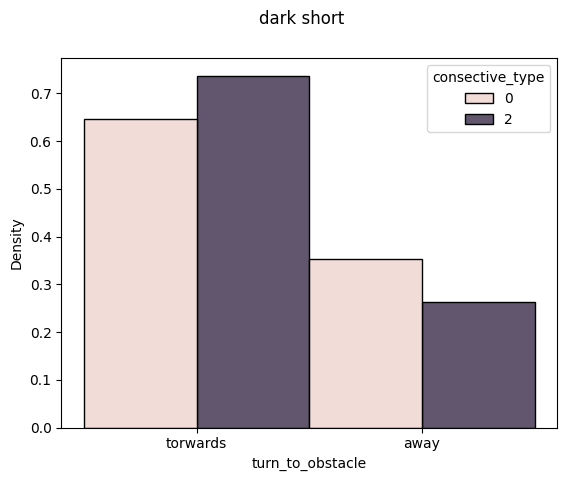

In [429]:
data = short_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')]
torwards = data[(data.turn_to_obstacle=='torwards')]
away = data[(data.turn_to_obstacle=='away')]
data = pd.concat([torwards,away])

sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark short')

687


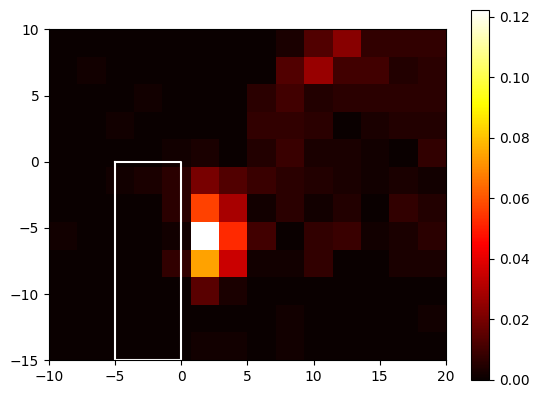

In [952]:
data = pd.concat([long_con_nostart])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0) ]
print(len(first_trial))
ymin,ymax = -10,20
xmin,xmax = -15,10

head_turn,lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

array ,xedges ,yedges   = np.histogram2d(lateral_error.astype(float), head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

plt.imshow(array[::-1]/len(first_trial),cmap='hot',extent=[ymin,ymax,xmin,xmax])

plt.plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
plt.colorbar()

687


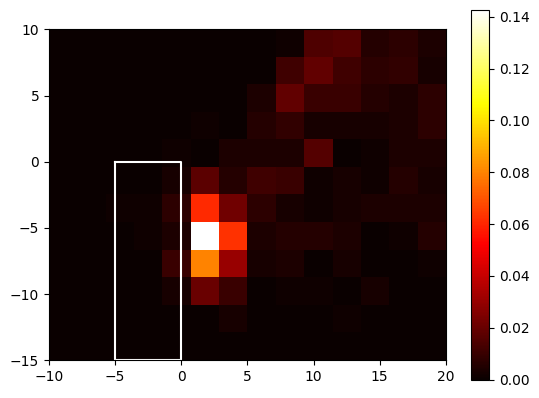

In [953]:
data = pd.concat([long_con_nostart])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 2) ]
print(len(first_trial))
ymin,ymax = -10,20
xmin,xmax = -15,10

head_turn,lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

array ,xedges ,yedges   = np.histogram2d(lateral_error.astype(float), head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

plt.imshow(array[::-1]/len(first_trial),cmap='hot',extent=[ymin,ymax,xmin,xmax])

plt.plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
plt.colorbar()

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

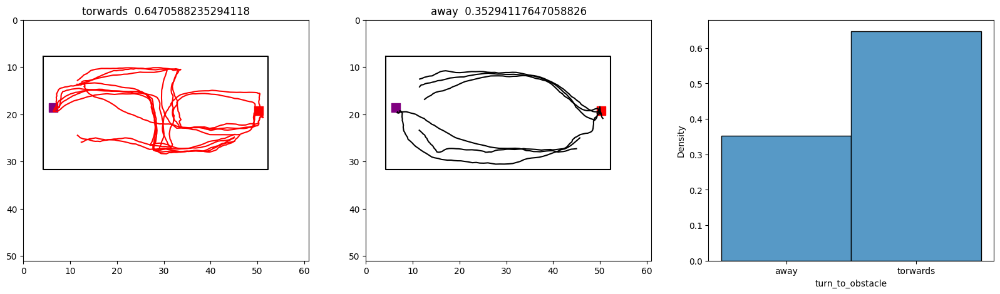

In [113]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.linearity >.7) &(long_con_nostart.consective_type ==2)&(long_con_nostart.animal =='G8CK1TT')]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

In [114]:
long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.linearity >.7)&(long_con_nostart.animal =='G8CK1TT')]

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,consective_inds,consective_type
11958,3077,65636.409651,65638.826483,"[65636.411046, 65636.428364, 65636.444454, 656...","[[6684, 6685, 6686, 6687, 6688, 6689, 6690, 66...","[680.6180419921875, 681.5030517578125, 681.443...","[280.7645263671875, 280.52679443359375, 280.03...","[665.7070922851562, 666.2946166992188, 667.448...","[273.58660888671875, 272.9472961425781, 272.19...","[672.4884643554688, 671.9406127929688, 672.209...",...,"[0.08386608346863511, 0.04139505870363891, 0.1...","[0.5992219126093943, 0.7674829442208946, 0.736...",69.636757,54.753595,1.476034,down,away,True,"[11952, 11953, 11954, 11955, 11956, 11957, 119...",6
11960,3079,65641.652979,65643.918297,"[65641.66272, 65641.681177, 65641.696102, 6564...","[[6999, 7000, 7001, 7002, 7003, 7004, 7005, 70...","[680.2017822265625, 680.1605834960938, 680.970...","[280.2463684082031, 280.6188049316406, 281.060...","[668.2733764648438, 669.8080444335938, 670.662...","[270.7386474609375, 270.8243713378906, 271.263...","[670.0817260742188, 671.5828857421875, 672.651...",...,"[0.030897550838105303, 0.09349734747122085, 0....","[0.8439494814286093, 0.796636609387523, 0.7048...",69.528466,58.207375,1.109510,down,away,True,"[11952, 11953, 11954, 11955, 11956, 11957, 119...",8
12007,3126,65808.582886,65810.840012,"[65808.587161, 65808.605056, 65808.620467, 658...","[[17011, 17012, 17013, 17014, 17015, 17016, 17...","[679.4832153320312, 680.1227416992188, 680.068...","[278.8104248046875, 278.814453125, 278.8755798...","[669.4466552734375, 670.2052001953125, 670.511...","[267.9240417480469, 267.8575134277344, 268.357...","[669.4932250976562, 670.4647216796875, 670.614...",...,"[0.048071975215727036, 0.008582653010584806, 0...","[0.8359344461071636, 0.8493976994087724, 0.843...",67.270923,56.653629,1.450598,down,away,True,"[12005, 12006, 12007, 12008, 12009, 12010, 120...",2
12011,3130,65818.963020,65821.330752,"[65818.97399, 65818.991936, 65819.007424, 6581...","[[17634, 17635, 17636, 17637, 17638, 17639, 17...","[680.677001953125, 680.9158325195312, 680.8042...","[280.7526550292969, 281.2377014160156, 280.783...","[668.0975341796875, 669.357177734375, 669.2704...","[272.5606689453125, 272.32666015625, 271.92434...","[671.560302734375, 672.7471923828125, 673.1527...",...,"[0.05407185376124701, 0.042265861744823496, 0....","[0.9196204420358711, 0.651912335368138, 0.8175...",67.951196,55.727592,1.882120,down,away,True,"[12005, 12006, 12007, 12008, 12009, 12010, 120...",6
12013,3132,65824.632422,65826.878502,"[65824.642777, 65824.65975, 65824.676096, 6582...","[[17974, 17975, 17976, 17977, 17978, 17979, 17...","[680.3864135742188, 680.3386840820312, 679.952...","[280.37518310546875, 280.8460388183594, 279.88...","[665.5720825195312, 666.744140625, 666.8549194...","[272.8357849121094, 272.58343505859375, 271.88...","[671.4771118164062, 671.6416015625, 672.148437...",...,"[0.038737057797835206, 0.10057547166719516, 0....","[0.4257656974092825, 0.32097640526663795, 0.28...",63.835083,54.434440,-1.238643,up,torwards,True,"[12005, 12006, 12007, 12008, 12009, 12010, 120...",8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14012,5131,64588.880908,64590.937254,"[64588.884556, 64588.901184, 64588.919091, 645...","[22498, 22499, 22500, 22501, 22502, 22503, 225...","[90.3122329711914, 90.11852264404297, 90.02382...","[262.5616760253906, 263.02923583984375, 262.77...","[97.6994400024414, 96.83263397216797, 96.30661...","[258.57611083984375, 258.9121398925781, 258.62...","[97.99815368652344, 97.28605651855469, 96.9450...",...,"[0.049172117996843845, 0.02578140769144799, 0....","[0.8399471884504681, 1.0542805275714482, 0.923...",64.330368,51.986751,-2.085356,up,away,True,"[14012, 14013, 14014, 14015, 14016, 14017]",0
1

In [76]:
data.animal.unique()

array(['G8CK1LN', 'G8CK1LT', 'G8CK1RT', 'G8CK1TT', 'G8CKLN', 'G8CKLT',
       'G8CKRN', 'G8CKRT', 'G8CKTT', 'J704LN', 'J704LT', 'J704NN',
       'J704RT'], dtype=object)

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

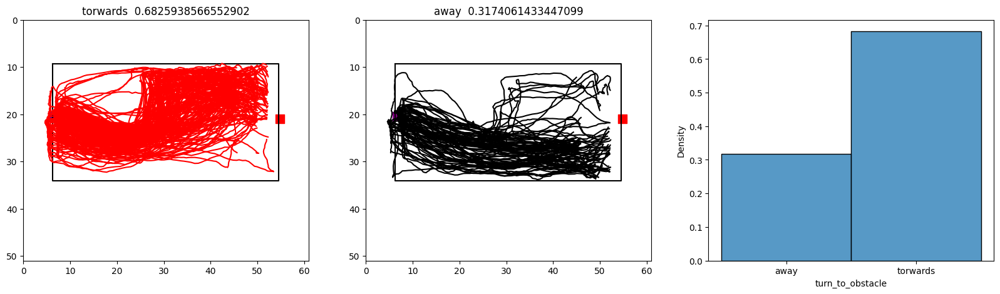

In [110]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 0)&(long_nostart.linearity >.7) ]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

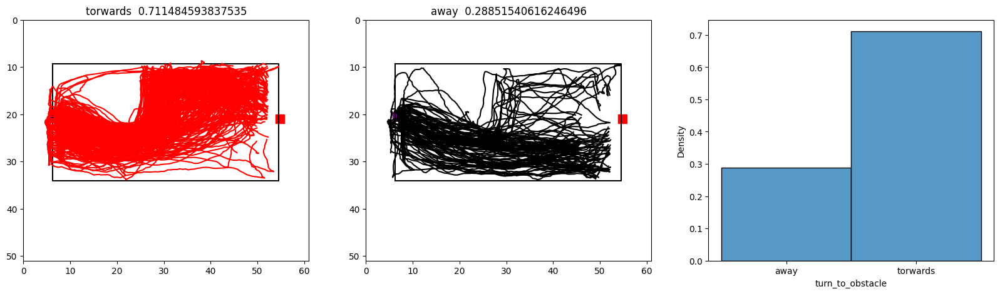

In [32]:
data = data[data.obstacle_cross == True]
fig,ax = plt.subplots(1,3,figsize = (20,5))
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

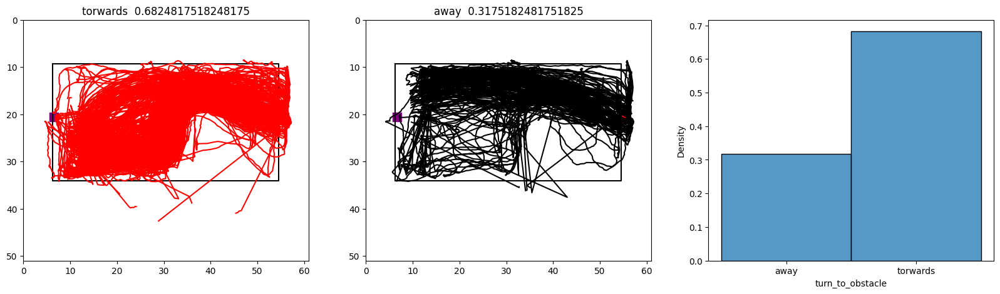

In [49]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 5)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

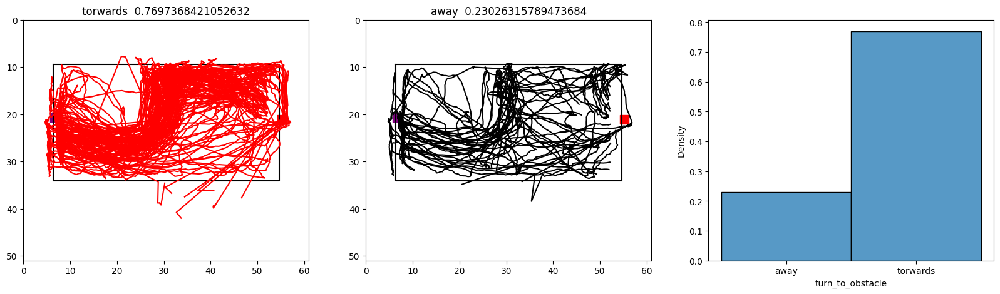

In [105]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 0)&(long_nostart.linearity < .7)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_direction', ylabel='Count'>

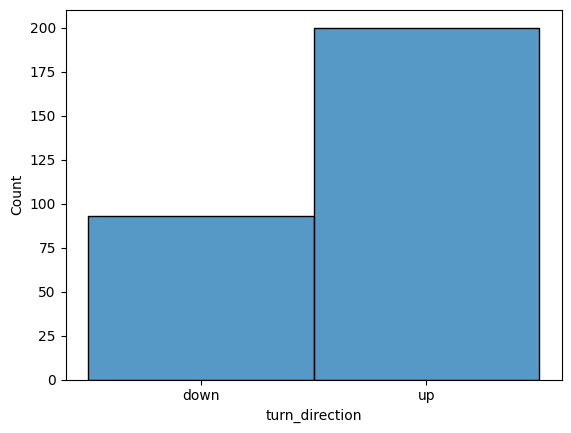

In [27]:
sns.histplot(data = data, x ='turn_direction')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

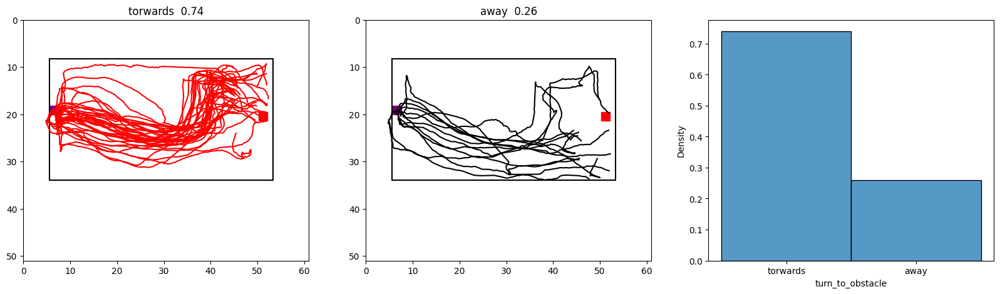

In [85]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = short_con_nostart[(short_con_nostart.task == 'oadark')&(short_con_nostart.obstacle_cluster == 1)&(short_con_nostart.linearity > .6)& (short_con_nostart.consective_type ==0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

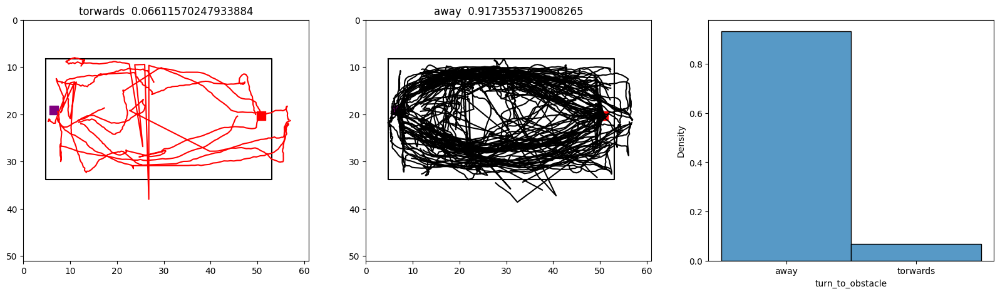

In [123]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = con_df[(con_df.task == 'oadark')&(con_df.obstacle_cluster == 2)& (con_df.consective_type ==0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

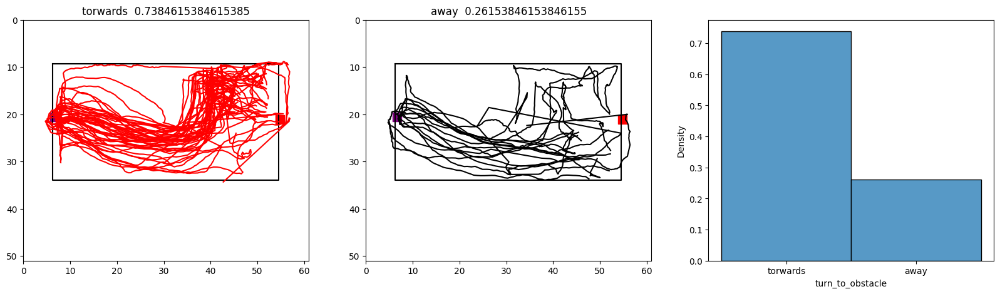

In [86]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = short_con_nostart[(short_con_nostart.task == 'oadark')&(short_con_nostart.obstacle_cluster == 1)& (short_con_nostart.consective_type ==0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

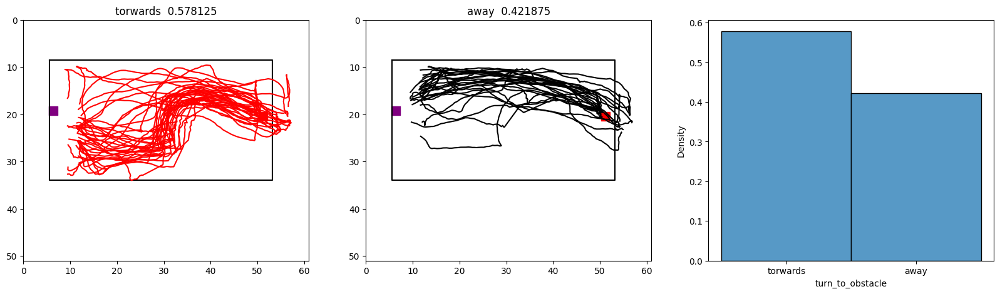

In [78]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.obstacle_cluster == 5)&(long_con_nostart.linearity > .7)& (long_con_nostart.consective_type ==0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

In [677]:
turn_direction(data)
turn_to_obstacle(data)

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

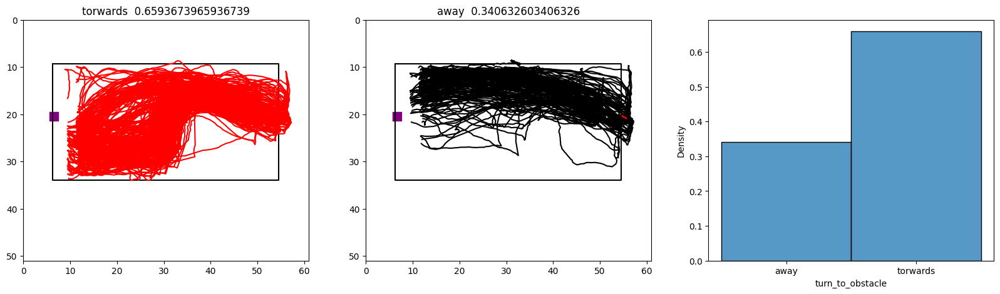

In [678]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')


In [ ]:
turn_direction(data)
turn_to_obstacle(data)

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

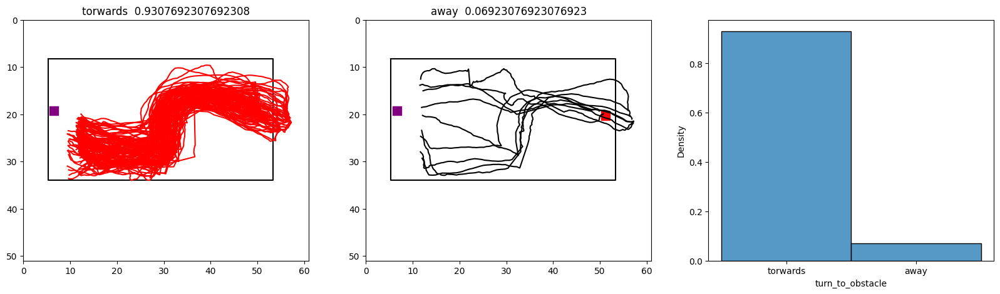

In [654]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 5)&(long_nostart.linearity > .7)&(long_nostart.distance_at_head_turn <8)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')


In [19]:
from scipy.signal import find_peaks

In [670]:

def turn_direction(df):
    for ind,row in df.iterrows():
        peaks, _ = find_peaks(np.abs(row.head_angle_velocity), height=(1,10))
        head_direction = row.head_angle_velocity[peaks[0]]
        
        if head_direction < 0:
            df.at[ind,'turn_direction'] = 'up'
        elif head_direction> 0:
            df.at[ind,'turn_direction'] = 'down'


In [665]:
row.head_angle_velocity[peaks[0]]

-1.3995253382529516

In [664]:
peaks[0]

4

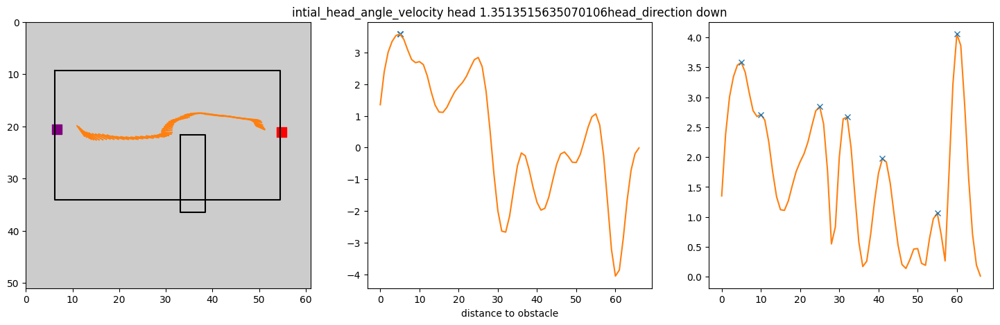

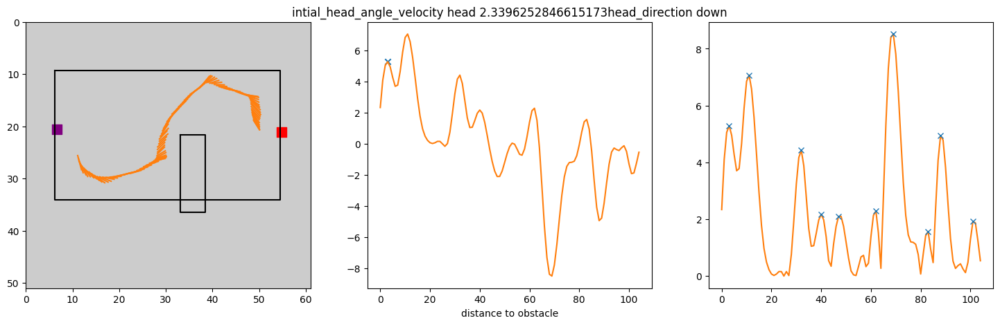

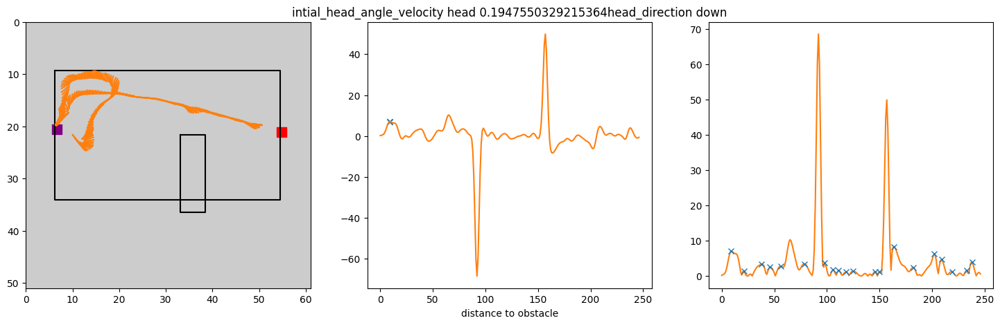

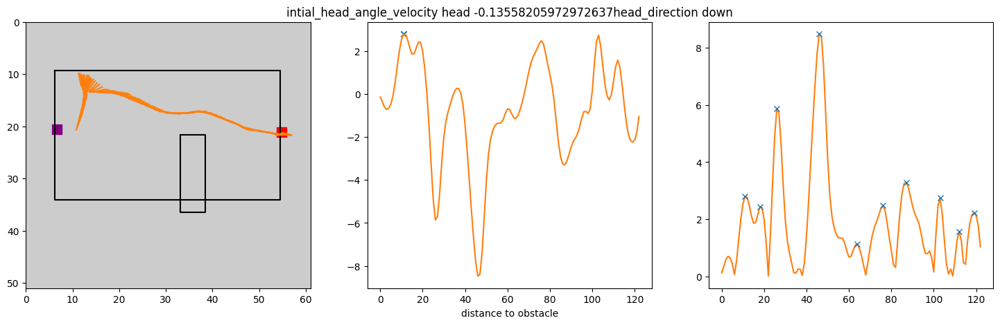

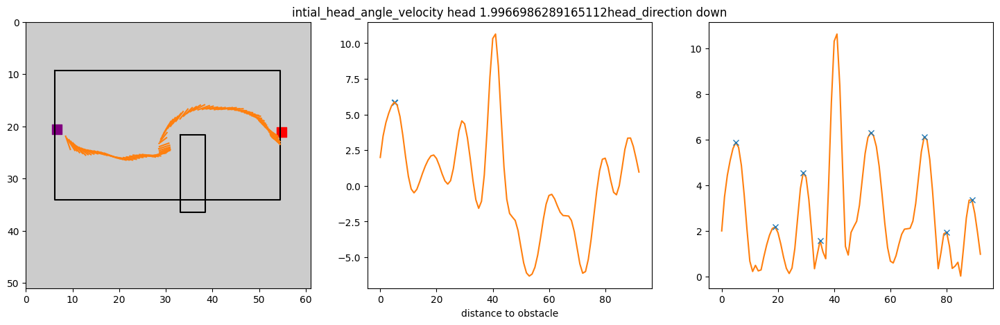

...

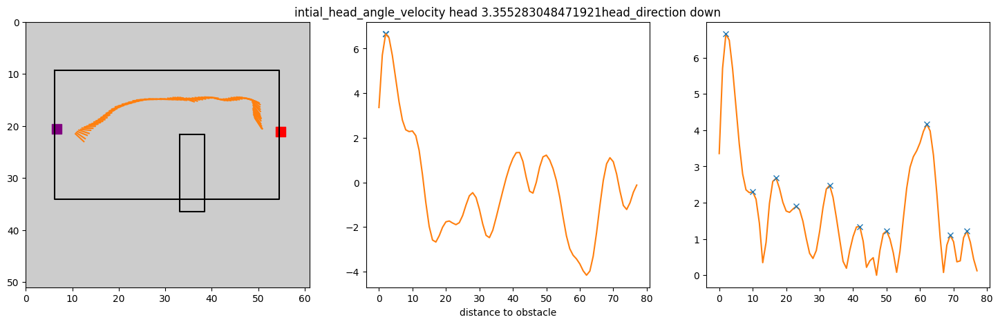

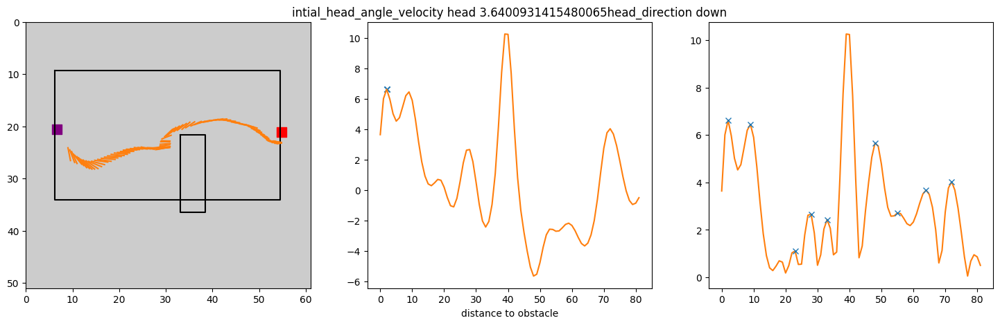

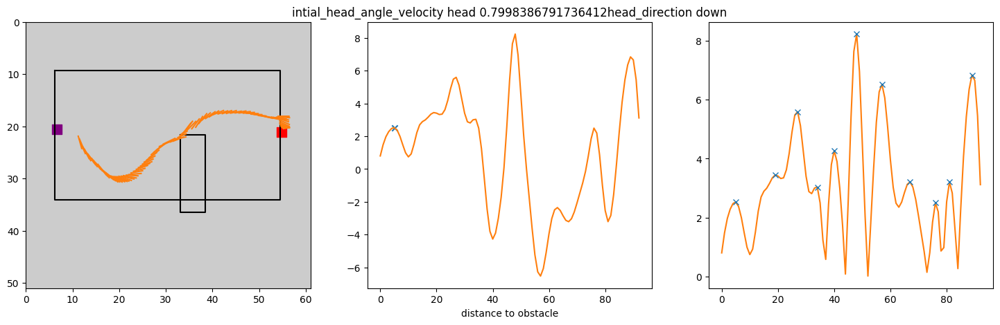

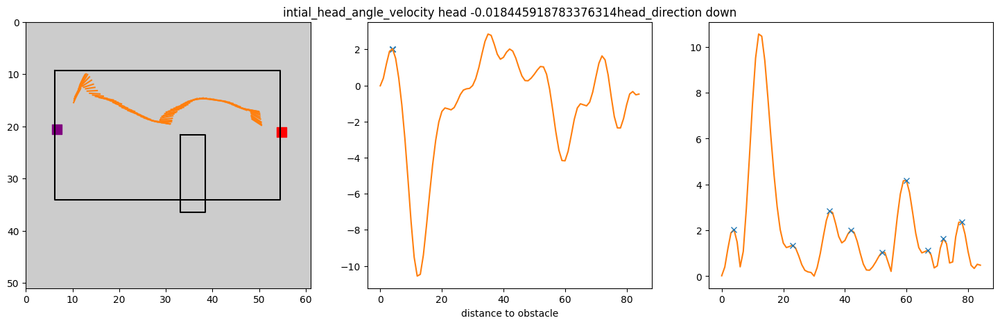

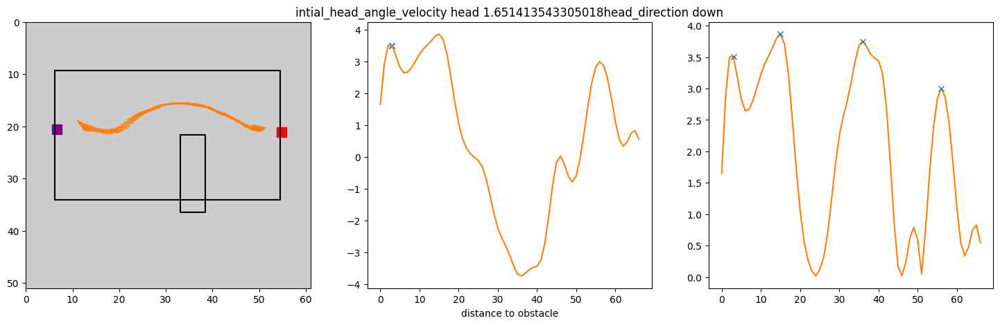

In [52]:
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 5)&(long_nostart.turn_to_obstacle =='torwards')&(long_nostart.distance_at_head_turn >8)&(long_nostart.obstacle_cross == True)]
    
for ind,row in data.sample(20).iterrows():
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    
    #ax[1].set_xlim(20,0)
    

    if row.turn_to_obstacle == 'torwards':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))

    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        peaks, _ = find_peaks(np.abs(row.head_angle_velocity), height=(1,10))
        ax[1].set_title('intial_head_angle_velocity head '+ str(row.intial_head_angle_velocity)+ 'head_direction ' + str(row.turn_direction))

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle')
  
        ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
        ax[1].plot(row.head_angle_velocity,color = 'tab:orange')
        ax[2].plot(np.abs(row.head_angle_velocity),color = 'tab:orange')
        ax[2].plot(peaks, np.abs(row.head_angle_velocity)[peaks], "x")
        ax[1].scatter(peaks[0], row.head_angle_velocity[peaks[0]], marker = "x")


In [660]:
from scipy.signal import find_peaks

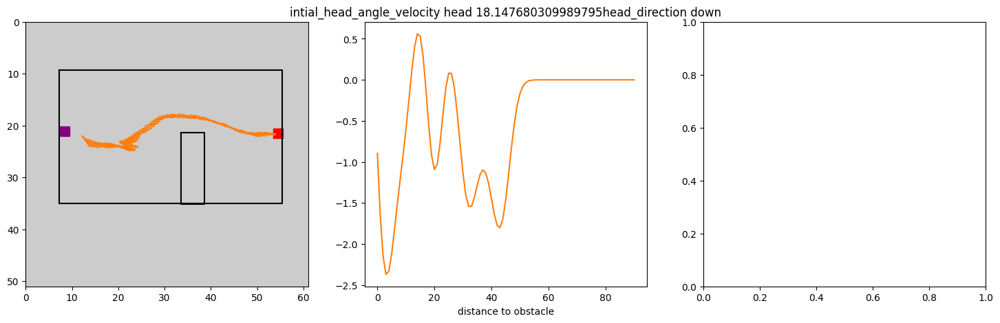

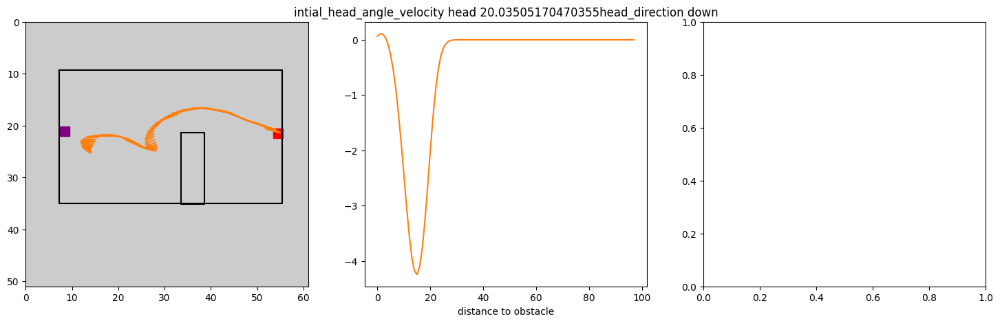

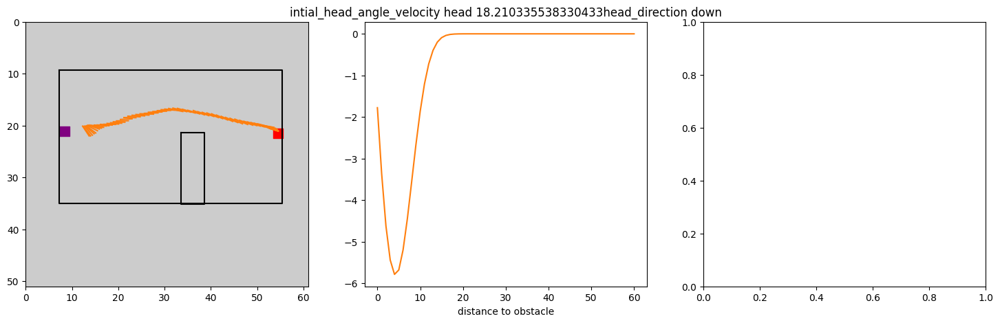

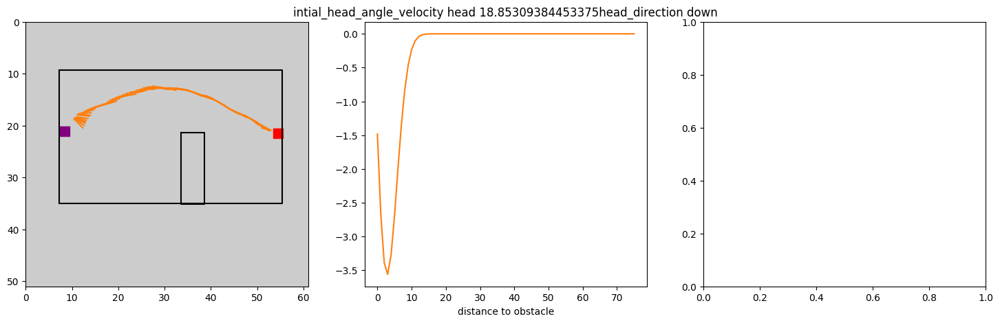

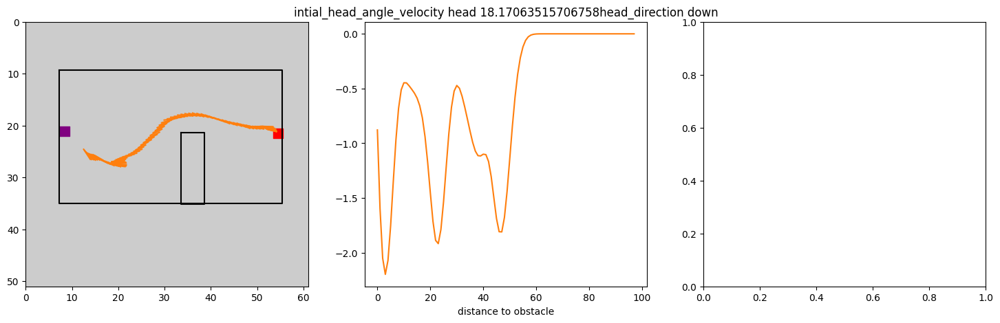

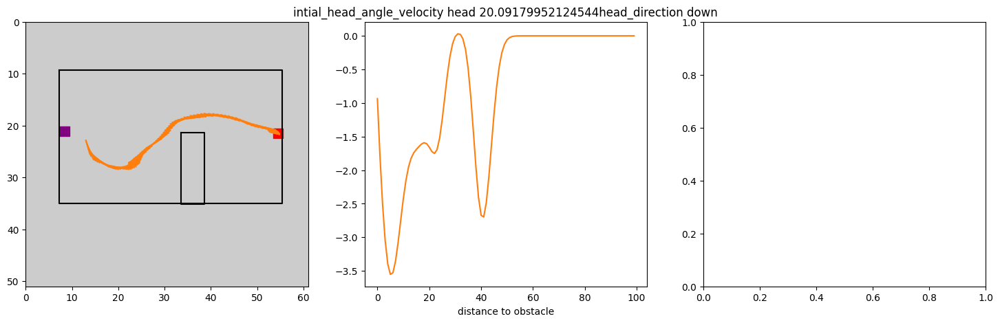

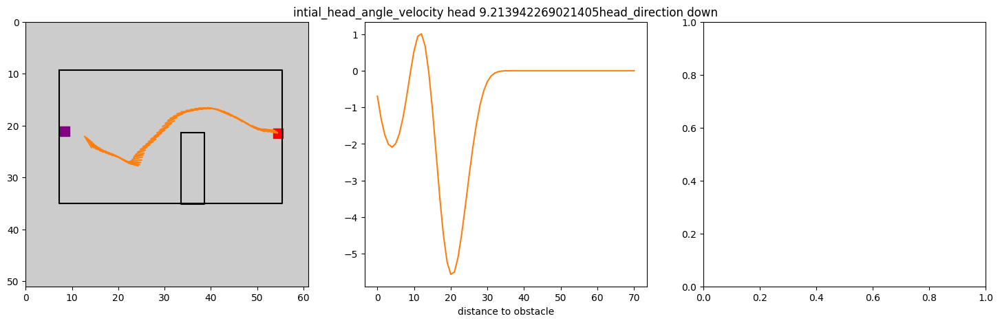

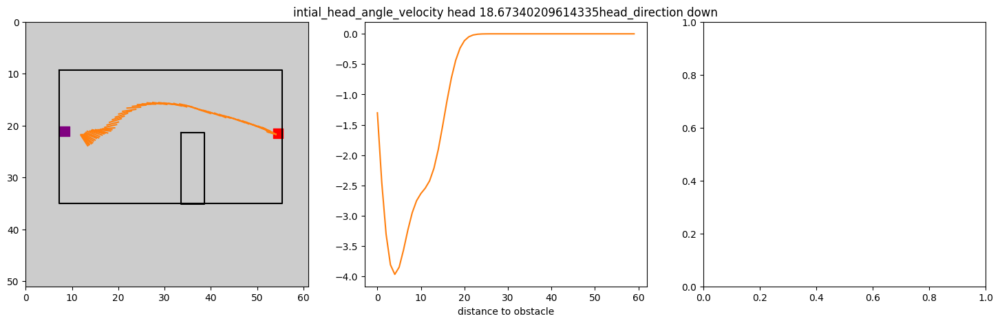

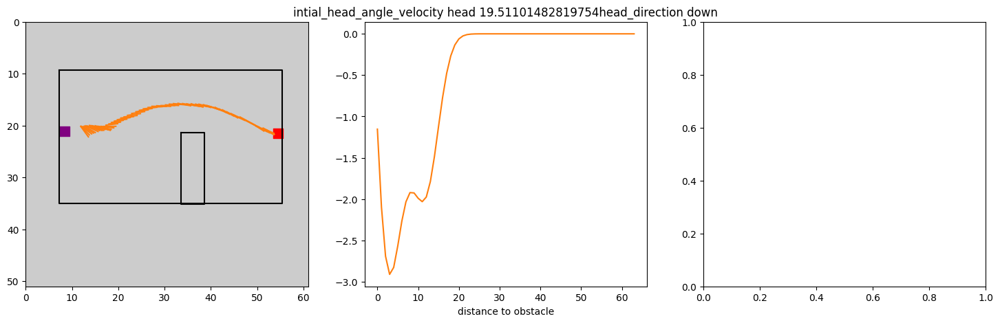

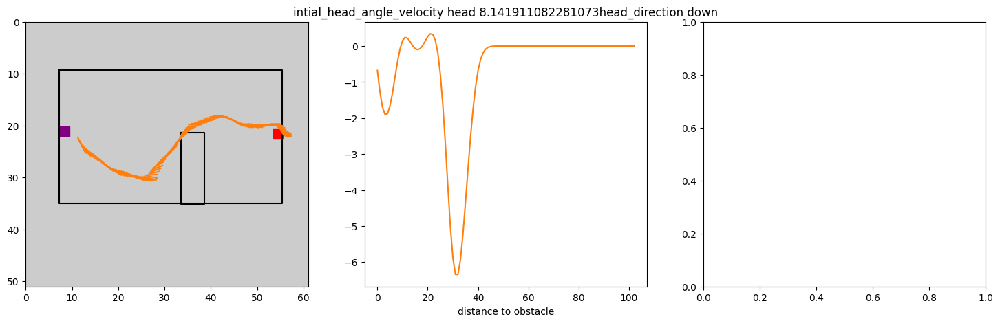

In [62]:
data = long_nostart[(long_nostart.task == 'oa')&(long_nostart.obstacle_cluster == 5)&(long_nostart.linearity > .6)&(long_nostart.turn_to_obstacle =='torwards')&(long_nostart.distance_at_head_turn >8)].sample(10)
    
for ind,row in data.iterrows():
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    
    #ax[1].set_xlim(20,0)
    

    if row.turn_to_obstacle == 'torwards':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))

    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        ax[1].set_title('intial_head_angle_velocity head '+ str(row.distance_at_head_turn)+ 'head_direction ' + str(row.turn_direction))

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle')
  
        ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
        ax[1].plot(row.head_corner_angle_velocity,color = 'tab:orange')
       

In [66]:
row.obstacle_ind

54.0

In [63]:
row.head_corner_angle_velocity[:int(row.obstacle_ind)].argmin()

31

In [65]:
row.ts_distance_from_edge[:int(row.obstacle_ind)][31]

8.141911082281073

In [603]:
redo_ts_trace(data)

corner
port


<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

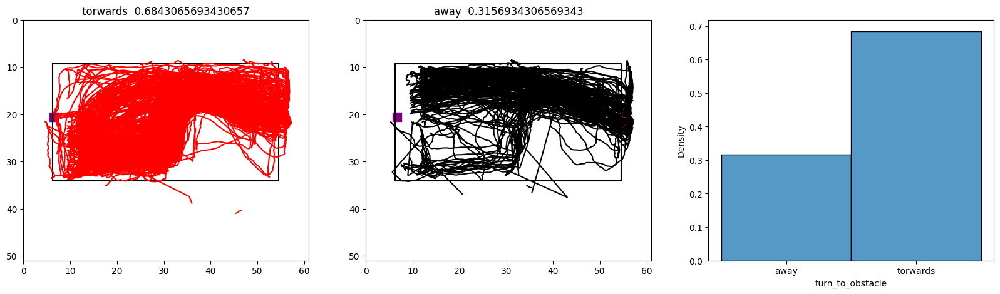

In [604]:
fig,ax = plt.subplots(1,3,figsize = (20,5))

plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

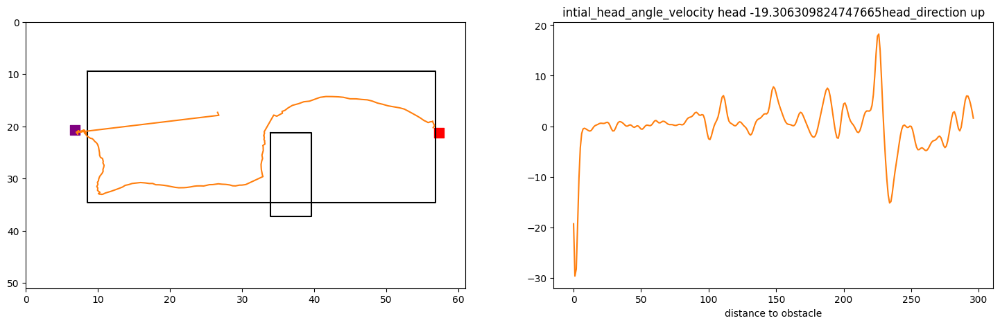

In [189]:

    
        
trial_df = data.loc[[9252]]
fig,ax = plt.subplots(1,2,figsize=(18,5))
  
#ax[1].set_xlim(20,0)
  

if row.turn_to_obstacle == 'torwards':
    ax[0].set_facecolor('grey') 
    ax[0].patch.set_alpha(.4)
else:
    None


plot_arena(trial_df,ax[0])
plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



for ind,row in trial_df.iterrows():
    ax[1].set_title('intial_head_angle_velocity head '+ str(row.intial_head_angle_velocity)+ 'head_direction ' + str(row.turn_direction))

    #ax[1].set_ylim(-12,2)
    ax[1].set_xlabel('distance to obstacle')


    ax[0].plot((row.ts_nose_x_cm),(row.ts_nose_y_cm),color = 'tab:orange')
    ax[1].plot(row.head_angle_velocity,color = 'tab:orange')

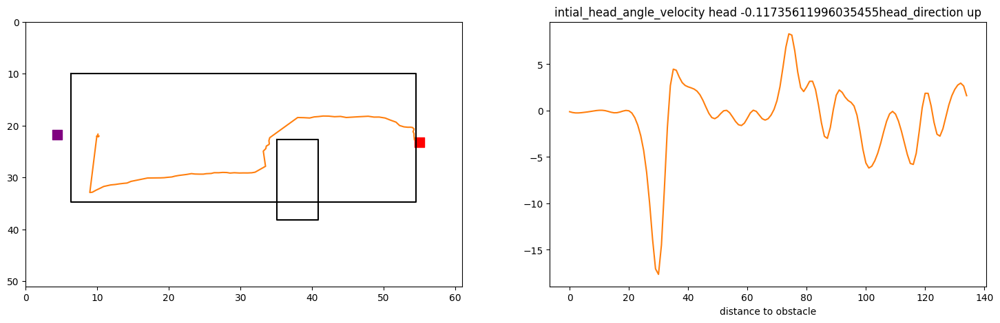

In [587]:
fig,ax = plt.subplots(1,2,figsize=(18,5))
plot_arena(trial_df,ax[0])
plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



for ind,row in trial_df.iterrows():
    ax[1].set_title('intial_head_angle_velocity head '+ str(row.intial_head_angle_velocity)+ 'head_direction ' + str(row.turn_direction))

    #ax[1].set_ylim(-12,2)
    ax[1].set_xlabel('distance to obstacle')


    ax[0].plot((row.ts_nose_x_cm),(row.ts_nose_y_cm),color = 'tab:orange')
    ax[1].plot(row.head_angle_velocity,color = 'tab:orange')

In [573]:
thresh = 1 
points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
                  'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
                 'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]

for ind, row in test_1.iterrows():
    diff_array = np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float))))
    
    drop_inds = np.argwhere(np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float)))) > 1).flatten()
    
 
    if len(drop_inds) <=thresh:
        continue
    else:
        if row.odd == 'left':
            nose =  row['ts_nose_x_cm'][drop_inds[-1]+1:]
            odd_ind = np.argmax(nose>(row.leftportT_x_cm+5))
            for point in points:
                test_1.at[ind,point] = row[point][drop_inds[-1]+1:][odd_ind:].astype(object)
        elif row.odd == 'right':
            nose =  row['ts_nose_x_cm'][drop_inds[-1]+1:]
            even_ind = np.argmax(nose<(row.rightportT_x_cm-5))
            for point in points:
                test_1.at[ind,point] = row[point][drop_inds[-1]+1:][even_ind:].astype(object)
heading_calcs(test_1)
distance_calcs(test_1)
deveation(test_1)
lateral_error(test_1)
df_tortuosity(test_1)
head_angle_velocity(test_1)
turn_direction(test_1)

corner
port


In [ ]:
thresh = 1 
points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
                  'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
                 'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]

for ind, row in df.iterrows():
    diff_array = np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float))))
    
    drop_inds = np.argwhere(np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float)))) > 1).flatten()
    
 
    if len(drop_inds) <=thresh:
        continue
    else:
        if row.odd == 'left':
            nose =  row['ts_nose_x_cm'][drop_inds[-1]+1:]
            odd_ind = np.argmax(nose>(row.leftportT_x_cm+5))
            for point in points:
                df.at[ind,point] = row[point][drop_inds[-1]+1:][odd_ind:].astype(object)
        elif row.odd == 'right':
            nose =  row['ts_nose_x_cm'][drop_inds[-1]+1:]
            even_ind = np.argmax(nose<(row.rightportT_x_cm-5))
            for point in points:
                df.at[ind,point] = row[point][drop_inds[-1]+1:][even_ind:].astype(object)
heading_calcs(df)
distance_calcs(df)
deveation(df)
lateral_error(df)
df_tortuosity(df)
head_angle_velocity(df)
turn_direction(df)

In [ ]:
thresh = 1 
points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
                  'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
                 'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]

for ind, row in test_1.iterrows():
    diff_array = np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float))))
    
    drop_inds = np.argwhere(np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float)))) > 1).flatten()
    mask = np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float)))) > 1
    mask = np.invert(np.insert(mask,[0],0))
    mask = np.insert(mask,[0],-1)
 
    if len(drop_inds) <=thresh:
        continue
    else:
        nose =  row['ts_nose_x_cm'][mask]
        mask2 = np.diff(nose) > 1
        drop_ind = mask2.argmax()
        if np.abs(0 - drop_ind)<  np.abs(len(nose) - drop_ind):
            nose = nose[drop_ind:]
            if row.odd == 'left':
                odd_ind = np.argmax(nose>(row.leftportT_x_cm+5))
                for point in points:
                    test_1.at[ind,point] = row[point][mask][drop_ind:][odd_ind:].astype(object)
            elif row.odd == 'right':
                even_ind = np.argmax(nose<(row.rightportT_x_cm-5))
                for point in points:
                    test_1.at[ind,point] = row[point][mask][drop_ind:][even_ind:].astype(object)


        elif np.abs(0 - drop_ind)>  np.abs(len(nose) - drop_ind):
            nose = nose[:drop_ind]
            if row.odd == 'left':
                odd_ind = np.argmax(nose>(row.leftportT_x_cm+5))
                for point in points:
                    test_1.at[ind,point] = row[point][mask][:drop_ind][odd_ind:].astype(object)
            elif row.odd == 'right':
                even_ind = np.argmax(nose<(row.rightportT_x_cm-5))
                for point in points:
                    test_1.at[ind,point] = row[point][mask][drop_ind][even_ind:].astype(object)
heading_calcs(test_1)
distance_calcs(test_1)
deveation(test_1)
lateral_error(test_1)
df_tortuosity(test_1)
head_angle_velocity(test_1)
turn_direction(test_1)

In [2]:
light = pd.read_hdf(r'd:\obstacle_avoidance\metadata\SFN\data\G8CK_train_df.h5')
dark = pd.read_hdf(r'd:\obstacle_avoidance\metadata\SFN\data\G8CK_train_df.h5')
joint = pd.concat([light,dark])

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

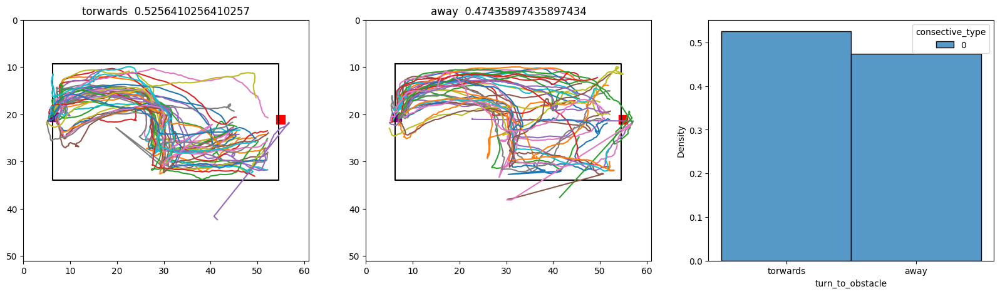

In [489]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.obstacle_cluster == 4)&(long_con_nostart.consective_type ==  0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm)
    elif row.turn_to_obstacle == 'away':
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm)

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')



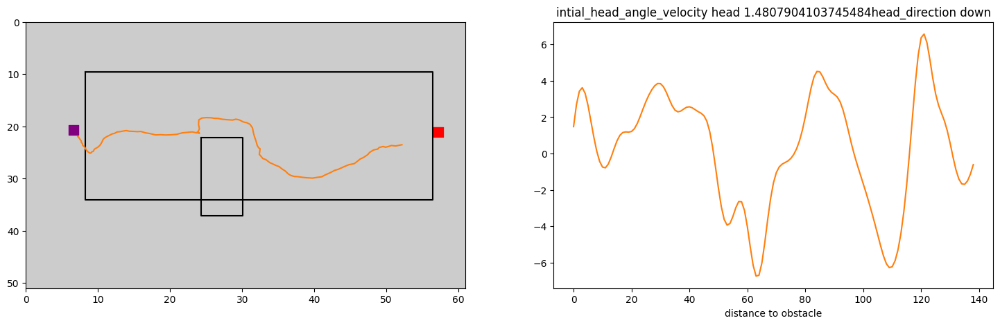

In [490]:
test = long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.obstacle_cluster == 4)&(long_con_nostart.consective_type ==  0)]
for ind,row in test.sample(1).iterrows():
    
        
    fig,ax = plt.subplots(1,2,figsize=(18,5))
  
   
    #ax[1].set_xlim(20,0)
  
   # ax[2].set_xlim(20,0)
    if row.turn_to_obstacle == 'torwards':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(trial_df,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('intial_head_angle_velocity head '+ str(row.intial_head_angle_velocity)+ 'head_direction ' + str(row.turn_direction))

   
    #ax[1].set_ylim(-12,2)
    ax[1].set_xlabel('distance to obstacle')
    

  
    ax[0].plot((row.ts_nose_x_cm),(row.ts_nose_y_cm),color = 'tab:orange')
    ax[1].plot(row.head_angle_velocity,color = 'tab:orange')

    #ax[0].scatte(row.ts_nose_x_cm,row.ts_nose_y_cm,)



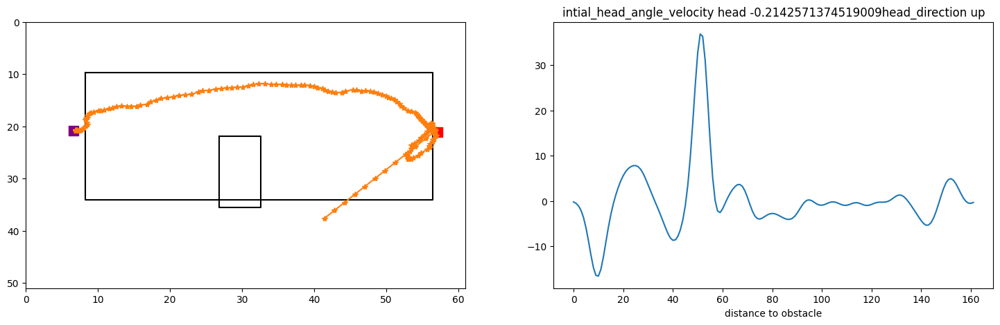

In [683]:
#test = long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.obstacle_cluster == 4)&(long_con_nostart.consective_type ==  0)]
for ind,row in test.sample(1).iterrows():
    
        
    fig,ax = plt.subplots(1,2,figsize=(18,5))
  
   
    #ax[1].set_xlim(20,0)
  
   # ax[2].set_xlim(20,0)
    if row.turn_to_obstacle == 'torwards':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(trial_df,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('intial_head_angle_velocity head '+ str(row.intial_head_angle_velocity)+ 'head_direction ' + str(row.turn_direction))

   
    #ax[1].set_ylim(-12,2)
    ax[1].set_xlabel('distance to obstacle')
    

  
    ax[0].plot((row.ts_nose_x_cm),(row.ts_nose_y_cm),color = 'tab:orange', marker = '*')
    ax[1].plot(row.head_angle_velocity)

    #ax[0].scatte(row.ts_nose_x_cm,row.ts_nose_y_cm,)

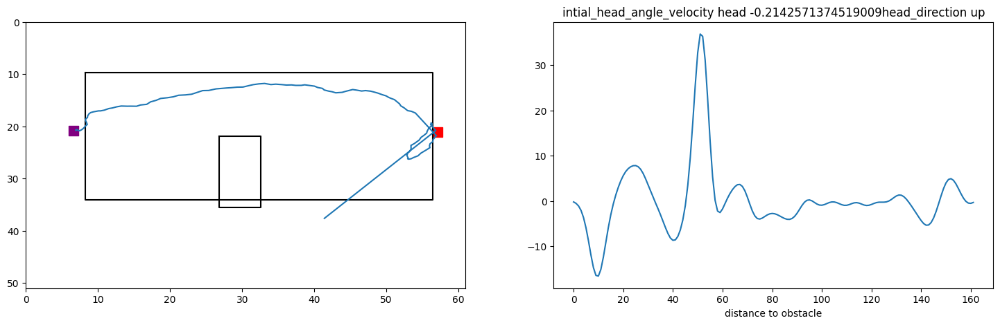

In [684]:
fig,ax = plt.subplots(1,2,figsize=(18,5))


    #ax[1].set_xlim(20,0)

   # ax[2].set_xlim(20,0)
if row.turn_to_obstacle == 'torwards':
    ax[0].set_facecolor('grey') 
    ax[0].patch.set_alpha(.4)
else:
    None
trial_df = test.loc[[ind]]
plot_arena(trial_df,ax[0])
plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))
#ax[0].set_title()
ax[1].set_title('intial_head_angle_velocity head '+ str(row.intial_head_angle_velocity)+ 'head_direction ' + str(row.turn_direction))
#ax[1].set_ylim(-12,2)
ax[1].set_xlabel('distance to obstacle')


ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm)
ax[1].plot(row.head_angle_velocity)

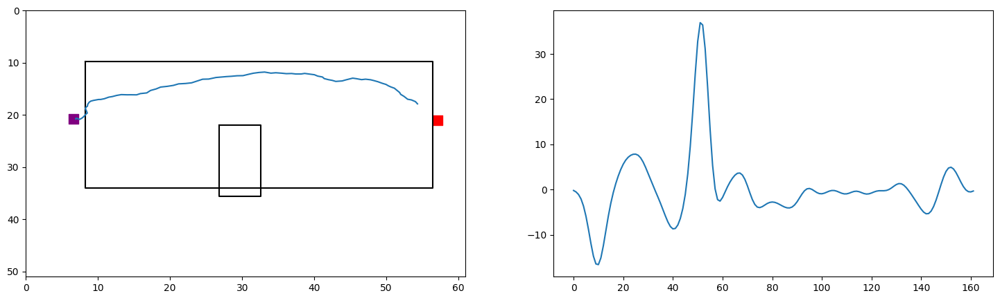

In [686]:
fig,ax = plt.subplots(1,2,figsize=(18,5))



#trial_df = test.loc[[ind]]
plot_arena(trial_df,ax[0])
plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))
#ax[0].set_title()


for ind,row in trial_df.iterrows():
    ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm)
    ax[1].plot(row.head_angle_velocity)

In [633]:
def redo_ts_trace2(df,thresh == 5):
    "correct for tracking jitter"
    
    points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
                  'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
                 'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]
    for ind, row in df.iterrows():
        diff_array = np.diff(np.round(np.diff(row.ts_nose_y_cm).astype(float),5))
        zero_inds = np.argwhere(diff_array == 0).flatten()
        drop_inds = largest_sequentially_increasing_by_one_subarray(zero_inds)

     

        if len(drop_inds) >=thresh:
            continue
        else:
            for point in points:
                df.at[ind,point] = row[point][drop_inds[-1]:].astype(object)
    

In [685]:
redo_ts_trace2(trial_df)

In [624]:
diff_array = np.diff(np.round(np.diff(row.ts_nose_y_cm).astype(float),5))
zero_inds = np.argwhere(diff_array == 0).flatten()
zero_inds_diff = np.diff(zero_inds)



In [602]:
def largest_sequentially_increasing_by_one_subarray(arr):
    max_len = 1  # To store the length of the largest sequential segment
    max_start = 0  # To store the start index of the largest segment
    start = 0  # Start index of the current sequential segment

    # Iterate over the array to find sequentially increasing by 1 segments
    for i in range(1, len(arr)):
        # If the current element is not exactly 1 greater than the previous one
        if arr[i] != arr[i - 1] + 1:
            # Calculate the length of the current segment
            length = i - start
            if length > max_len:
                max_len = length
                max_start = start
            # Start a new segment from the current element
            start = i

    # Handle the case if the largest segment is at the end of the array
    if len(arr) - start > max_len:
        max_start = start
        max_len = len(arr) - start

    # Return the largest sequentially increasing by 1 subarray
    return arr[max_start:max_start + max_len]

In [102]:
keys = ['nose','leftear','rightear','spine','midspine','tailbase']
keys_list = list_columns(joint,keys)
keys_list= [col for col in keys_list if 'likelihood' not in col]
keys_list= [col for col in keys_list if 'lind' not in col]
keys_list= [col for col in keys_list if 'ts_'  in col]

In [104]:
points = ['ts_nose_x','ts_nose_y',
'ts_nose_x_cm',
'ts_nose_y_cm',
'ts_leftear_x',
'ts_leftear_y',
'ts_leftear_x_cm',
'ts_leftear_y_cm',
'ts_rightear_x',
'ts_rightear_y',
'ts_rightear_x_cm',
'ts_rightear_y_cm',
'ts_spine_x',
'ts_spine_y',
'ts_midspine_x',
'ts_midspine_y',
'ts_spine_x_cm',
'ts_spine_y_cm',
'ts_midspine_x_cm',
'ts_midspine_y_cm',
'ts_midspine_x',
'ts_midspine_y',
'ts_midspine_x_cm',
'ts_midspine_y_cm',
'ts_tailbase_x',
'ts_tailbase_y',
'ts_tailbase_x_cm',
'ts_tailbase_y_cm',]

In [113]:
def redo_ts_trace(df):
    "correct for tracking jitter"
    points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
              'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
             'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]
    for ind, row in df.iterrows():
        if np.argwhere(row.ts_speed>100).flatten().tolist() ==0:
            continue
        else:
            inds_to_drop = np.argwhere(row.ts_speed>100).flatten().tolist()[-1]
            for point in points:
                df.at[ind,points] = row[key][inds_to_drop:]
    heading_calcs(df)
    distance_calcs(df)
    deveation(df)
    lateral_error(df)
    df_tortuosity(df)
    head_angle_velocity(df)

             
        

(-5.0, 5.0)

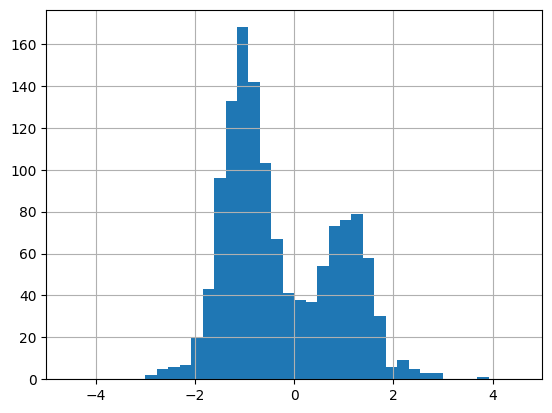

In [733]:
long_nostart[(long_nostart.odd =='left')&(long_nostart.obstacle_cluster ==1)].intial_head_angle_velocity.hist(bins=100)
plt.xlim(-5,5)

(-5.0, 5.0)

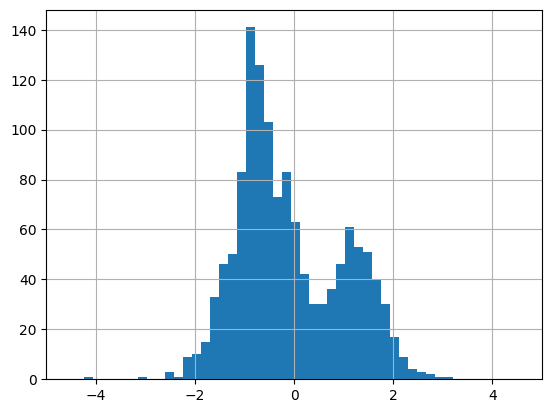

In [734]:
long_nostart[(long_nostart.odd =='right')&(long_nostart.obstacle_cluster ==0)].intial_head_angle_velocity.hist(bins=100)
plt.xlim(-5,5)

(-5.0, 5.0)

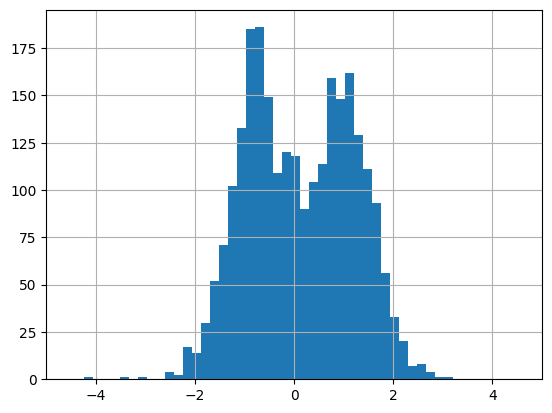

In [767]:
long_nostart[long_nostart.odd =='right'].intial_head_angle_velocity.hist(bins=100)
plt.xlim(-5,5)

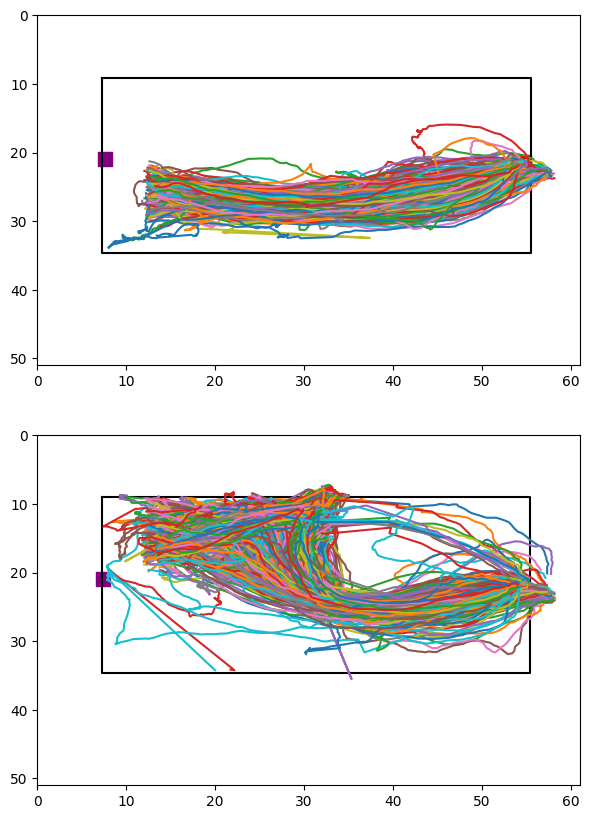

In [711]:
fig,ax = plt.subplots(2,1,figsize = (7,10))
date = 0
cluster = 1
inway = long_nostart[(long_nostart.task=='oa')&(long_nostart.obstacle_cluster==cluster)&(long_nostart.intial_head_angle_velocity>0)&(long_nostart.avg_lateral_error>2)]
outway = long_nostart[(long_nostart.task=='oa')&(long_nostart.obstacle_cluster==cluster)&(long_nostart.intial_head_angle_velocity<0)&(long_nostart.avg_lateral_error<-2)]
plot_arena(inway,ax[0])
plot_arena(outway,ax[1])
for ind,row in inway.iterrows():
    ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm)
for ind,row in outway.iterrows():
    ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm)

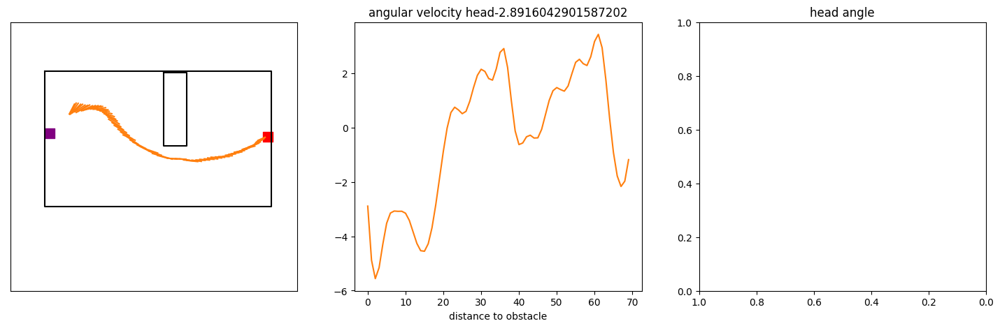

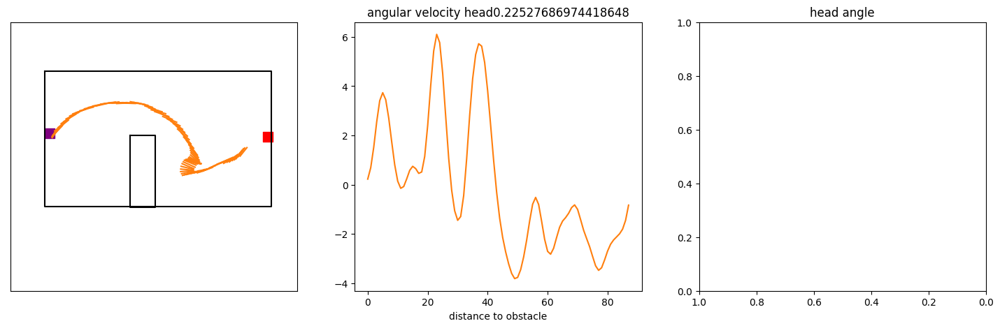

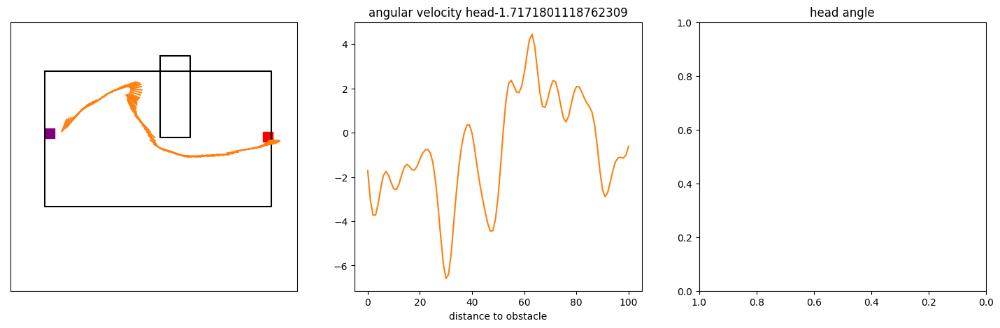

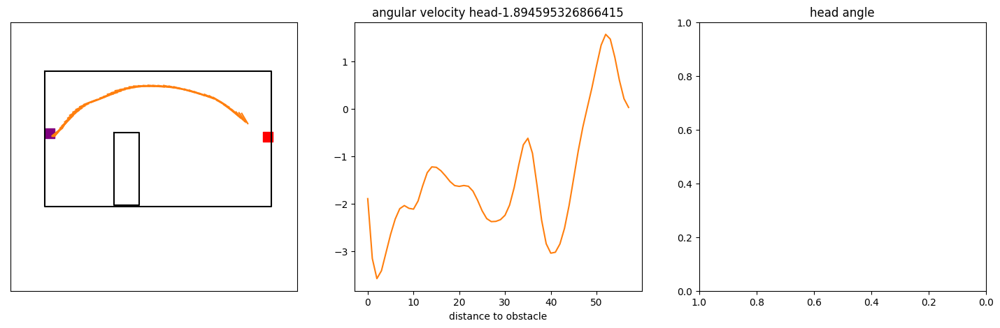

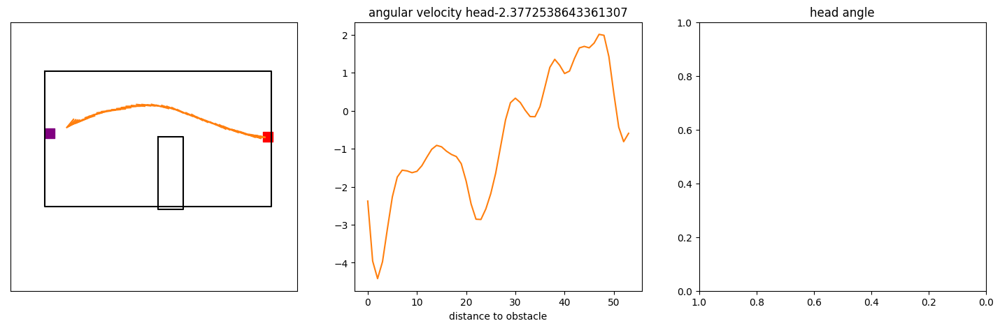

...

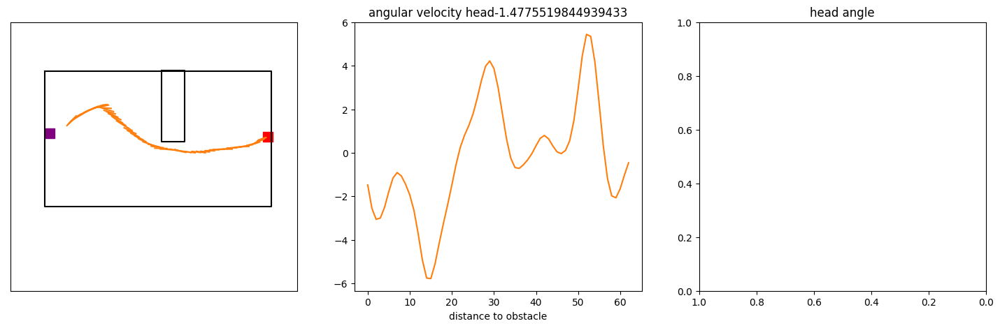

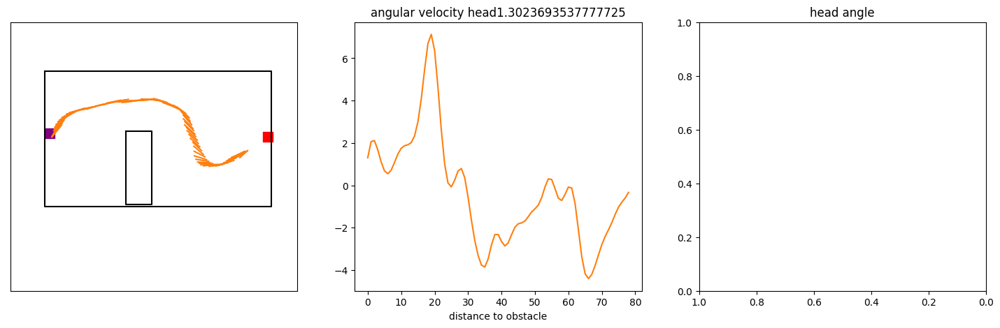

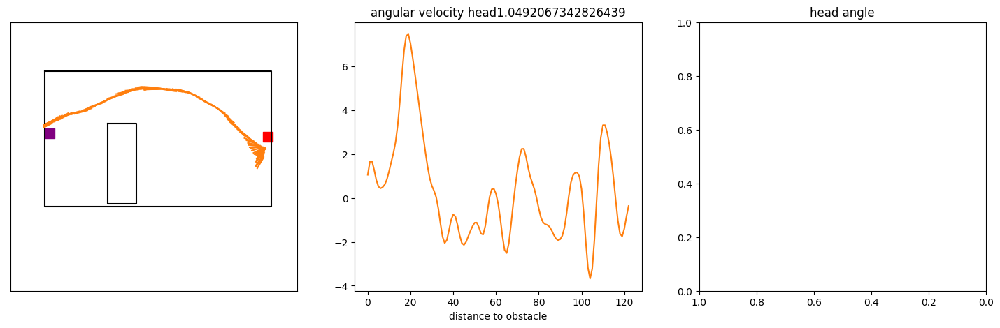

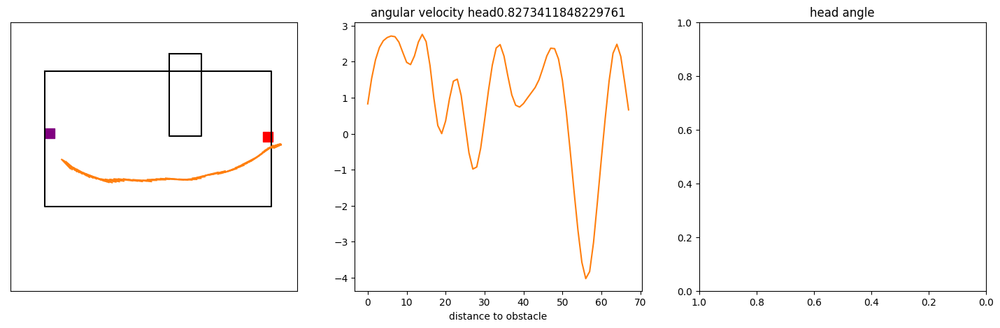

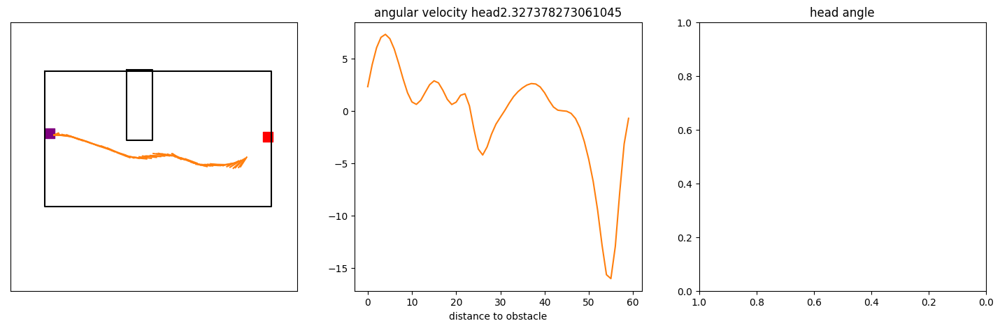

In [290]:
test = long_nostart[long_nostart.date_index == 6.0].sample(15)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('angular velocity head'+ str(row.intial_head_angle_velocity))
    ax[2].set_title('head angle')
   
    #ax[1].set_ylim(-12,2)
    ax[1].set_xlabel('distance to obstacle')
    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    ax[1].plot(row.head_angle_velocity,color = 'tab:orange')
    max = np.nanargmax(row.head_angle_velocity)
    min = np.nanargmin(row.head_angle_velocity)
